In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import math
from statsmodels.tsa.seasonal import seasonal_decompose

In [400]:
combined_df = pd.read_csv("./updated_data.csv")

In [19]:
combined_df

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
32367,25+,Total,United States of America,0.029308,2025,8
32368,25+,Total,United States of America,0.029101,2025,9
32369,25+,Total,United States of America,0.028894,2025,10
32370,25+,Total,United States of America,0.028688,2025,11


In [401]:
filtered_data = combined_df[
    (combined_df['Country'] == "Latvia") &
    (combined_df['Age'] == "15-24") &
    (combined_df['Sex'] == "Male")
]

In [402]:
filtered_data

,Age,Sex,Country,Unemployment Rate (%),Year,Month
460,15-24,Male,Latvia,0.173000,2021,9
461,15-24,Male,Latvia,0.142000,2021,10
462,15-24,Male,Latvia,0.119000,2021,11
463,15-24,Male,Latvia,0.107000,2021,12
464,15-24,Male,Latvia,0.184000,2020,6
...,...,...,...,...,...,...
31677,15-24,Male,Latvia,0.150803,2025,8
31678,15-24,Male,Latvia,0.150177,2025,9
31679,15-24,Male,Latvia,0.149714,2025,10
31680,15-24,Male,Latvia,0.149600,2025,11


## Common part

In [22]:
def prepare_data(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = pd.to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

forecast_results_df = pd.DataFrame(columns=['Model', 'Country', 'Age', 'Sex', 'Date', 'Forecast', 'R^2', 'MSE', 'RMSE', 'MAPE'])

def save_forecast_results(model_name, country, age, sex, predictions, r2, mse, rmse, mape):
    global forecast_results_df

    # Створюємо DataFrame для збереження результатів прогнозу
    results = pd.DataFrame({
        'Model': model_name,
        'Country': country,
        'Age': age,
        'Sex': sex,
        'Date': predictions.index,
        'Forecast': predictions.values,
        'R^2': r2,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape
    })

    if not results.empty and not results.isna().all().all():
        forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)
    else:
        print("Skipping empty or all-NA DataFrame in concatenation.")


# Вносимо зміни в `model_arima` і `model_sarima`, щоб викликати `save_forecast_results`
def model_arima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best ARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=3, max_q=3, m=12,
                              start_P=0, seasonal=False,
                              d=2, D=2, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best ARIMA parameters
    order = stepwise_fit.order

    # Fit the ARIMA model with the selected order
    arima_model = ARIMA(data_filtered['Value'], order=order)
    results_arima = arima_model.fit()

    # Predict using ARIMA
    arima_predictions = results_arima.predict(start='2022-01-01', end='2026-12-01').rename('ARIMA Predictions')

    # Plot ARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(arima_predictions, label='ARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with ARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    # Calculate R^2 Score for ARIMA Predictions
    actual = data_filtered['Value']['2022-01-01':'2025-12-01']
    arima_predictions_trimmed = arima_predictions.loc['2022-01-01':'2025-12-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    arima_predictions_trimmed = arima_predictions_trimmed.loc[actual.index]

    r2_arima = r2_score(actual, arima_predictions_trimmed)
    print(f'R^2 Score for ARIMA: {r2_arima:.2f}')
    mse_arima = mean_squared_error(actual, arima_predictions_trimmed)
    rmse_arima = math.sqrt(mse_arima)
    mape_arima = mean_absolute_percentage_error(actual, arima_predictions_trimmed)
    print(f'ARIMA - MSE: {mse_arima}, RMSE: {rmse_arima}, MAPE: {mape_arima:.2%}')
    save_forecast_results(
        model_name='ARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=arima_predictions,
        r2=r2_arima,
        mse=mse_arima,
        rmse=rmse_arima,
        mape=mape_arima
    )

def model_sarima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best SARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=5, max_q=5, m=12,
                              start_P=0, seasonal=True,
                              d=1, D=1, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best SARIMA parameters
    order = stepwise_fit.order
    seasonal_order = stepwise_fit.seasonal_order

    # Fit the SARIMA model with the selected order
    sarima_model = SARIMAX(data_filtered['Value'], order=order, seasonal_order=seasonal_order)
    results_sarima = sarima_model.fit()

    # Predict using SARIMA
    sarima_predictions = results_sarima.predict(start='2022-01-01', end='2026-12-01').rename('SARIMA Predictions')

    # Plot SARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(sarima_predictions, label='SARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with SARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    # Calculate R^2 Score for SARIMA Predictions
    actual = data_filtered['Value']['2022-01-01':'2025-12-01']
    sarima_predictions_trimmed = sarima_predictions.loc['2022-01-01':'2025-12-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    sarima_predictions_trimmed = sarima_predictions_trimmed.loc[actual.index]

    r2_sarima = r2_score(actual, sarima_predictions_trimmed)
    print(f'R^2 Score for SARIMA: {r2_sarima:.2f}')
    mse_sarima = mean_squared_error(actual, sarima_predictions_trimmed)
    rmse_sarima = math.sqrt(mse_sarima)
    mape_sarima = mean_absolute_percentage_error(actual, sarima_predictions_trimmed)
    print(f'SARIMA - MSE: {mse_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima:.2%}')
    save_forecast_results(
        model_name='SARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=sarima_predictions,
        r2=r2_sarima,
        mse=mse_sarima,
        rmse=rmse_sarima,
        mape=mape_sarima
    )

In [23]:
def calculate_seasonal_strength(data, column='Value', period=12, threshold=0.7):
    decomposition = seasonal_decompose(data[column], model='additive', period=period)
    seasonal_component = decomposition.seasonal
    residual_component = decomposition.resid

    # Calculate seasonal strength
    original_variance = np.var(data[column].dropna())
    residual_variance = np.var(residual_component.dropna())
    seasonal_strength = 1 - (residual_variance / original_variance)

    # Determine seasonality strength
    seasonality_detected = seasonal_strength > threshold

    print(f"Seasonal Strength: {seasonal_strength:.4f}")
    if seasonality_detected:
        print("Strong seasonality detected.")
    else:
        print("Weak or no seasonality detected.")

    return seasonal_strength, seasonality_detected

## ITALY

### 15-24, Male

In [11]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Male')

In [12]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9797
Strong seasonality detected.


(0.9797281491425708, True)

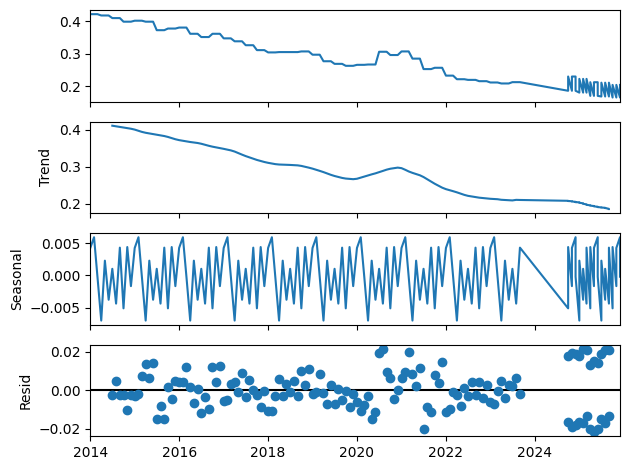

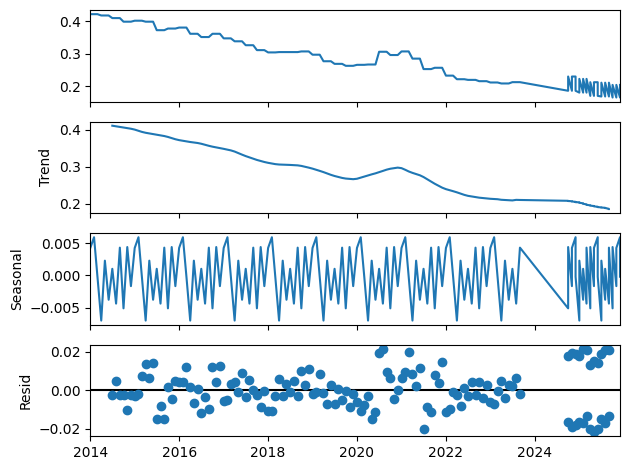

In [13]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Trend (Тренд): Верхня частина графіка показує наявність спадного тренду з деякими коливаннями, що свідчить про поступове зниження рівня показника з часом.

Seasonal (Сезонність): Сезонна компонента демонструє регулярні коливання на певних інтервалах, що вказує на циклічні зміни в даних. Цей компонент свідчить про сезонний характер часового ряду.

Resid (Залишок): Компонента залишків показує відхилення, які не пояснюються трендом або сезонністю.

Зважаючи на наявність чіткої сезонності, використання SARIMA (Seasonal ARIMA) буде більш підходящим для вашої задачі, ніж класична ARIMA. Модель SARIMA дозволяє враховувати як трендові, так і сезонні коливання в даних, що забезпечить точніший прогноз для вашого часового ряду з регулярною сезонністю.

In [14]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-759.220, Time=1.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-703.936, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-744.328, Time=0.69 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-746.543, Time=0.53 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-726.321, Time=0.68 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-757.369, Time=2.67 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-756.078, Time=1.87 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-743.870, Time=1.37 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-755.539, Time=3.81 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-760.559, Time=2.54 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-728.183, Time=0.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-757.359, Time=1.05 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-758.966, Time=2.86 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-757.292, Time=5.44 sec
 ARIMA(0,1,0)(0,1,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


KeyError: 'The `end` argument could not be matched to a location related to the index of the data.'

### 15-24, Female

In [ ]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Female')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
data_filtered

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Тренд: У часовому ряді є чіткий спадний тренд, що свідчить про загальне зниження показника з часом.

Сезонність: Сезонна компонента демонструє регулярні коливання, що вказує на наявність повторюваних сезонних циклів у даних.

Залишок: Компонента залишків показує невеликі відхилення від тренду і сезонності, але вони не виглядають суттєвими.

Зважаючи на наявність як тренду, так і сезонності, SARIMA (Seasonal ARIMA) буде оптимальним вибором для цього часового ряду. Модель SARIMA дозволяє враховувати і трендові, і сезонні коливання, що зробить прогноз точнішим у порівнянні з класичною ARIMA, яка не враховує сезонність.

In [ ]:
model_sarima(data_filtered, 'Italy', '15-24', 'Female')

In [ ]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

### 15-24, Total

In [ ]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Total')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
data_filtered

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Сезонність: Видно регулярні циклічні зміни, що означає наявність сезонної компоненти.
Тренд: Спостерігається загальна тенденція зниження, яка також може бути змодельована в SARIMA.
Випадкові залишки: Резідуальні коливання виглядають близькими до нуля, що може вказувати на те, що основні патерни враховані, але залишкові випадкові коливання все одно потребують сезонної корекції для підвищення точності.

In [ ]:
model_sarima(data_filtered, 'Italy', '15-24', 'Total')

### 25+, Female

In [ ]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Female')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
data_filtered

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered, 'Italy', '25+', 'Female')

### 25+ Male

In [ ]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Male')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


In [ ]:
model_sarima(data_filtered, 'Italy', '25+', 'Male')

### 25+, Total

In [ ]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Total')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered, 'Italy', '25+', 'Total')

## France

### 15-24, Male

In [25]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Male')

In [26]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9424
Strong seasonality detected.


(0.9424387809135475, True)

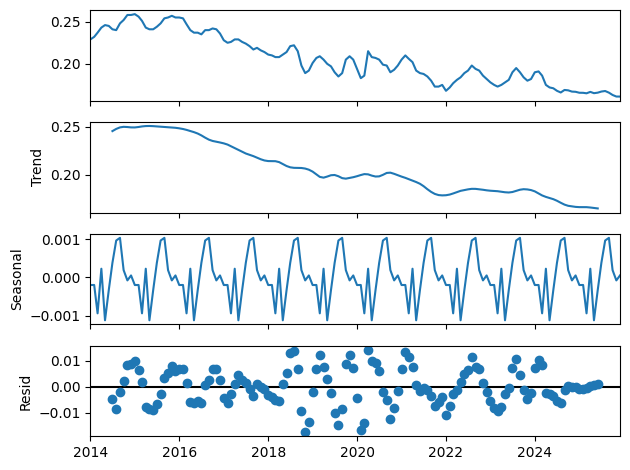

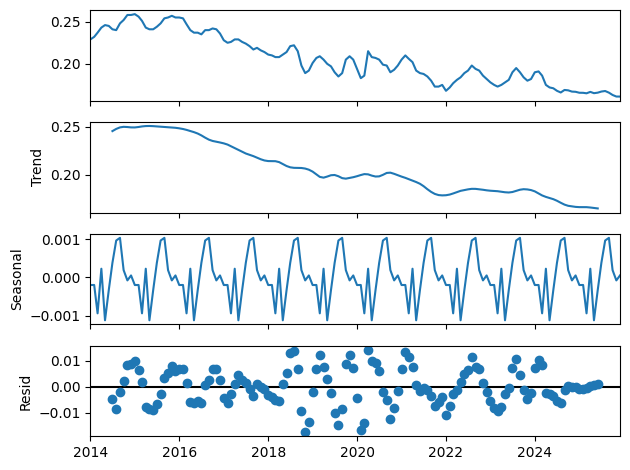

In [27]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-970.351, Time=3.68 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-871.208, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-934.986, Time=1.66 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-973.251, Time=1.25 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-899.442, Time=0.57 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-973.361, Time=3.60 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-938.395, Time=0.57 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-957.902, Time=7.39 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-967.259, Time=2.67 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-975.186, Time=2.98 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-957.095, Time=1.43 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-972.533, Time=2.44 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-974.259, Time=2.97 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-972.461, Time=5.37 sec
 ARIMA(1,1,2)(0,1,2

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


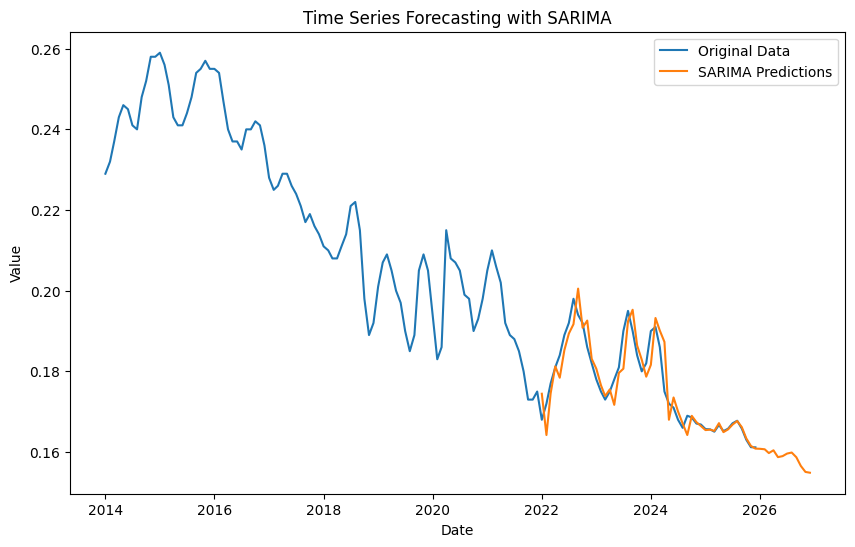

R^2 Score for SARIMA: 0.85
SARIMA - MSE: 1.6313103968610168e-05, RMSE: 0.004038948374095684, MAPE: 1.56%


C:\Users\Admin\AppData\Local\Temp\ipykernel_20032\1339813749.py:40: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)


In [28]:
model_sarima(data_filtered,'France', '15-24', 'Male')

### 15-24, Female

In [29]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Female')

In [30]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9659
Strong seasonality detected.


(0.9659322879375591, True)

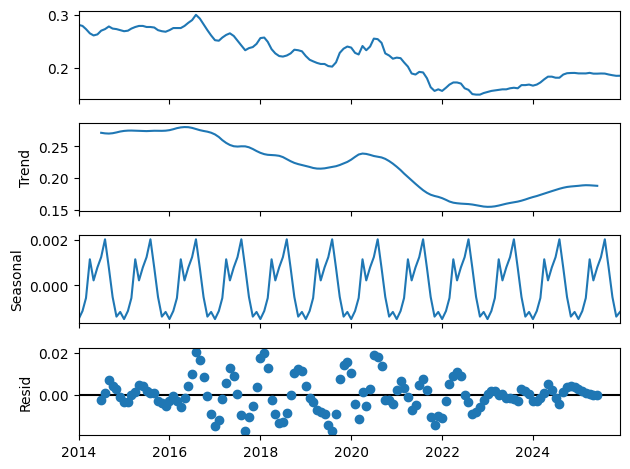

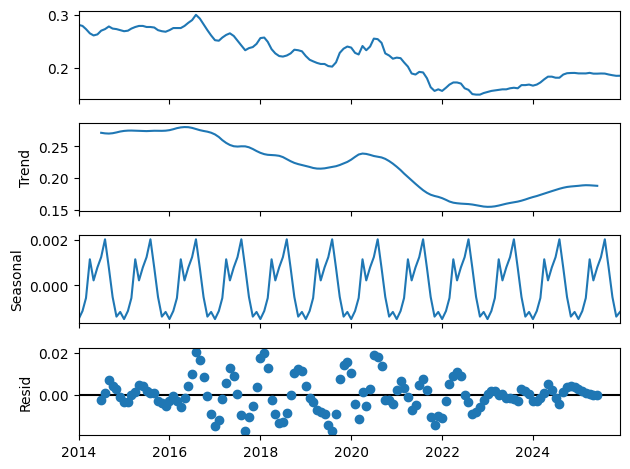

In [31]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-944.330, Time=0.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-862.604, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-923.445, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-904.513, Time=0.23 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-959.976, Time=1.63 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-924.332, Time=0.44 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=inf, Time=2.72 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-959.295, Time=3.83 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-930.092, Time=1.59 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=3.46 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.92 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-930.800, Time=0.09 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=i

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


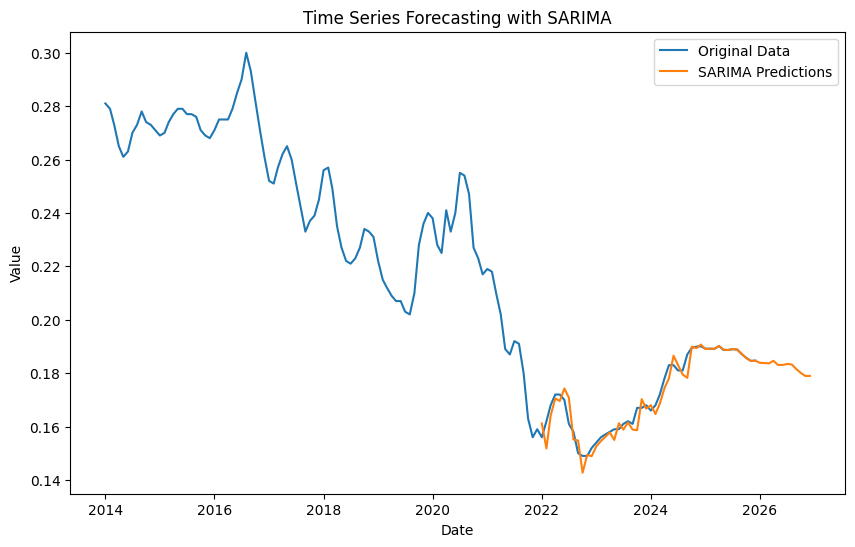

R^2 Score for SARIMA: 0.93
SARIMA - MSE: 1.305102442957517e-05, RMSE: 0.0036126201612645594, MAPE: 1.48%


In [32]:
model_sarima(data_filtered,'France', '15-24', 'Female')

### 15-24, Total

In [33]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Total')

In [34]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9763
Strong seasonality detected.


(0.9762971232688793, True)

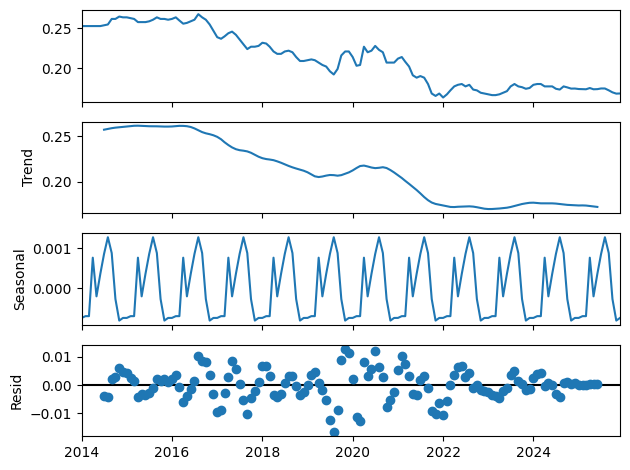

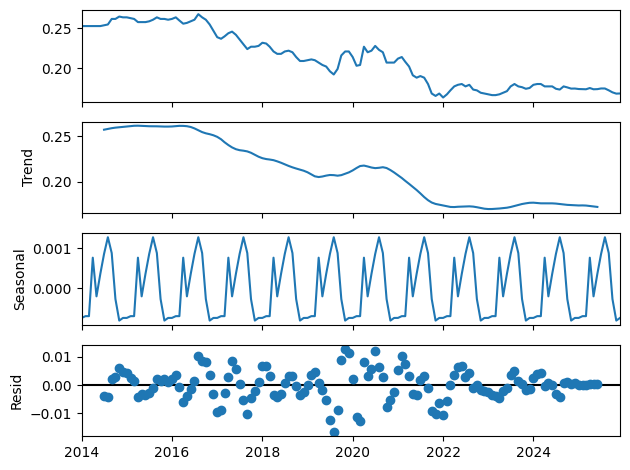

In [35]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1002.663, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-916.636, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-969.886, Time=1.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1005.204, Time=1.41 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-937.394, Time=0.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-993.188, Time=1.83 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.77 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-971.365, Time=1.28 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.84 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-994.322, Time=0.30 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1003.308, Time=0.30 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1006.499, Time=0.88 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-932.860, Time=0.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-994.088, Time=3.35 sec
 ARIMA(1,1,0)(0,1,2)[12] 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


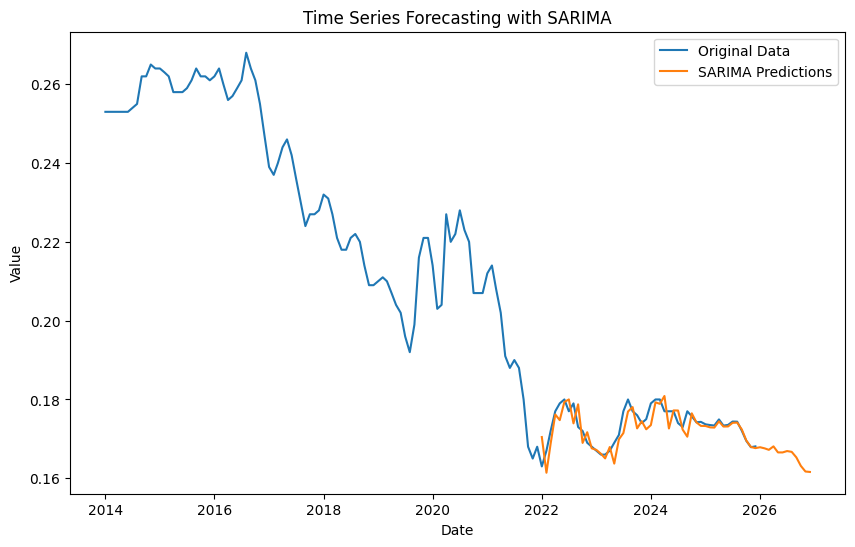

R^2 Score for SARIMA: 0.53
SARIMA - MSE: 8.604869105505004e-06, RMSE: 0.0029334057178482835, MAPE: 1.18%


In [36]:
model_sarima(data_filtered,'France', '15-24', 'Total')

### 25+, Male

In [37]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Male')

In [38]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9678
Strong seasonality detected.


(0.9678221636465704, True)

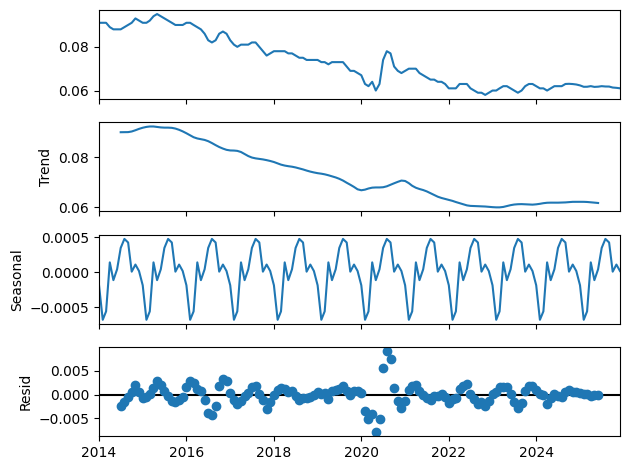

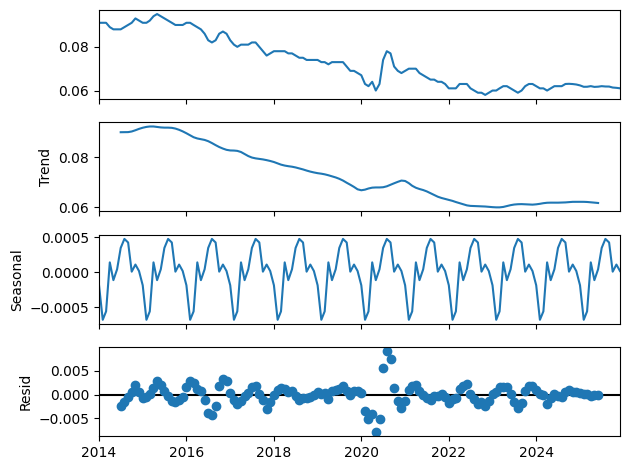

In [39]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1289.968, Time=0.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1202.334, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1259.590, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1292.677, Time=0.81 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1238.182, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1280.609, Time=1.30 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1234.182, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1267.981, Time=0.59 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1261.677, Time=0.86 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1286.508, Time=1.65 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1282.192, Time=1.00 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1294.708, Time=0.71 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1245.191, Time=0.35 sec
 ARIMA(1,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


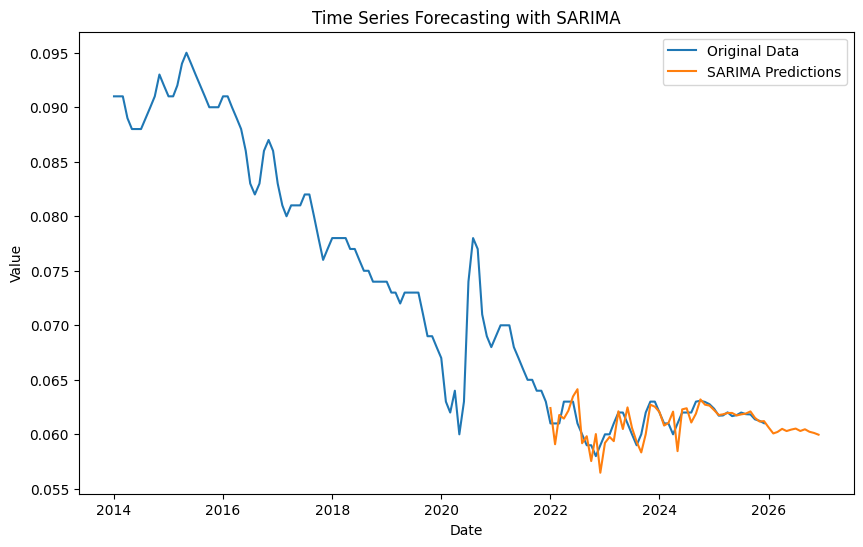

R^2 Score for SARIMA: 0.18
SARIMA - MSE: 1.2927954134755354e-06, RMSE: 0.0011370116153652677, MAPE: 1.32%


In [40]:
model_sarima(data_filtered,'France', '25+', 'Male')

### 25+, Female

In [41]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [42]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9236
Strong seasonality detected.


(0.9235530733354279, True)

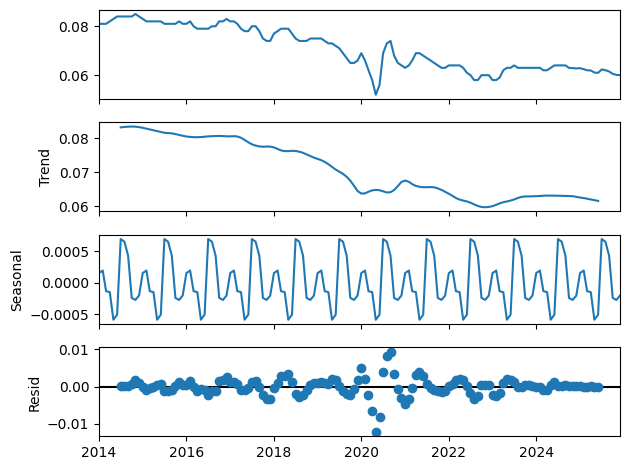

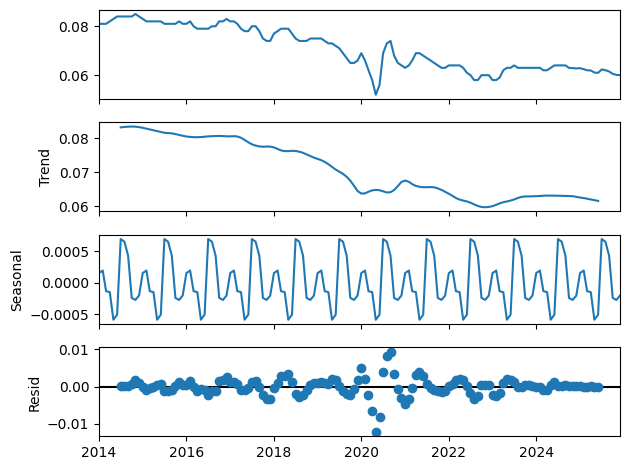

In [43]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1162.712, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1226.276, Time=0.70 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1193.195, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1245.944, Time=1.18 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1247.824, Time=1.25 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1252.755, Time=0.90 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1265.065, Time=1.62 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1239.547, Time=1.35 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1282.990, Time=1.67 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(2,1,0)(1,1,2)[12]           

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


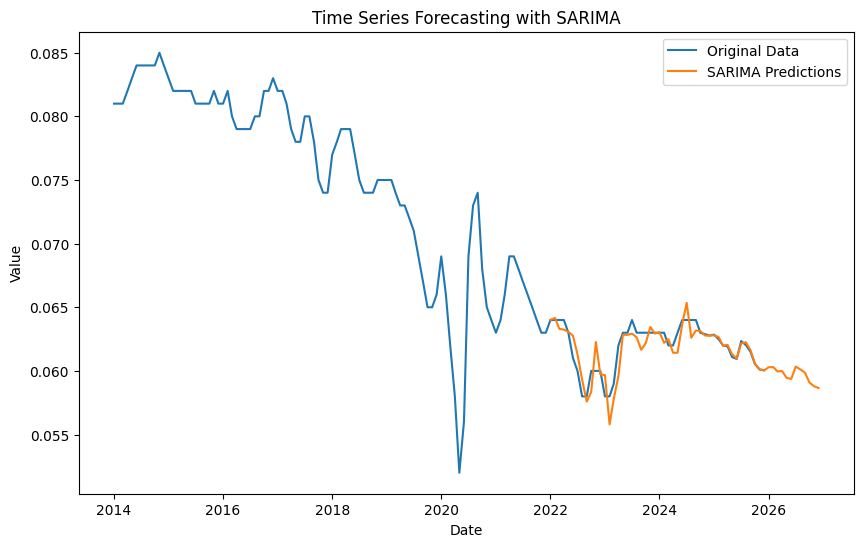

R^2 Score for SARIMA: 0.72
SARIMA - MSE: 8.979642624348059e-07, RMSE: 0.0009476097627371755, MAPE: 1.07%


In [44]:
model_sarima(data_filtered,'France', '25+', 'Female')

### 25+, Total

In [45]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [46]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9236
Strong seasonality detected.


(0.9235530733354279, True)

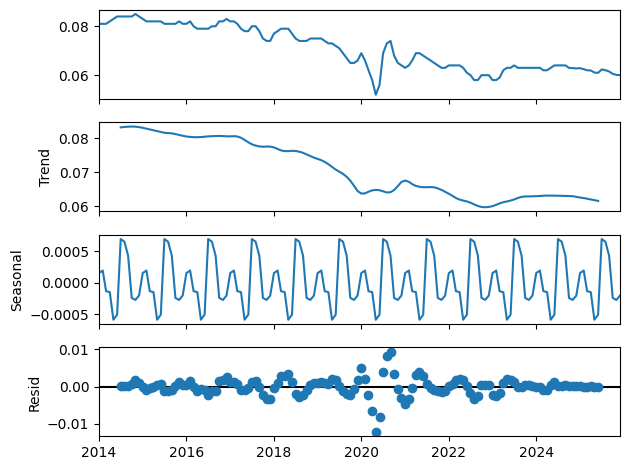

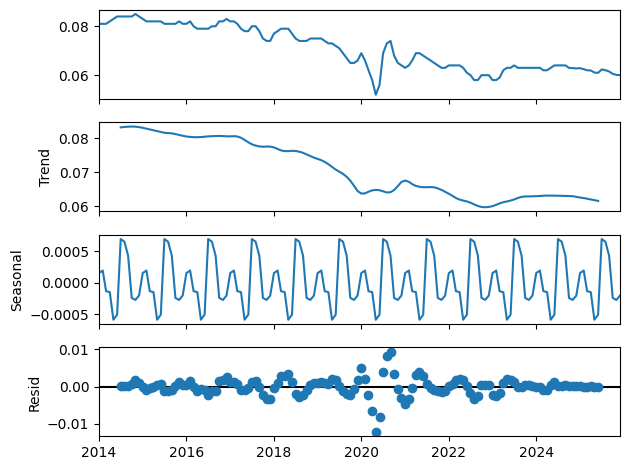

In [47]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1162.712, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1226.276, Time=0.66 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1193.195, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1245.944, Time=1.20 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1247.824, Time=1.29 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1252.755, Time=1.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.53 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1265.065, Time=2.00 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1239.547, Time=1.31 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1282.990, Time=1.96 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(2,1,0)(1,1,2)[12]           

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


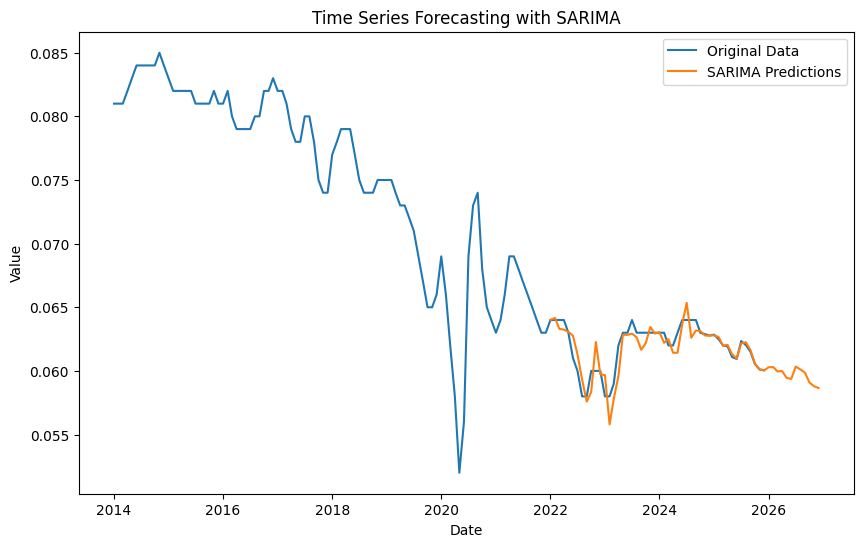

R^2 Score for SARIMA: 0.72
SARIMA - MSE: 8.979642624348059e-07, RMSE: 0.0009476097627371755, MAPE: 1.07%


In [48]:
model_sarima(data_filtered,'France', '25+', 'Total')

## Iceland

### 15-24,Male

In [49]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Male')

In [50]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9861
Strong seasonality detected.


(0.9860976905830147, True)

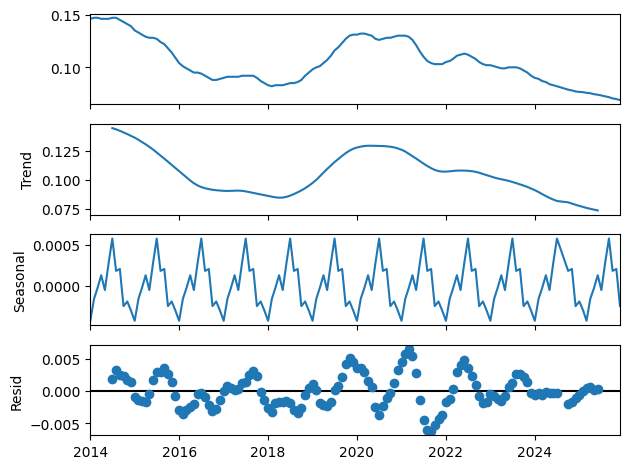

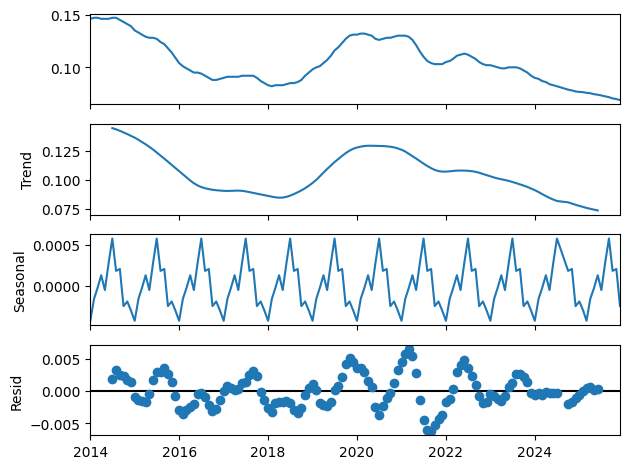

In [51]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [52]:
model_sarima(data_filtered,'Iceland', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1361.134, Time=1.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1162.685, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1333.074, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1292.767, Time=1.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1307.814, Time=0.07 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1352.684, Time=1.47 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1303.815, Time=1.29 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1332.638, Time=0.60 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1311.806, Time=1.80 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1361.538, Time=0.75 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1307.883, Time=0.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1353.136, Time=0.61 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1303.886, Time=0.92 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1312.004, Time=1.08 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


KeyError: 'The `end` argument could not be matched to a location related to the index of the data.'

### 15-24, Female

In [ ]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Female')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered,'Iceland', '15-24', 'Female')

### 15-24, Total

In [ ]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Total')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered,'Iceland', '15-24', 'Total')

### 25+, Male

In [ ]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Male')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered,'Iceland', '25+', 'Male')

### 25+, Female

In [ ]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Female')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered,'Iceland', '25+', 'Female')

### 25+, Total

In [ ]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Total')

In [ ]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

In [ ]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

In [ ]:
model_sarima(data_filtered,'Iceland', '25+', 'Total')

## Greece

### 15-24, Female

In [53]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Female')

In [54]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8728
Strong seasonality detected.


(0.8727596993337436, True)

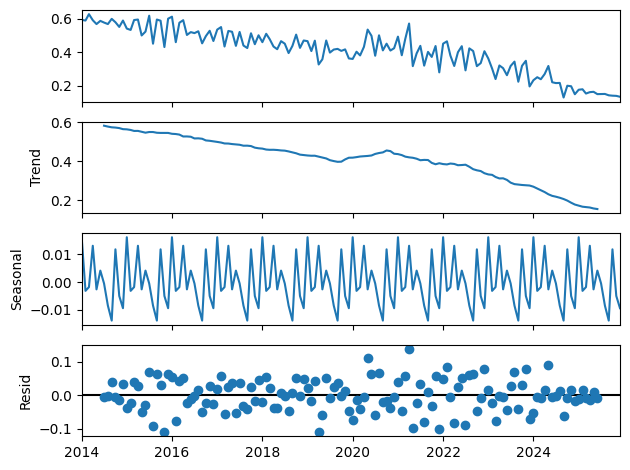

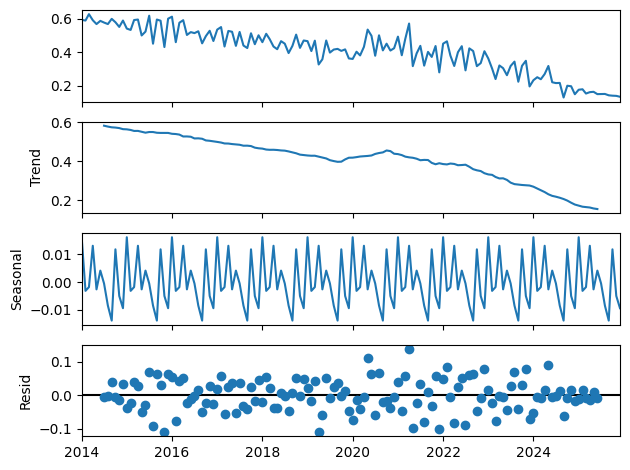

In [55]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-194.392, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-277.154, Time=1.01 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-224.526, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-300.692, Time=2.02 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-310.606, Time=1.66 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-310.775, Time=1.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-311.851, Time=3.29 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-312.251, Time=1.27 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-280.322, Time=1.72 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=3.32 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-363.298, Time=2.38 sec
 ARIMA(1,1,1)(1,1,2)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


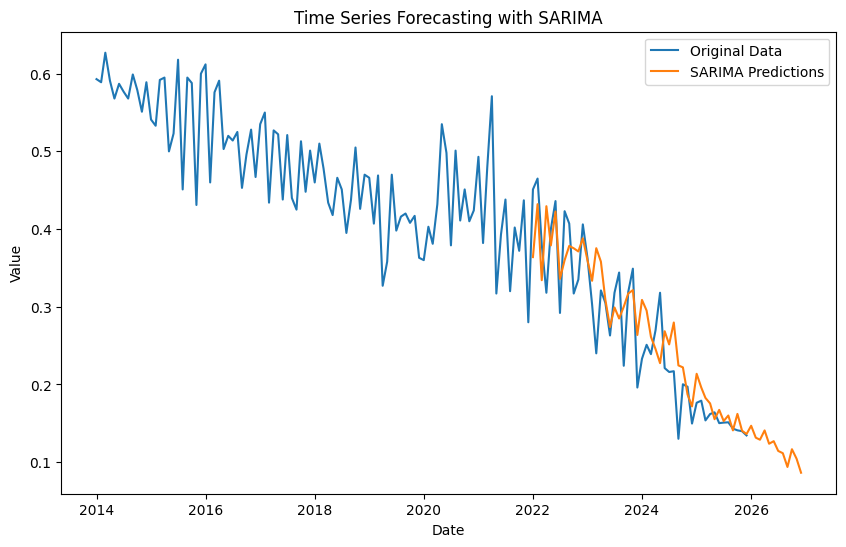

R^2 Score for SARIMA: 0.76
SARIMA - MSE: 0.002277455689131375, RMSE: 0.047722695744596984, MAPE: 14.66%


In [56]:
model_sarima(data_filtered,'Greece', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-184.410, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-237.336, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-186.410, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-358.244, Time=0.24 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-387.958, Time=0.39 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-434.005, Time=0.90 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec

Best model:  ARIMA(3,2,1)(0,0,0)[0] intercept
Total fit time: 5.860 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Mod

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


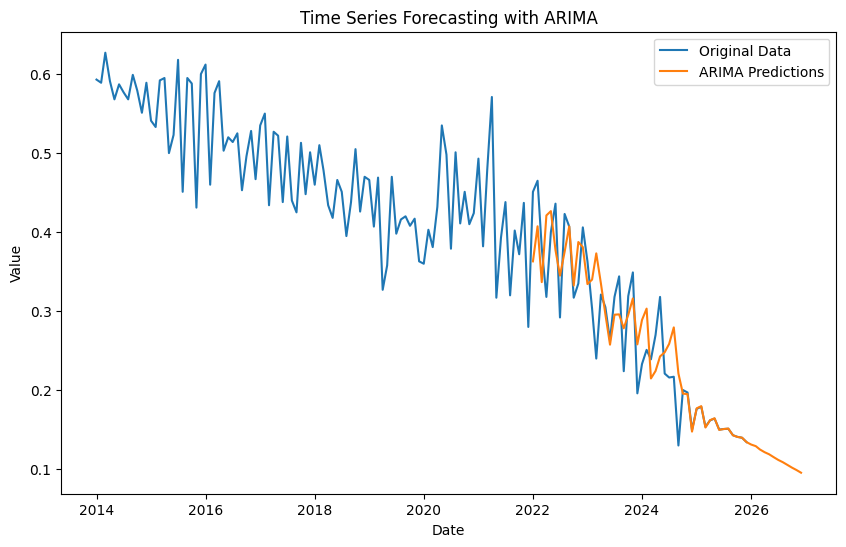

R^2 Score for ARIMA: 0.79
ARIMA - MSE: 0.002018034256163716, RMSE: 0.04492253617243483, MAPE: 11.75%


In [57]:
model_arima(data_filtered,'Greece', '15-24', 'Female')

### 15-24, Male

In [58]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Male')

In [59]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9300
Strong seasonality detected.


(0.929996576636421, True)

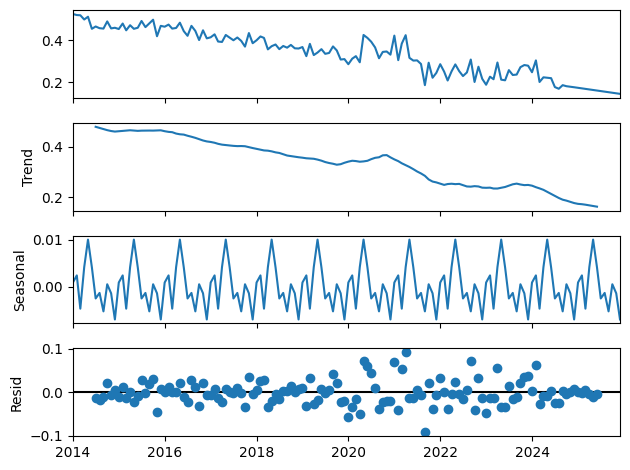

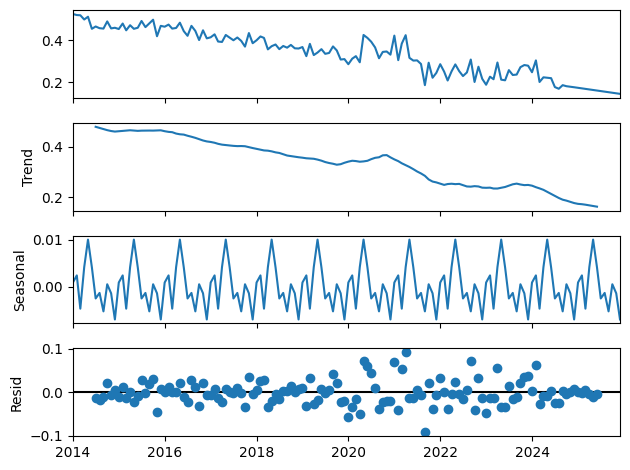

In [60]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-359.777, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-439.916, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.26 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-389.897, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-447.123, Time=0.45 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.84 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-411.118, Time=0.13 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-468.057, Time=0.69 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-455.704, Time=0.76 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-466.141, Time=1.00 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-466.1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


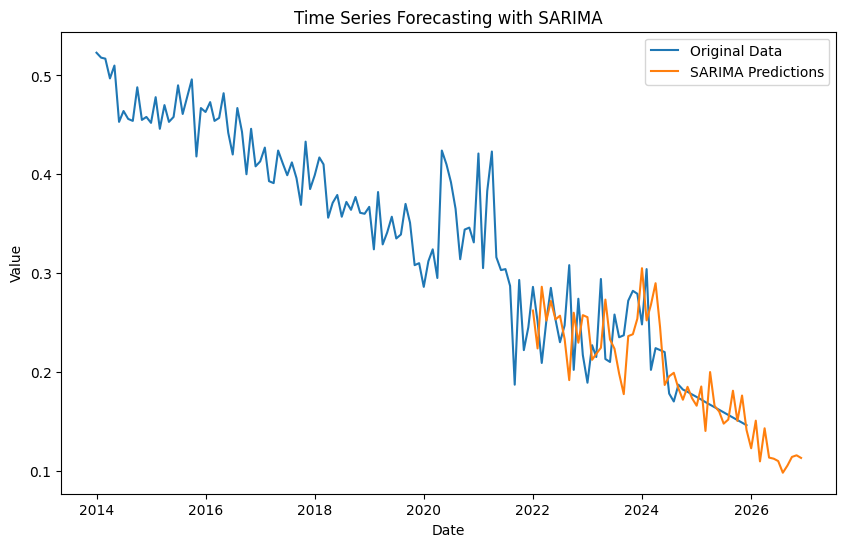

R^2 Score for SARIMA: 0.29
SARIMA - MSE: 0.0015380480615933305, RMSE: 0.03921795585689456, MAPE: 13.46%


In [61]:
model_sarima(data_filtered,'Greece', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-355.988, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-433.612, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-357.988, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-503.571, Time=0.40 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-522.913, Time=0.47 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-553.065, Time=0.16 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-563.401, Time=0.81 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-555.123, Time=0.60 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-547.849, Time=0.49 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.67 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 5.795 seconds
                               SARIMAX Results                                
Dep. V

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


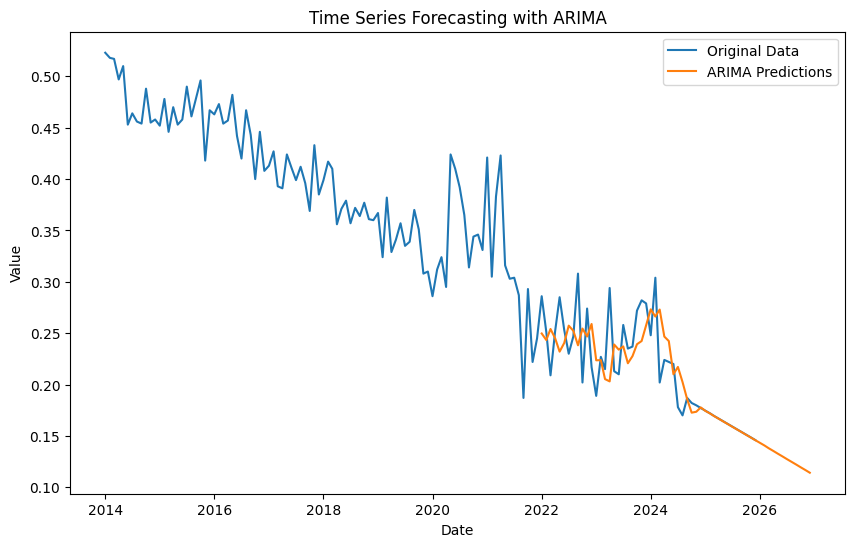

R^2 Score for ARIMA: 0.59
ARIMA - MSE: 0.000892051029058722, RMSE: 0.029867223323548544, MAPE: 8.74%


In [62]:
model_arima(data_filtered,'Greece', '15-24', 'Male')

### 15-24, Total

In [63]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Total')

In [64]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9311
Strong seasonality detected.


(0.9310516618705224, True)

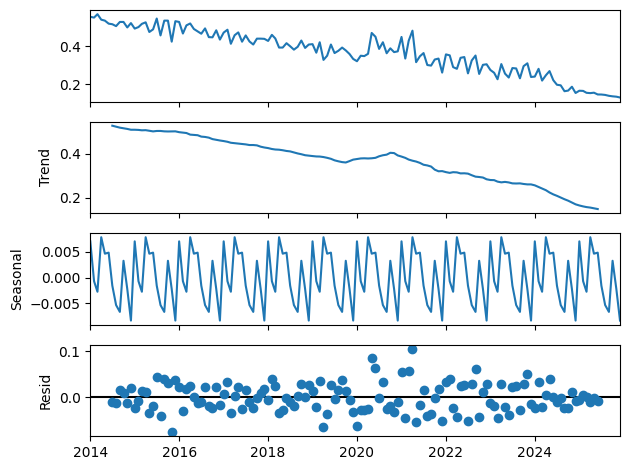

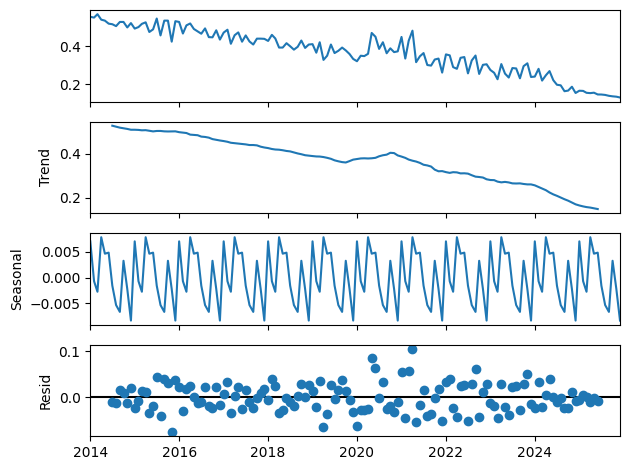

In [65]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-317.781, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-400.177, Time=0.61 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-338.268, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-416.684, Time=0.68 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-430.987, Time=1.19 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-432.866, Time=0.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-431.254, Time=1.68 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-433.110, Time=0.98 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-405.437, Time=0.77 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-470.884, Time=1.62 sec
 ARIMA(1,1,1)(1,1,2)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


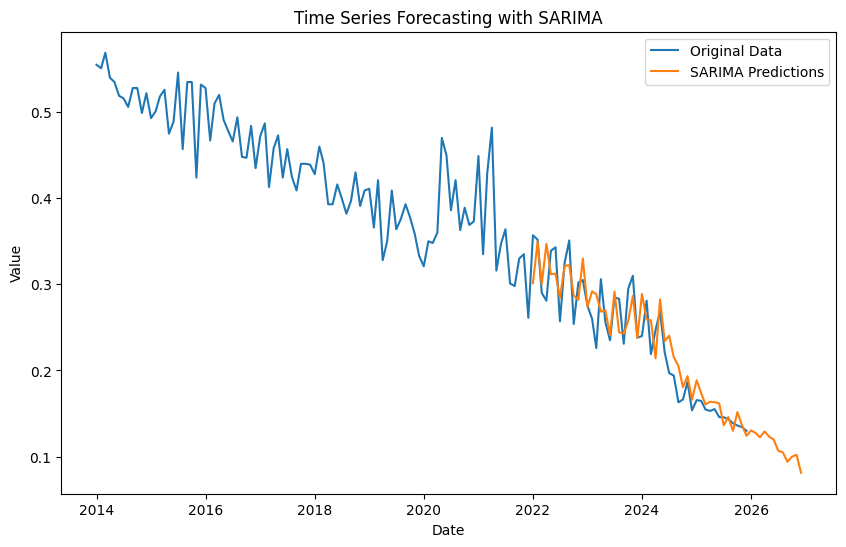

R^2 Score for SARIMA: 0.85
SARIMA - MSE: 0.000729900699562701, RMSE: 0.027016674472678925, MAPE: 9.12%


In [66]:
model_sarima(data_filtered,'Greece', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-495.882, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-328.555, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-373.894, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-330.555, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-509.458, Time=0.05 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-526.852, Time=0.77 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-563.672, Time=0.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-565.810, Time=0.20 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-571.378, Time=1.45 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AI

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


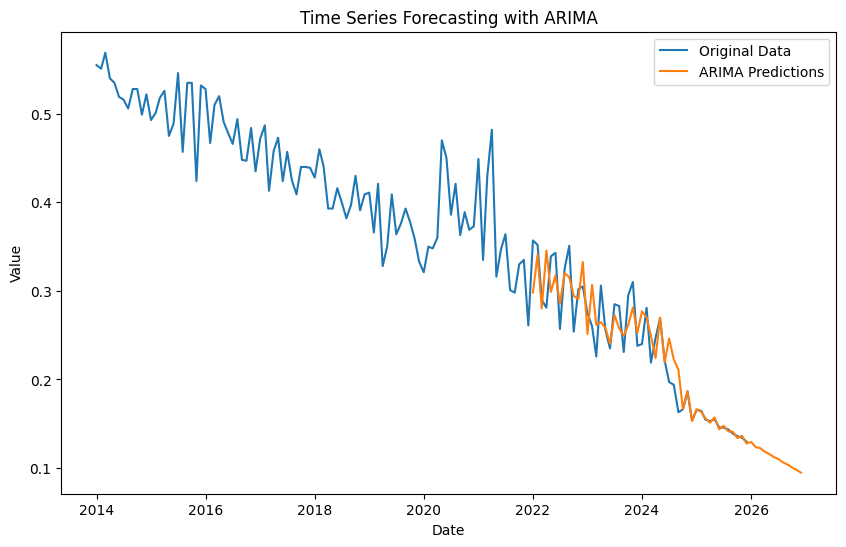

R^2 Score for ARIMA: 0.86
ARIMA - MSE: 0.0006723422558624388, RMSE: 0.025929563356571178, MAPE: 7.34%


In [67]:
model_arima(data_filtered,'Greece', '15-24', 'Total')

### 25+, Female

In [68]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Female')

In [69]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9895
Strong seasonality detected.


(0.9895237979474566, True)

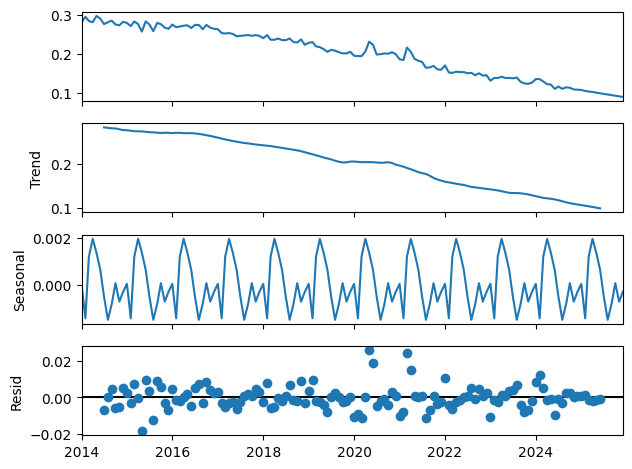

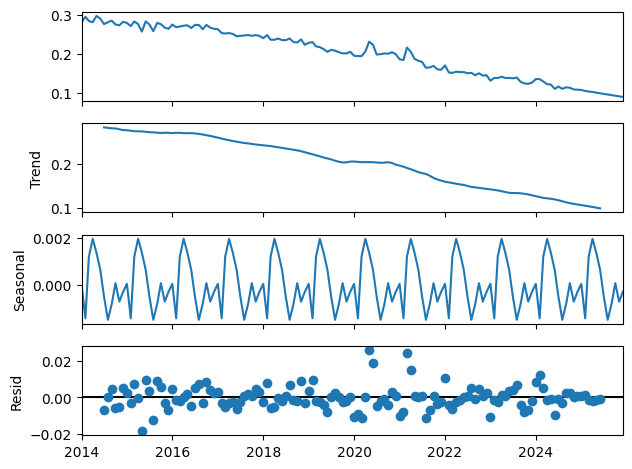

In [70]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-867.589, Time=0.81 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-760.596, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-816.503, Time=0.52 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-865.336, Time=1.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-787.770, Time=0.56 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-868.067, Time=1.38 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-839.109, Time=1.11 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-858.644, Time=1.89 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=3.47 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-869.991, Time=1.71 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-868.121, Time=1.04 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-848.403, Time=0.96 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-878.582, Time=1.40 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-875.192, Time=1.06 sec
 ARIMA(2,1,1)(1,1,2)[12]

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


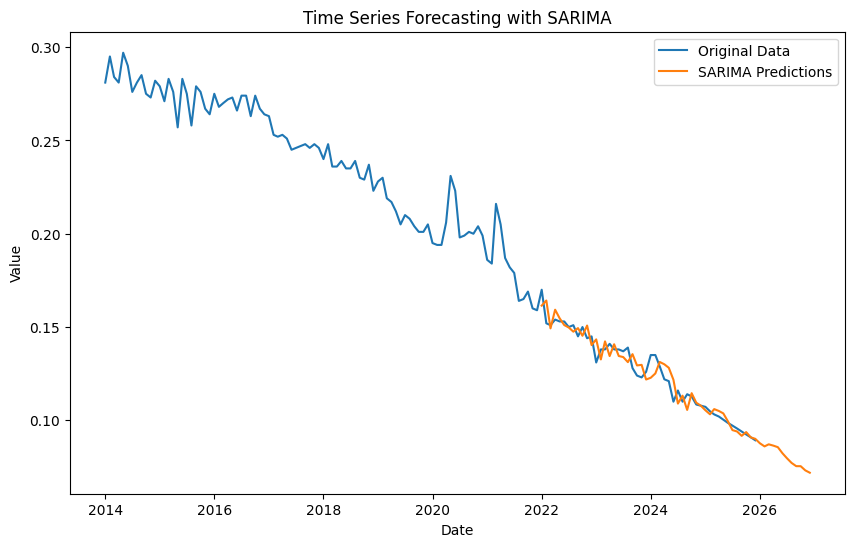

R^2 Score for SARIMA: 0.93
SARIMA - MSE: 3.235386315888008e-05, RMSE: 0.0056880456361460465, MAPE: 3.57%


In [71]:
model_sarima(data_filtered,'Greece', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-941.467, Time=0.68 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-827.139, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-855.519, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-938.417, Time=0.03 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-829.129, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-971.700, Time=1.34 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-929.722, Time=0.26 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-968.060, Time=1.05 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-974.994, Time=0.75 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-972.996, Time=1.26 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-978.939, Time=0.78 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-969.857, Time=0.29 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-978.733, Time=0.96 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=-986.785, Time=1.31 sec
 ARIMA(1,2,3)(0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


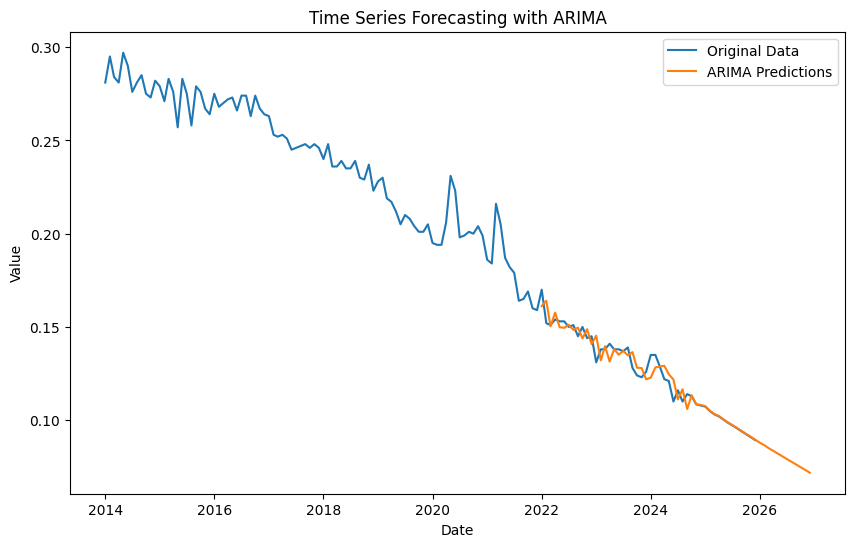

R^2 Score for ARIMA: 0.93
ARIMA - MSE: 2.8916074231433153e-05, RMSE: 0.005377366849251886, MAPE: 2.84%


In [72]:
model_arima(data_filtered,'Greece', '25+', 'Female')

### 25+, Male

In [73]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Male')

In [74]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9926
Strong seasonality detected.


(0.9925893081020323, True)

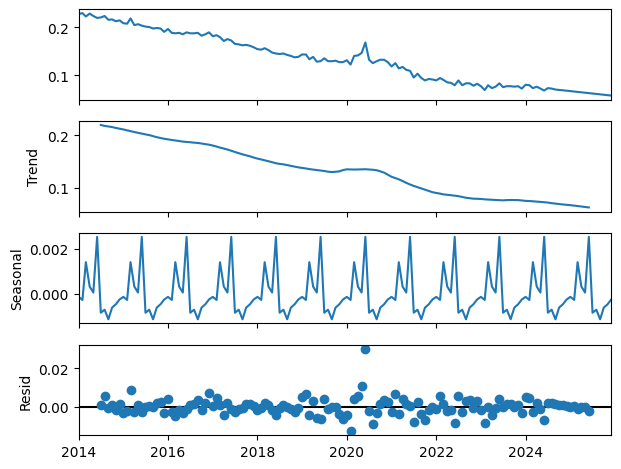

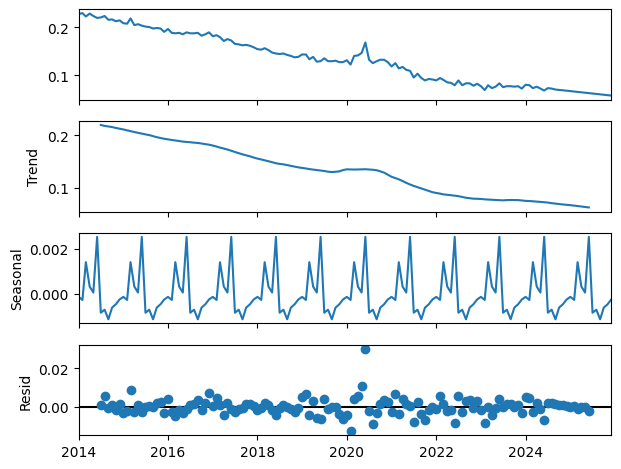

In [75]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-833.296, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-895.747, Time=0.94 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-855.241, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-935.881, Time=1.63 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-939.097, Time=1.62 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.07 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-952.661, Time=2.41 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-932.993, Time=1.03 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-955.762, Time=3.44 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=inf, Time=3.53 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-958.646, Time=2.20 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


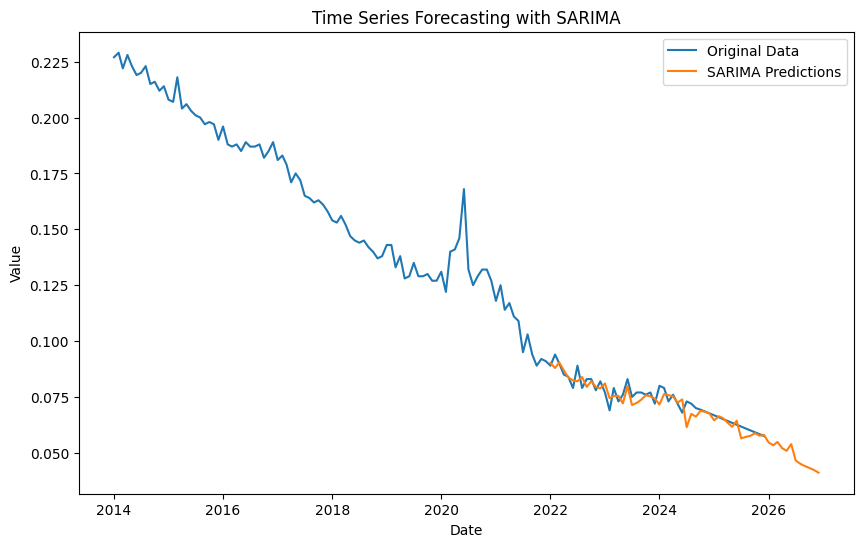

R^2 Score for SARIMA: 0.83
SARIMA - MSE: 1.3430578500293024e-05, RMSE: 0.003664775368326553, MAPE: 3.76%


In [76]:
model_sarima(data_filtered,'Greece', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1041.206, Time=0.57 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-896.095, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-965.330, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-898.094, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1056.696, Time=0.90 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1019.595, Time=0.04 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1050.502, Time=0.71 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1056.047, Time=0.21 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1032.845, Time=0.42 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1021.065, Time=0.63 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1025.026, Time=0.94 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1060.276, Time=0.10 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1043.151, Time=0.47 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-1021.595, Time=0.12 sec
 ARI

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


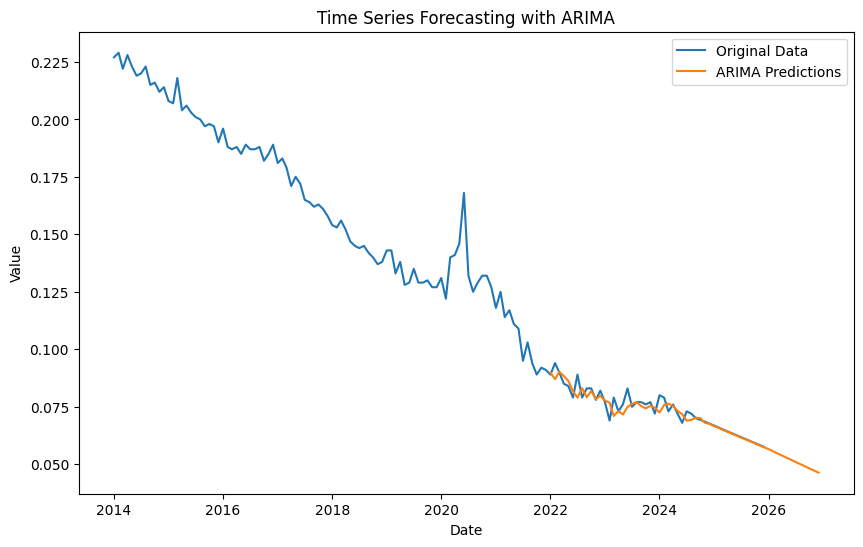

R^2 Score for ARIMA: 0.85
ARIMA - MSE: 1.1621802955067299e-05, RMSE: 0.0034090765545917705, MAPE: 2.82%


In [77]:
model_arima(data_filtered,'Greece', '25+', 'Male')

### 25+, Total

In [78]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Total')

In [79]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9940
Strong seasonality detected.


(0.9939577664840411, True)

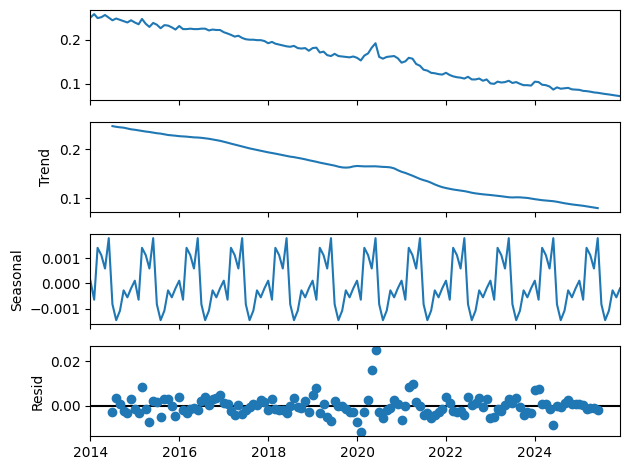

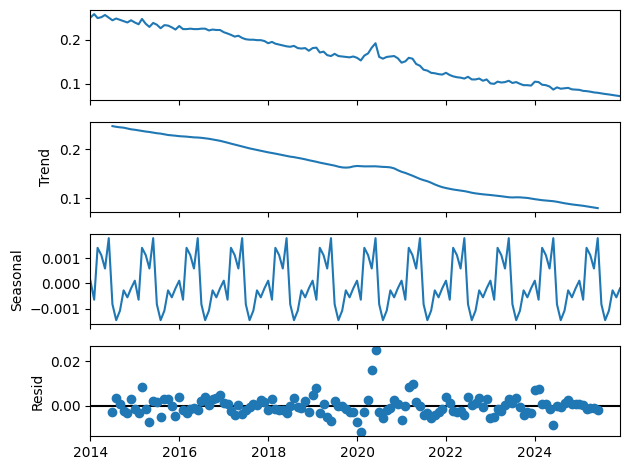

In [80]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-874.377, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-923.951, Time=0.98 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-968.038, Time=0.73 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-884.200, Time=0.27 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-964.815, Time=0.89 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-926.856, Time=0.99 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.97 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-958.400, Time=0.32 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-974.746, Time=0.73 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-892.048, Time=1.05 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=inf, Time=1.55 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


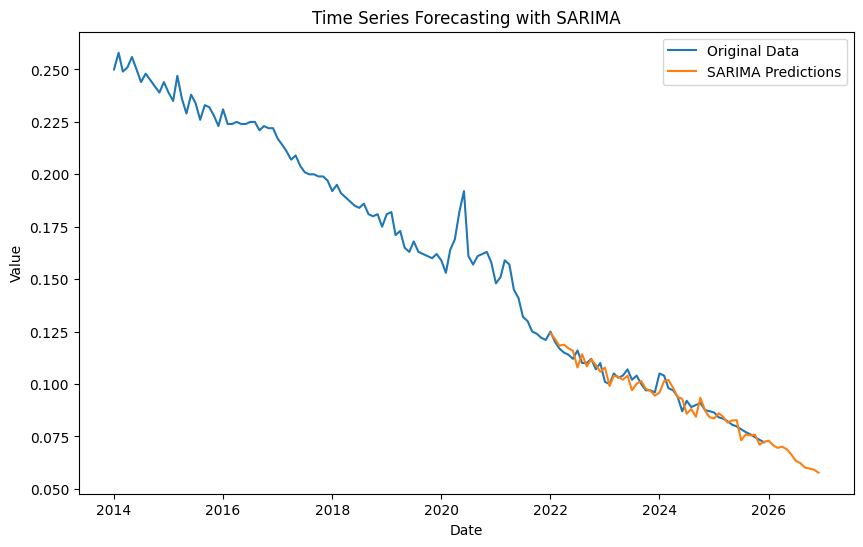

R^2 Score for SARIMA: 0.94
SARIMA - MSE: 1.1372513763039016e-05, RMSE: 0.0033723157863757387, MAPE: 2.67%


In [81]:
model_sarima(data_filtered,'Greece', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1058.831, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-965.416, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-996.738, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1054.576, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-967.407, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1074.514, Time=0.78 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1044.146, Time=0.23 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1060.738, Time=0.61 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1088.409, Time=0.22 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1076.667, Time=1.20 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1081.063, Time=0.85 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1085.363, Time=1.64 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1085.327, Time=0.15 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-1071.831, Time=1.64 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-1095.187, Time=0.13 se

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


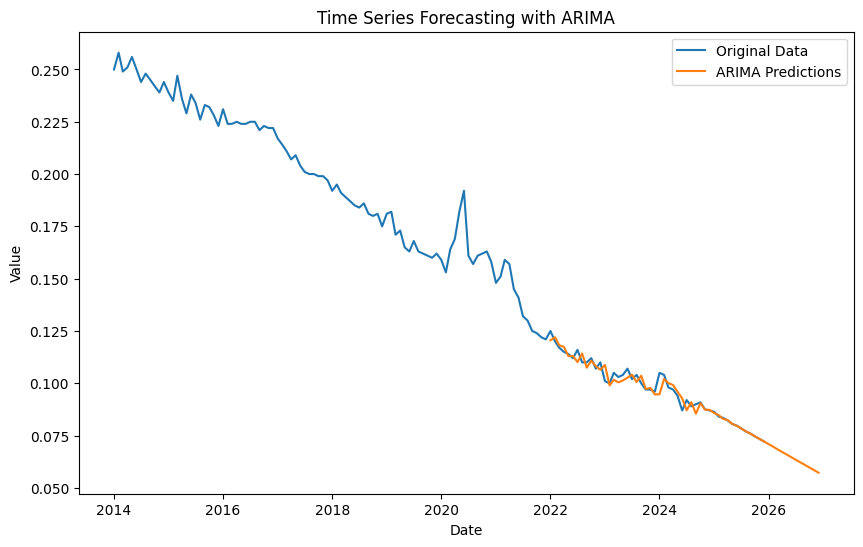

R^2 Score for ARIMA: 0.95
ARIMA - MSE: 9.31282371536021e-06, RMSE: 0.003051691943063751, MAPE: 2.08%


In [82]:
model_arima(data_filtered,'Greece', '25+', 'Total')

# Spain

### 15-24, Female

In [83]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Female')

In [84]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9743
Strong seasonality detected.


(0.9743399147306723, True)

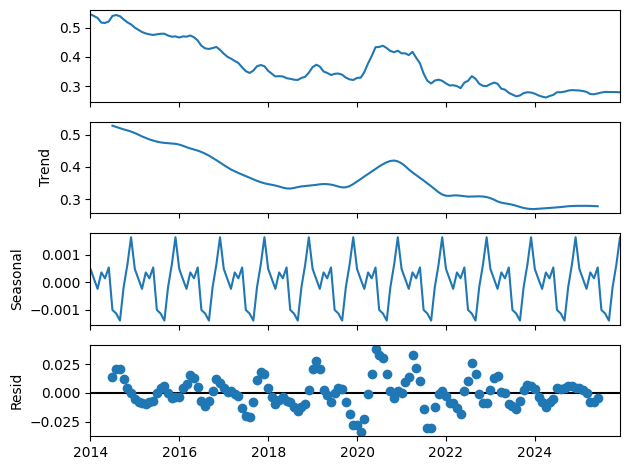

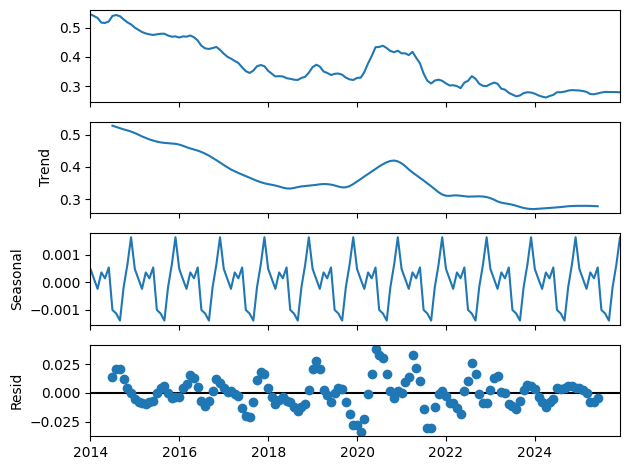

In [85]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-724.080, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-817.039, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.58 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-786.184, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-825.461, Time=1.98 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.99 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-775.381, Time=4.54 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-825.063, Time=1.31 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-824.153, Time=0.71 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-809.548, Time=1.59 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-821.484, Time=1.61 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-823.537, Time=1.93 sec

Best model:  ARIMA(1,1,0)(2,1,0)[12]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


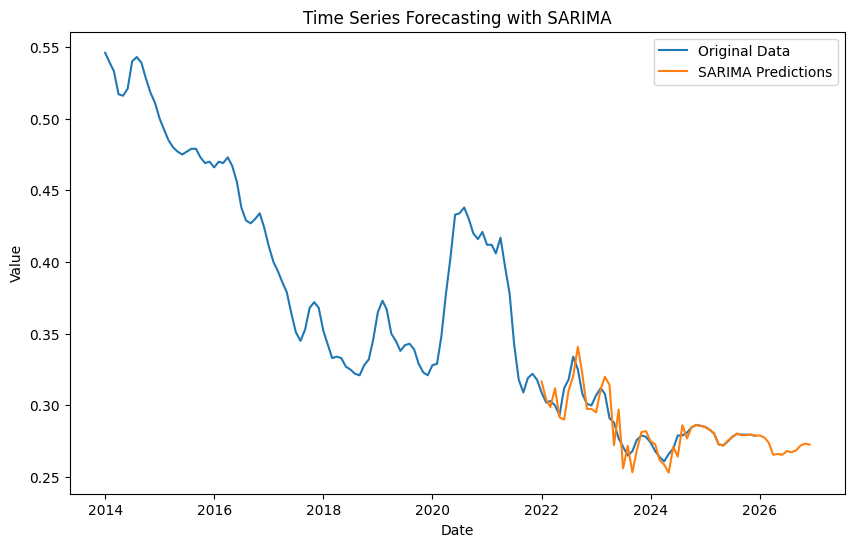

R^2 Score for SARIMA: 0.71
SARIMA - MSE: 8.198158344831035e-05, RMSE: 0.009054368197080918, MAPE: 2.09%


In [86]:
model_sarima(data_filtered,'Spain', '15-24', 'Female')

### 15-24, Male

In [87]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Male')

In [88]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9903
Strong seasonality detected.


(0.9903271429111417, True)

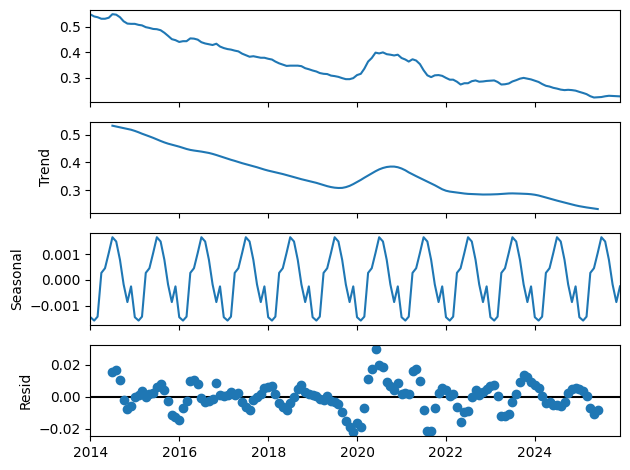

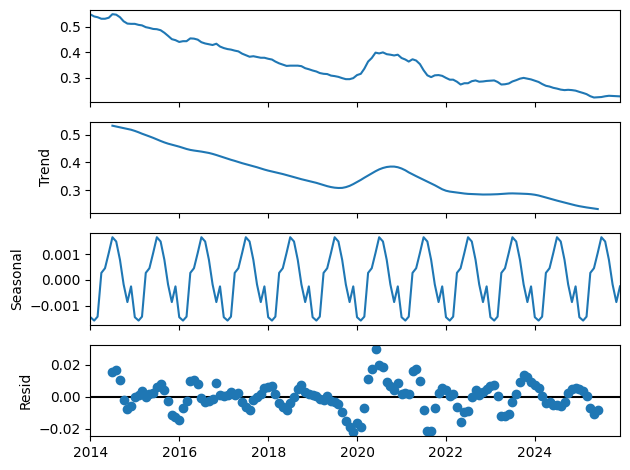

In [89]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-934.694, Time=1.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-829.010, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-903.034, Time=0.81 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-877.220, Time=0.31 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-929.527, Time=0.41 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-900.232, Time=1.01 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-930.160, Time=2.46 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-934.252, Time=1.02 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-950.228, Time=1.70 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-891.175, Time=0.74 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-943.938, Time=1.74 sec
 ARIMA(1,1,2)(0,1,2)[12]          

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


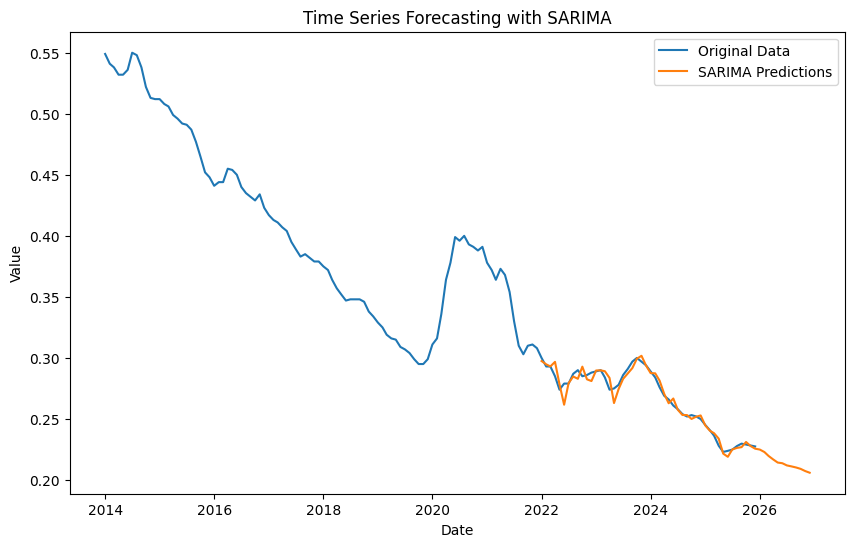

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 2.4725930187670983e-05, RMSE: 0.00497251748993113, MAPE: 1.29%


In [90]:
model_sarima(data_filtered,'Spain', '15-24', 'Male')

### 15-24, Total

In [91]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Total')

In [92]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9873
Strong seasonality detected.


(0.9873229876234162, True)

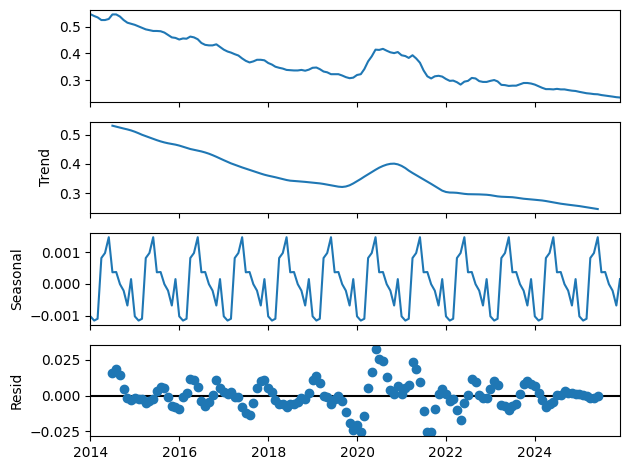

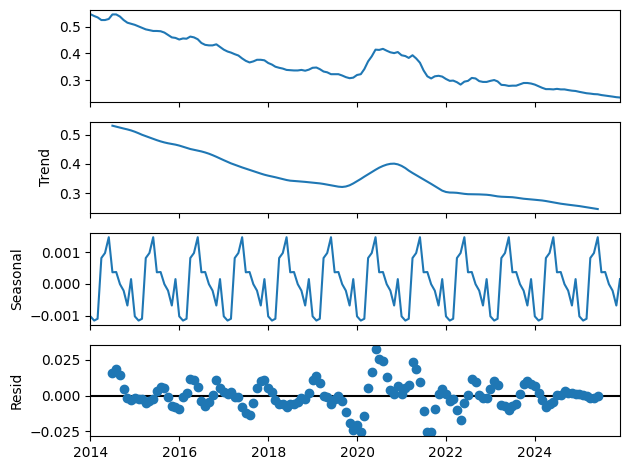

In [93]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-798.239, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-875.897, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.25 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-852.749, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-884.995, Time=1.76 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-912.420, Time=1.93 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-900.465, Time=1.39 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-909.113, Time=0.51 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-836.433, Time=0.76 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-910.081, Time=2.47 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-905.468, Time=2.32 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=1.87 sec
 ARIMA(2,1,1)(2,1,1)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


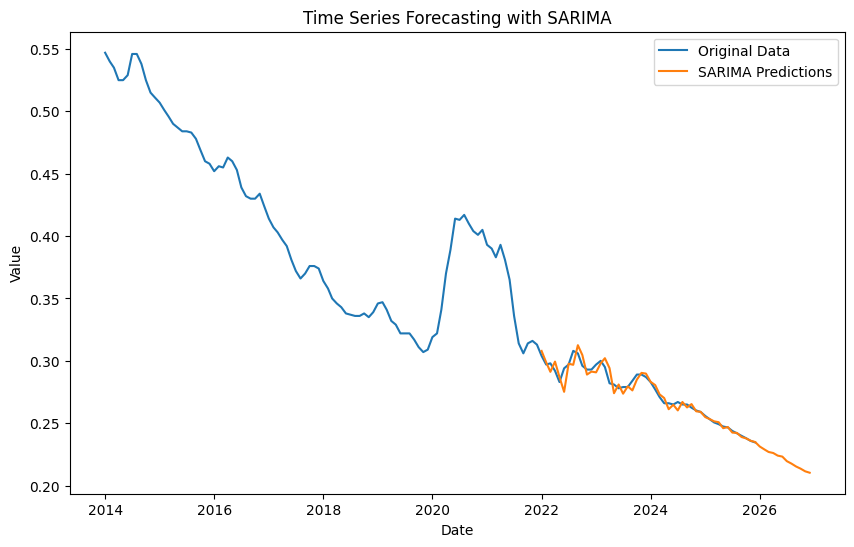

R^2 Score for SARIMA: 0.94
SARIMA - MSE: 2.6970143674966697e-05, RMSE: 0.005193278701838242, MAPE: 1.26%


In [94]:
model_sarima(data_filtered,'Spain', '15-24', 'Total')

### 25+, Male

In [95]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Male')

In [96]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9950
Strong seasonality detected.


(0.9950132785697741, True)

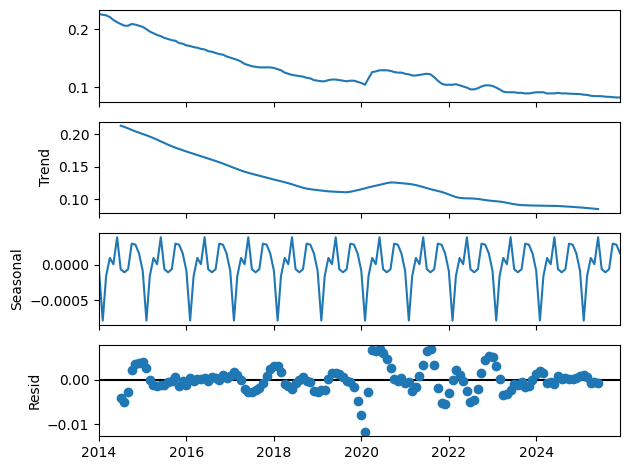

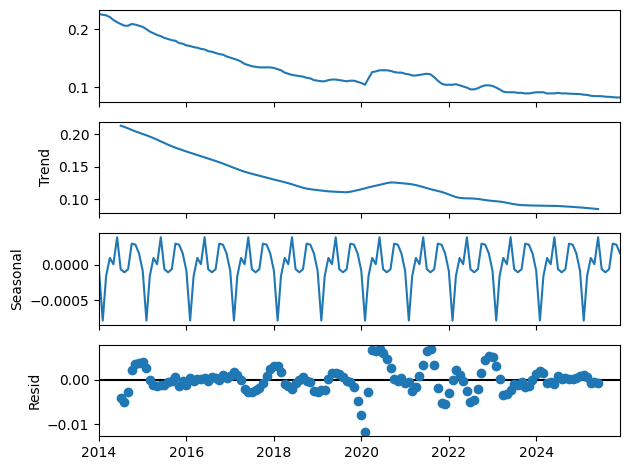

In [97]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1240.724, Time=1.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1154.784, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1219.709, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1237.195, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1192.124, Time=0.23 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1230.165, Time=1.24 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1221.825, Time=0.46 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1241.440, Time=3.13 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1231.478, Time=1.86 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1230.333, Time=0.94 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1234.882, Time=1.02 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1240.966, Time=1.10 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1243.267, Time=3.85 sec
 ARIMA(2,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


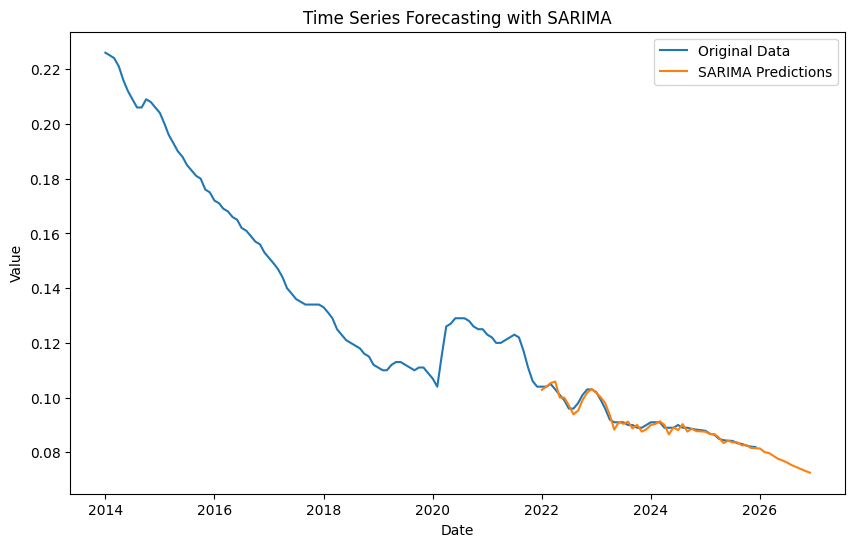

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 1.517344683273835e-06, RMSE: 0.0012318054567478727, MAPE: 1.03%


In [98]:
model_sarima(data_filtered,'Spain', '25+', 'Male')

### 25+, Female

In [99]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Female')

In [100]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9965
Strong seasonality detected.


(0.9964501871354003, True)

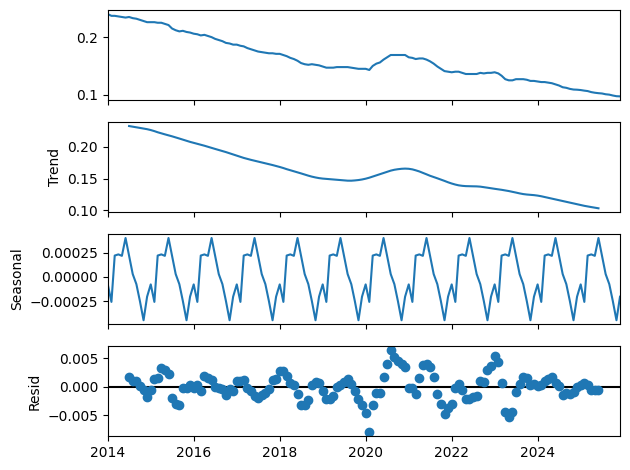

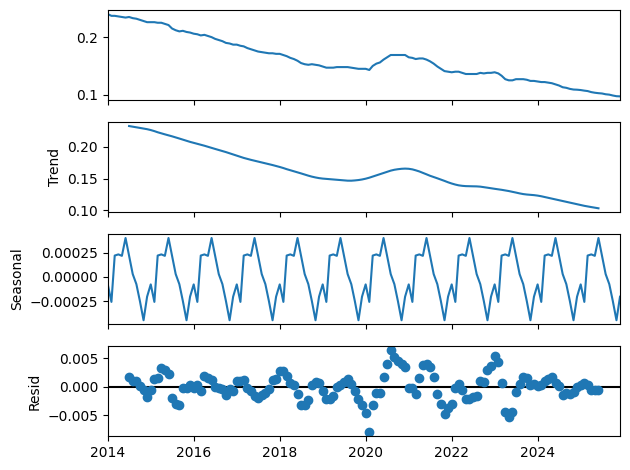

In [101]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1271.840, Time=0.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1174.535, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1247.595, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1246.847, Time=0.84 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1218.533, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1255.151, Time=1.12 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1214.534, Time=1.11 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1248.200, Time=0.98 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1271.192, Time=0.28 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1261.342, Time=1.76 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1274.373, Time=1.35 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1223.570, Time=0.35 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1257.050, Time=1.07 sec
 ARIMA(1,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


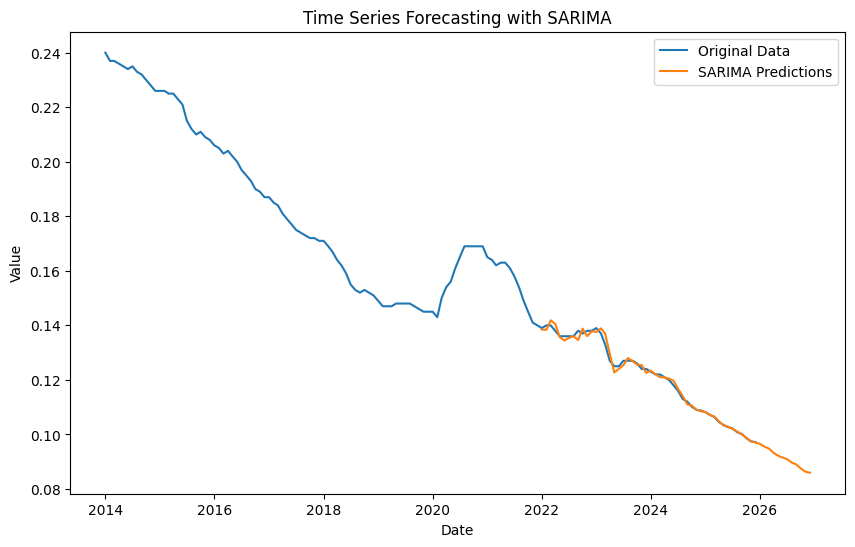

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.735370895292608e-06, RMSE: 0.001317334769636256, MAPE: 0.71%


In [102]:
model_sarima(data_filtered,'Spain', '25+', 'Female')

 ### 25+, Total

In [103]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Total')

In [104]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9965
Strong seasonality detected.


(0.9965103576644722, True)

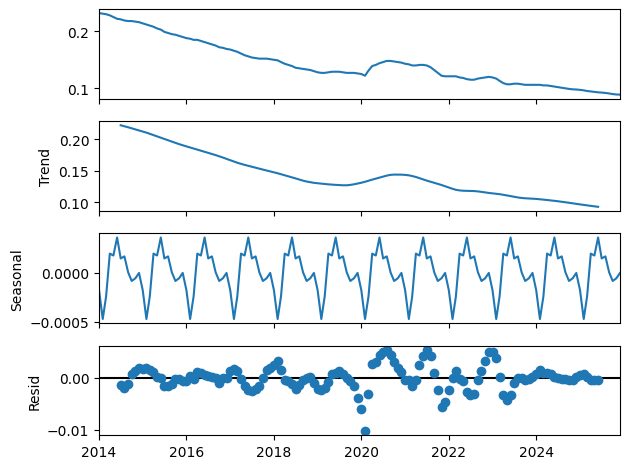

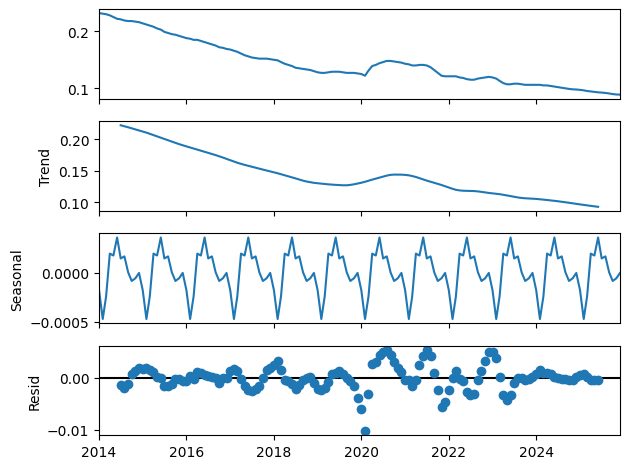

In [105]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1300.747, Time=1.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1197.373, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1273.676, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1285.632, Time=1.35 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1242.931, Time=0.24 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1284.171, Time=1.39 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.74 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1271.940, Time=0.63 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1297.410, Time=1.08 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1293.698, Time=1.87 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1293.808, Time=0.98 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1240.688, Time=0.85 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1291.160, Time=0.59 sec
 ARIMA(2,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


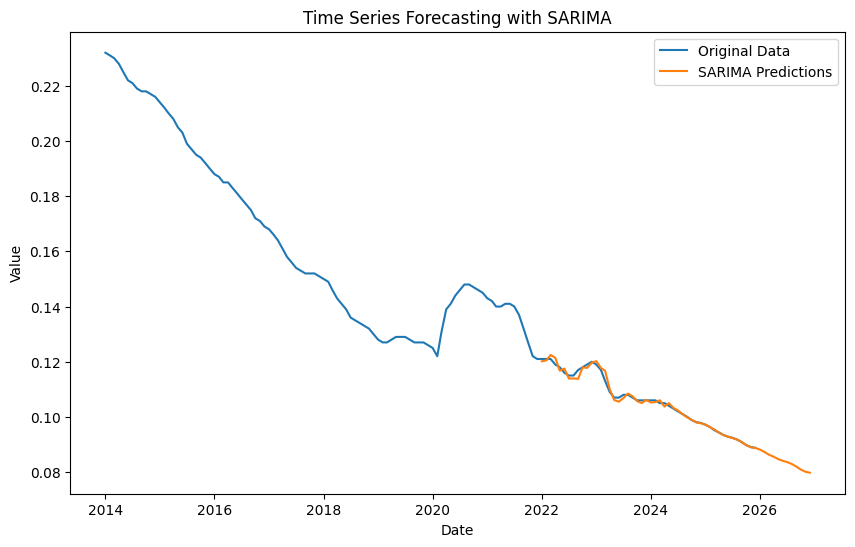

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.13938141222565e-06, RMSE: 0.0010674181056294905, MAPE: 0.63%


In [106]:
model_sarima(data_filtered,'Spain', '25+', 'Total')

# Slovenia

### 15-24, Male

In [107]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Male')

In [108]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8974
Strong seasonality detected.


(0.8973687834278888, True)

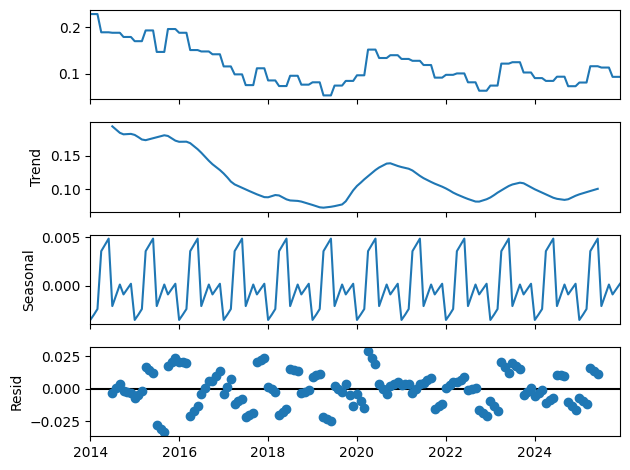

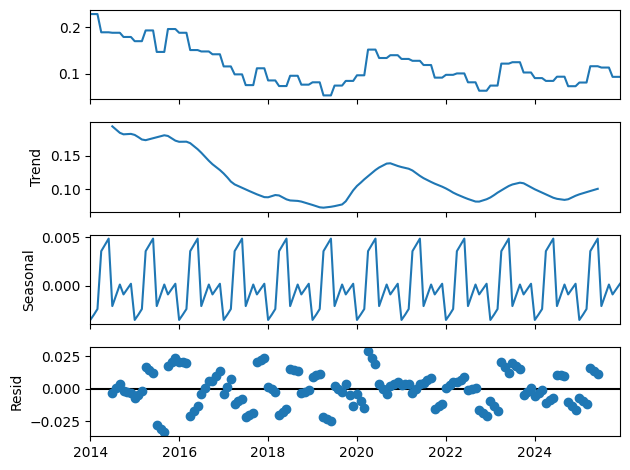

In [109]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-728.081, Time=1.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-658.054, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-731.880, Time=0.38 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-730.081, Time=0.72 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-656.054, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-746.910, Time=0.83 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-751.571, Time=1.11 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-744.918, Time=1.54 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-747.535, Time=2.07 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-743.093, Time=2.06 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-753.559, Time=0.99 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-746.917, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-748.910, Time=0.97 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-751.291, Time=2.08 sec
 ARIMA(0,1,0)(1,1,0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


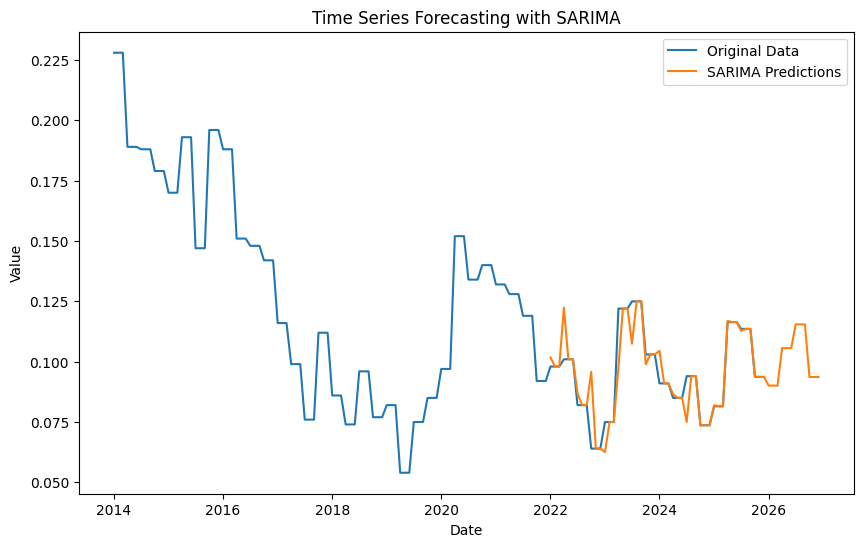

R^2 Score for SARIMA: 0.78
SARIMA - MSE: 6.517627032339502e-05, RMSE: 0.008073182168351897, MAPE: 3.63%


In [110]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Male')

### 15-24, Female

In [111]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Female')

In [112]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8336
Strong seasonality detected.


(0.8336340871026832, True)

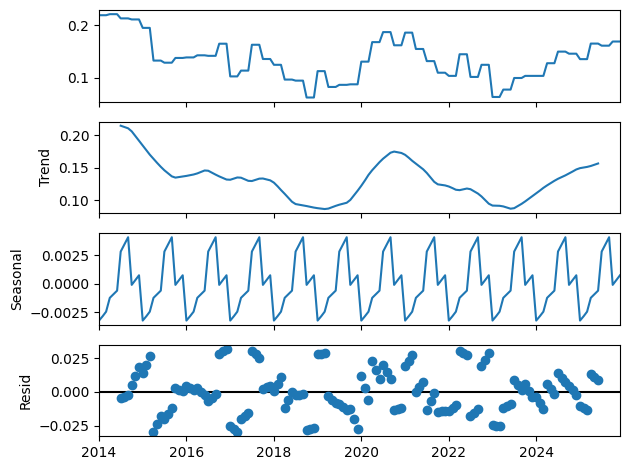

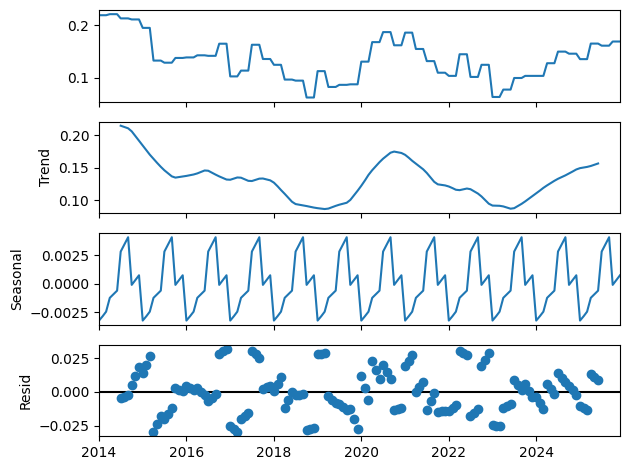

In [113]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-625.856, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-643.315, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-623.856, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-663.790, Time=0.16 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.44 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-665.790, Time=0.61 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-645.315, Time=0.18 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-663.791, Time=1.49 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-661.790, Time=0.58 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-664.0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


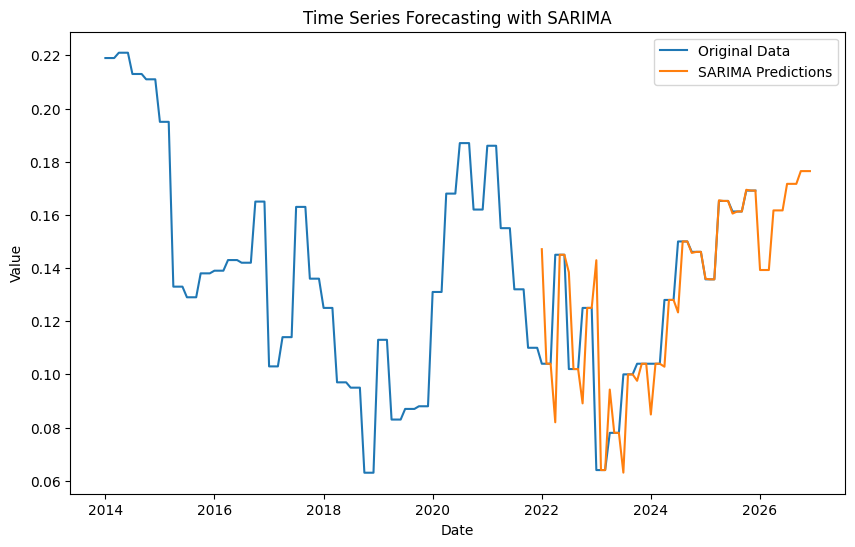

R^2 Score for SARIMA: 0.60
SARIMA - MSE: 0.0003762102852665838, RMSE: 0.019396140989036553, MAPE: 8.20%


In [114]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Female')

### 15-24, Total

In [115]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Total')

In [116]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9147
Strong seasonality detected.


(0.914728115087446, True)

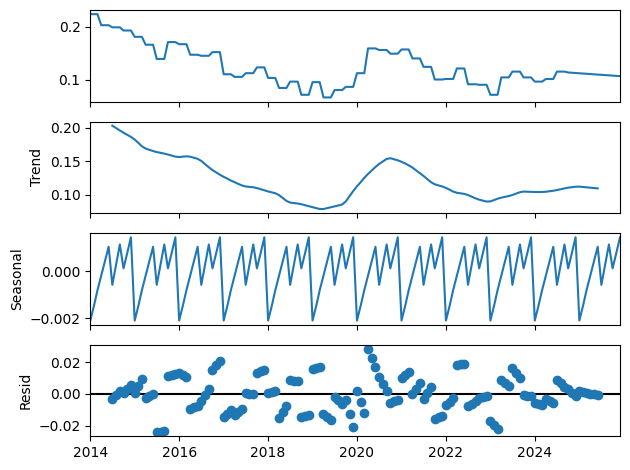

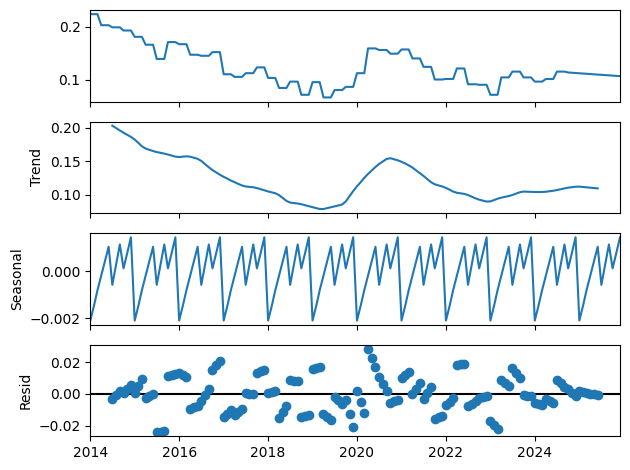

In [117]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-779.589, Time=1.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-737.917, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-760.258, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-781.590, Time=1.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-735.917, Time=0.45 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-781.274, Time=0.97 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-781.107, Time=1.87 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-760.258, Time=0.39 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-779.471, Time=1.83 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-783.561, Time=0.91 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-783.095, Time=1.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-762.258, Time=0.37 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-781.505, Time=3.66 sec
 ARIMA(1,1,0)(0,1,1)[12]

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


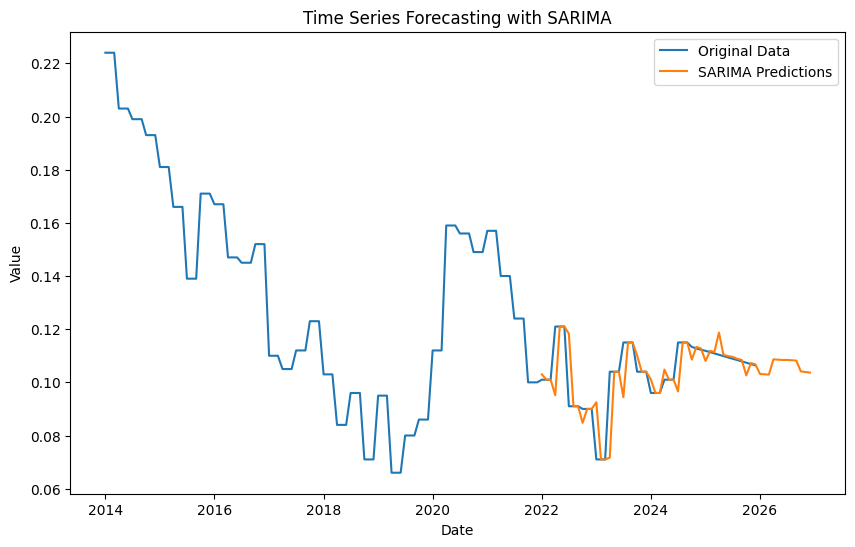

R^2 Score for SARIMA: 0.42
SARIMA - MSE: 8.177913540310314e-05, RMSE: 0.00904318170795562, MAPE: 4.04%


In [118]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-863.087, Time=0.32 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-788.828, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-827.390, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-790.828, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-873.581, Time=0.36 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-836.966, Time=0.12 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-871.896, Time=0.59 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-877.203, Time=1.13 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-870.962, Time=0.67 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-873.311, Time=0.82 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-874.636, Time=0.93 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-871.035, Time=0.39 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=inf, Time=1.29 sec

Best model:  ARIMA(1,2,2

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


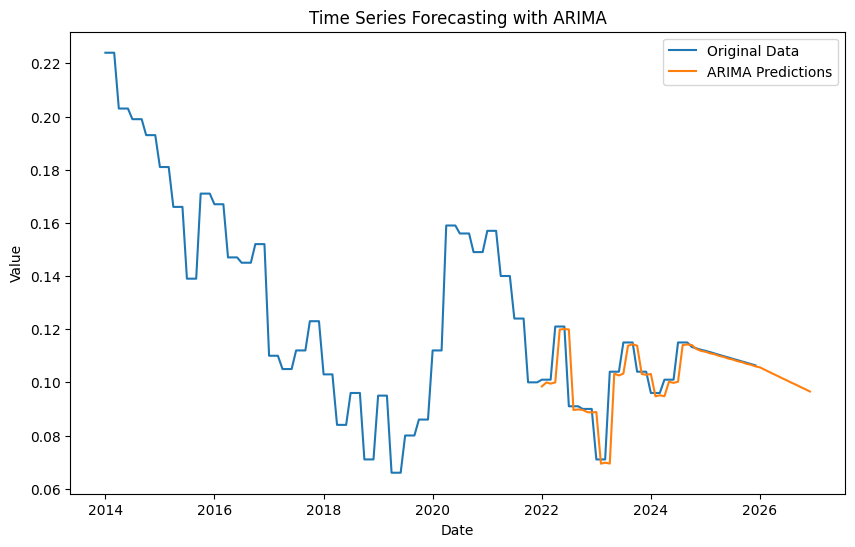

R^2 Score for ARIMA: 0.50
ARIMA - MSE: 7.020023341667596e-05, RMSE: 0.008378557955679244, MAPE: 3.89%


In [119]:
model_arima(data_filtered,'Slovenia', '15-24', 'Total')

### 25+, Male

In [120]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Male')

In [121]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9707
Strong seasonality detected.


(0.9707206604168855, True)

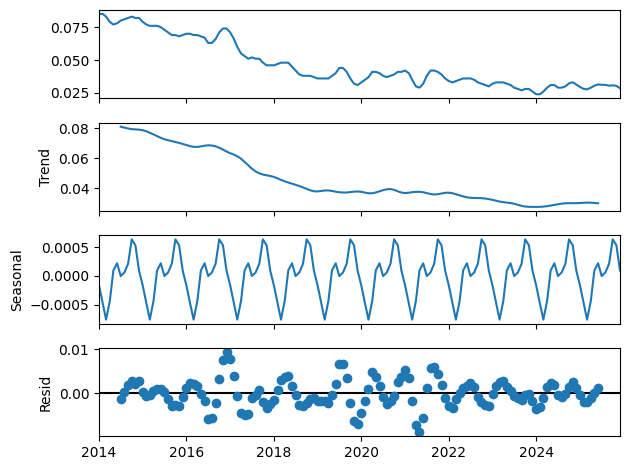

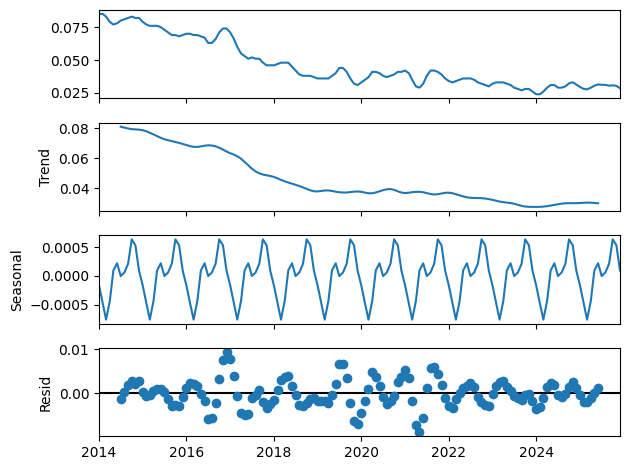

In [122]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1279.168, Time=1.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1125.684, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1268.365, Time=0.61 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1240.378, Time=0.76 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1213.541, Time=0.49 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1274.263, Time=0.72 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1277.326, Time=1.53 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1276.836, Time=0.20 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1242.192, Time=1.05 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1266.494, Time=0.57 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1312.054, Time=1.38 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1265.151, Time=0.55 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1296.419, Time=1.62 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1311.007, Time=0.68 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


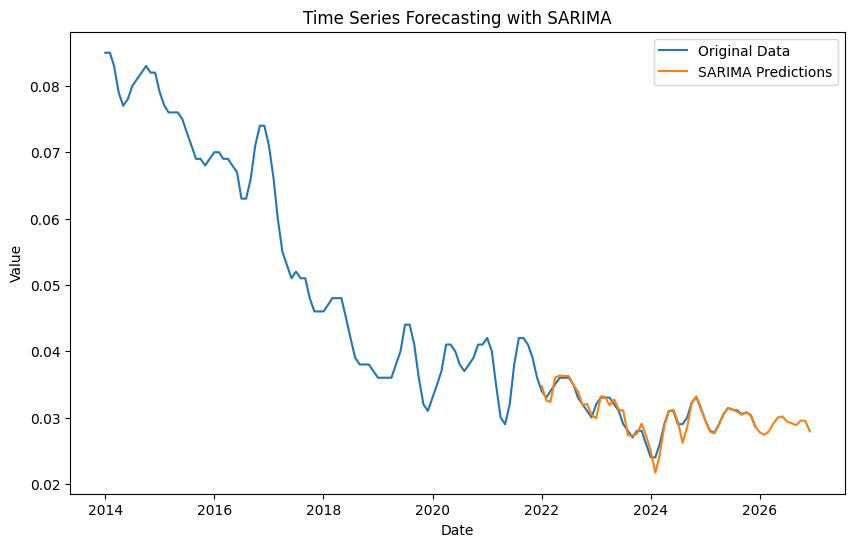

R^2 Score for SARIMA: 0.90
SARIMA - MSE: 8.414209592996852e-07, RMSE: 0.0009172900082851035, MAPE: 2.03%


In [123]:
model_sarima(data_filtered,'Slovenia', '25+', 'Male')

### 25+, Female

In [124]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Female')

In [125]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9853
Strong seasonality detected.


(0.9852772933662886, True)

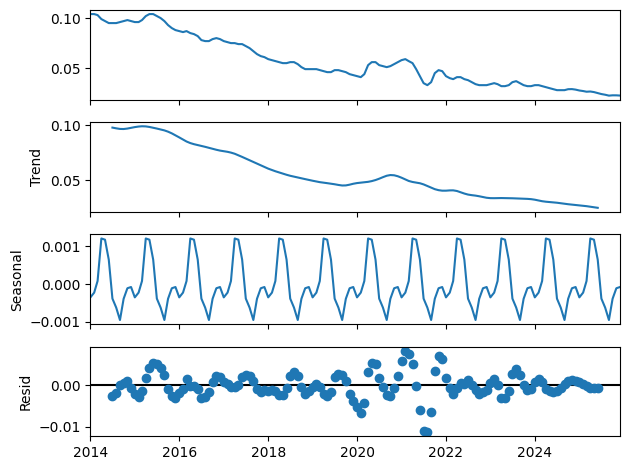

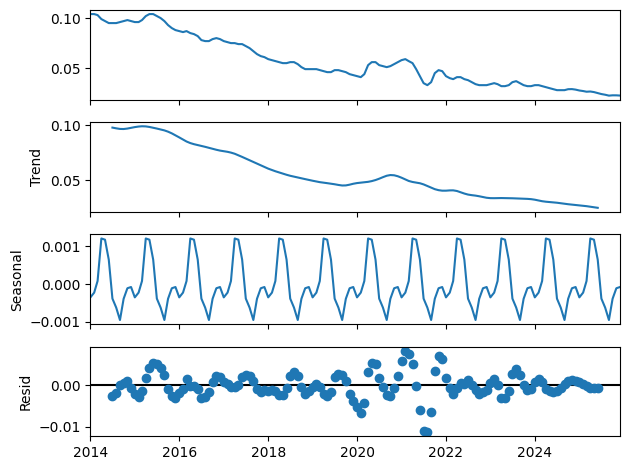

In [126]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1268.611, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1125.669, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1224.121, Time=1.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1221.632, Time=0.77 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1209.527, Time=0.03 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1250.628, Time=1.09 sec


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1205.527, Time=0.79 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1237.989, Time=0.98 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1233.416, Time=0.90 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1256.057, Time=0.83 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1286.450, Time=0.63 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1233.388, Time=0.87 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1268.406, Time=1.89 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1229.389, Time=2.17 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-1257.839, Time=0.67 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1271.489, Time=2.55 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-1285.899, Time=1.02 sec
 ARIMA(3,1,1)(0,1,1)[12]             : AIC=-1283.242, Time=0.47 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=-1293.099, Time=2.18 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=-1238.131, Time=0.13 sec
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=-1276

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: invalid value encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_auto_solvers.py:40: RuntimeWarning: invalid value encountered in divide
  max_invroot = max(0, *np.abs(1 / model.maroots()))


 ARIMA(2,1,2)(1,1,2)[12]             : AIC=-1258.679, Time=1.16 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1276.488, Time=1.19 sec
 ARIMA(3,1,2)(0,1,1)[12]             : AIC=-1281.799, Time=0.58 sec
 ARIMA(2,1,3)(0,1,1)[12]             : AIC=-1281.456, Time=0.86 sec
 ARIMA(1,1,3)(0,1,1)[12]             : AIC=-1276.390, Time=1.55 sec
 ARIMA(3,1,3)(0,1,1)[12]             : AIC=-1279.628, Time=0.37 sec
 ARIMA(2,1,2)(0,1,1)[12] intercept   : AIC=-1291.260, Time=1.67 sec

Best model:  ARIMA(2,1,2)(0,1,1)[12]          
Total fit time: 30.474 seconds
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  144
Model:             SARIMAX(2, 1, 2)x(0, 1, [1], 12)   Log Likelihood                 652.549
Date:                              Sun, 24 Nov 2024   AIC                          -1293.099
Time:                                      17:50:14   BIC                

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


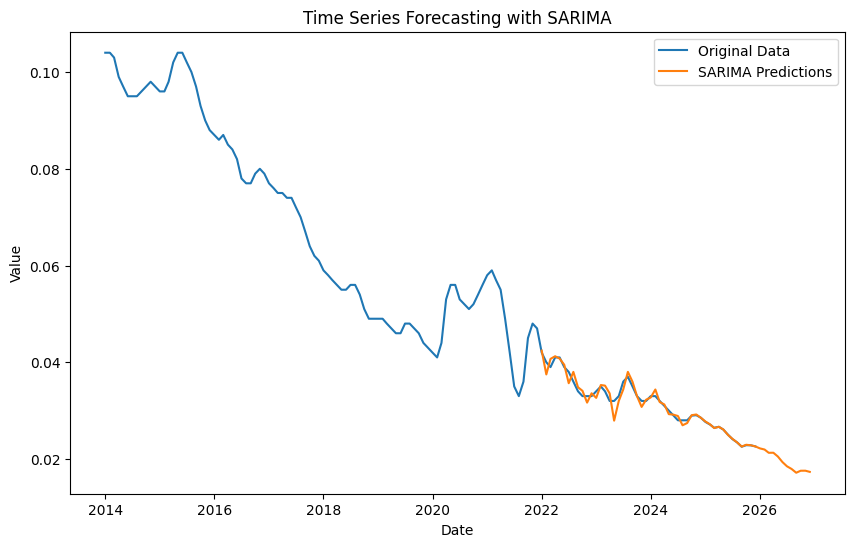

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 1.2006858721056716e-06, RMSE: 0.0010957581266436821, MAPE: 2.13%


In [127]:
model_sarima(data_filtered,'Slovenia', '25+', 'Female')

### 25+, Total

In [128]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Total')

In [129]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9880
Strong seasonality detected.


(0.988017993295259, True)

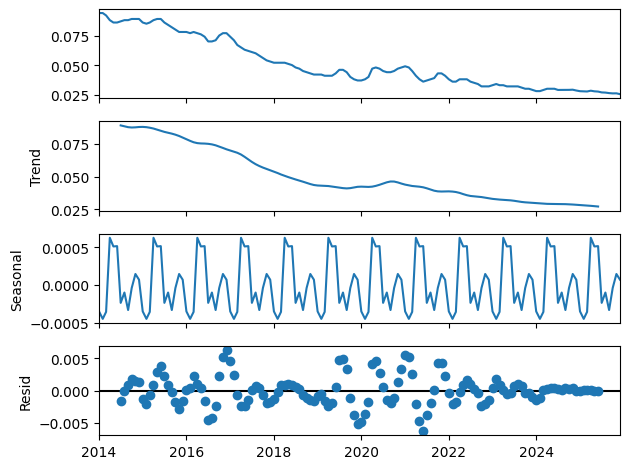

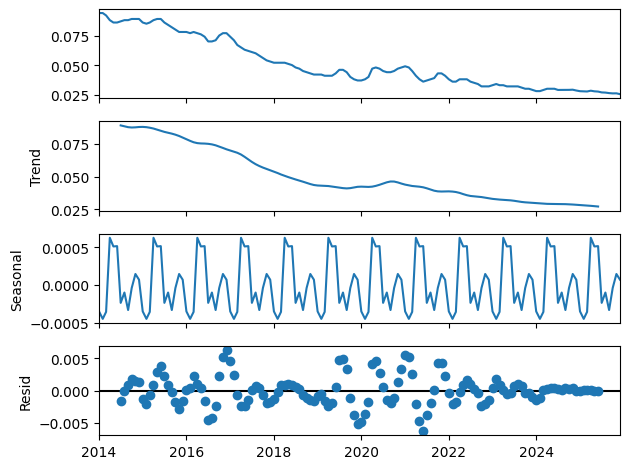

In [130]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1313.272, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1180.517, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1303.720, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1306.202, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1241.527, Time=0.52 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1305.061, Time=1.00 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1237.529, Time=0.81 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1288.714, Time=0.16 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1303.441, Time=1.20 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1308.672, Time=0.68 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1284.784, Time=1.15 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1303.364, Time=1.42 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1253.454, Time=0.16 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1319.704, Time=0.45 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


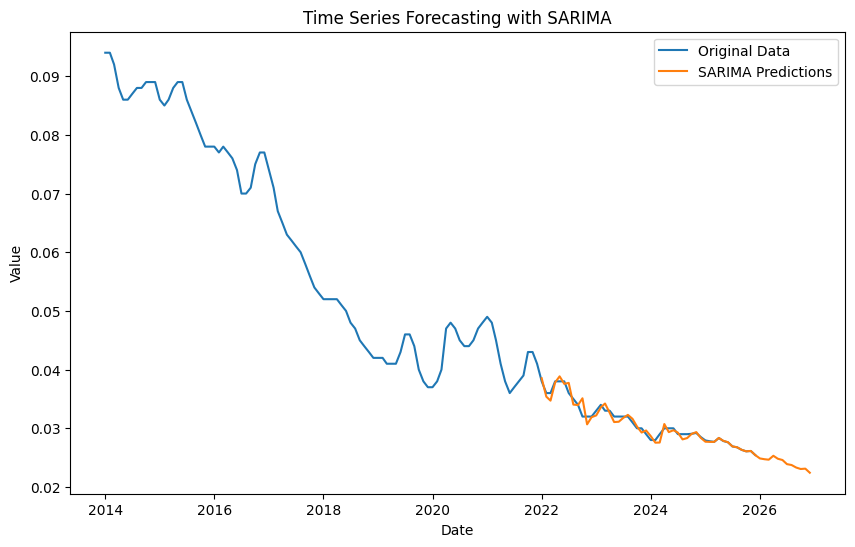

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 6.131274869719539e-07, RMSE: 0.0007830245762247529, MAPE: 1.65%


In [131]:
model_sarima(data_filtered,'Slovenia', '25+', 'Total')

# Norway

## 15-24, Male

In [132]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Male')

In [133]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4917
Weak or no seasonality detected.


(0.4917192250294241, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-580.266, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-639.885, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-603.775, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-647.863, Time=1.04 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-614.578, Time=0.98 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-684.755, Time=0.67 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-677.663, Time=0.80 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-684.166, Time=1.53 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-687.1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


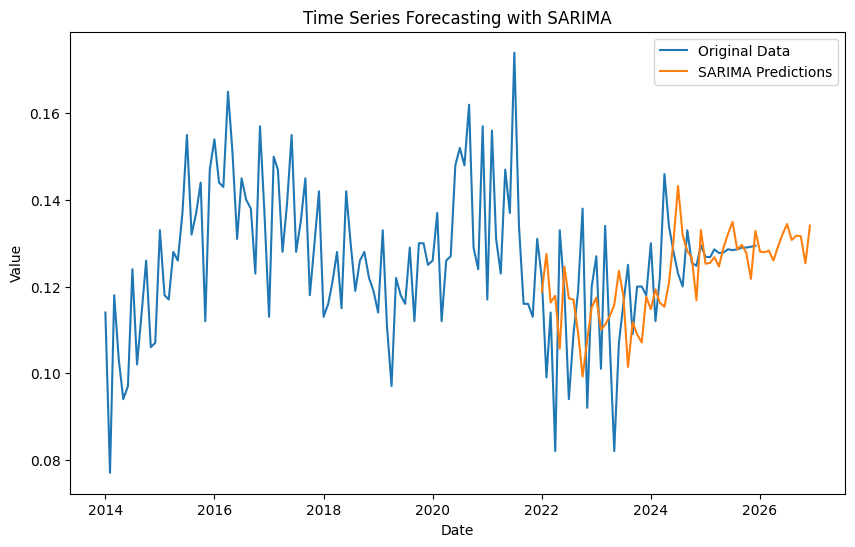

R^2 Score for SARIMA: -0.20
SARIMA - MSE: 0.00022090570067978318, RMSE: 0.014862896779557584, MAPE: 9.41%


In [134]:
model_sarima(data_filtered,'Norway', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-743.189, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-572.458, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-636.138, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-574.448, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-779.194, Time=0.64 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-714.961, Time=0.23 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-781.701, Time=0.99 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-731.595, Time=0.08 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-782.705, Time=0.55 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-769.381, Time=1.06 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-779.742, Time=1.02 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-770.260, Time=0.88 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=inf, Time=0.29 sec

Best model:  ARIMA(3,2,2)(0,0,0)[0] intercept
Total fit time: 6.726 seconds
         

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-pa

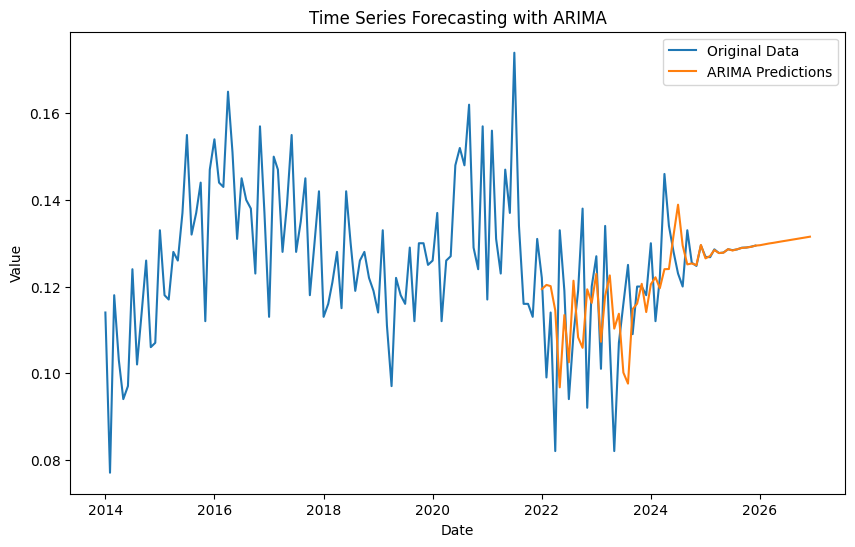

R^2 Score for ARIMA: 0.01
ARIMA - MSE: 0.00018151570000514297, RMSE: 0.013472776254549134, MAPE: 7.97%


In [135]:
model_arima(data_filtered,'Norway', '15-24', 'Male')

## 15-24, Female

In [136]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Female')

In [137]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4546
Weak or no seasonality detected.


(0.4546024085723477, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-571.001, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-632.853, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-607.058, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-646.418, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-613.485, Time=0.98 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-668.243, Time=1.33 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-653.843, Time=0.79 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-667.049, Time=1.42 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-667.0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


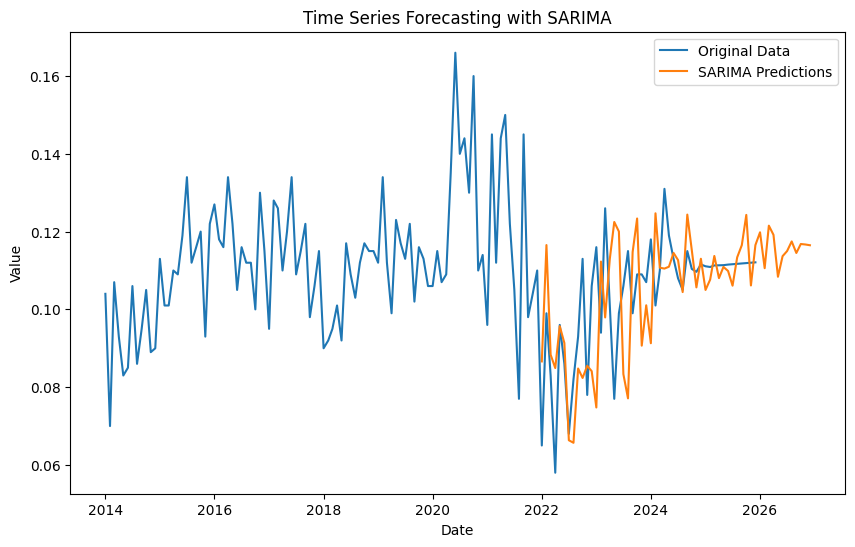

R^2 Score for SARIMA: -0.25
SARIMA - MSE: 0.00028874225361826005, RMSE: 0.016992417533072218, MAPE: 12.78%


In [138]:
model_sarima(data_filtered,'Norway', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-567.015, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-637.444, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-569.007, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-701.257, Time=0.51 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-727.155, Time=0.38 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-763.742, Time=0.82 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-765.991, Time=1.16 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-757.611, Time=0.28 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-763.127, Time=0.56 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-766.335, Time=1.17 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-765.357, Time=1.07 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-725.202, Time=0.85 sec
 ARIMA(2,2,3)(0,0,0)[0]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodel

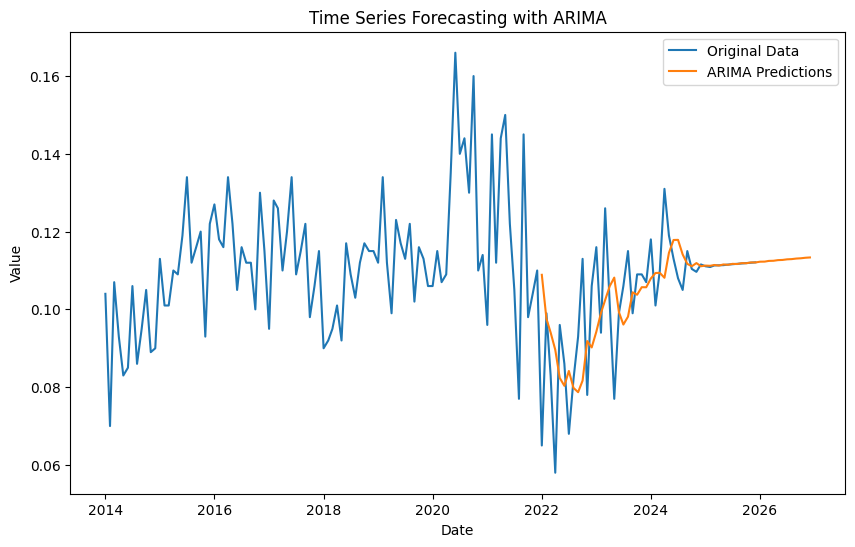

R^2 Score for ARIMA: 0.22
ARIMA - MSE: 0.00017913889389268092, RMSE: 0.013384277862203883, MAPE: 9.47%


In [139]:
model_arima(data_filtered,'Norway', '15-24', 'Female')

## 15-24,Total

In [140]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Total')

In [141]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4972
Weak or no seasonality detected.


(0.49723383846371805, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-602.212, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-663.617, Time=0.81 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-633.270, Time=0.10 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-673.895, Time=0.79 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.64 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-637.683, Time=0.43 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-708.461, Time=1.10 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-697.351, Time=1.01 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=2.10 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-707.176, Time=0.55 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-707.2

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


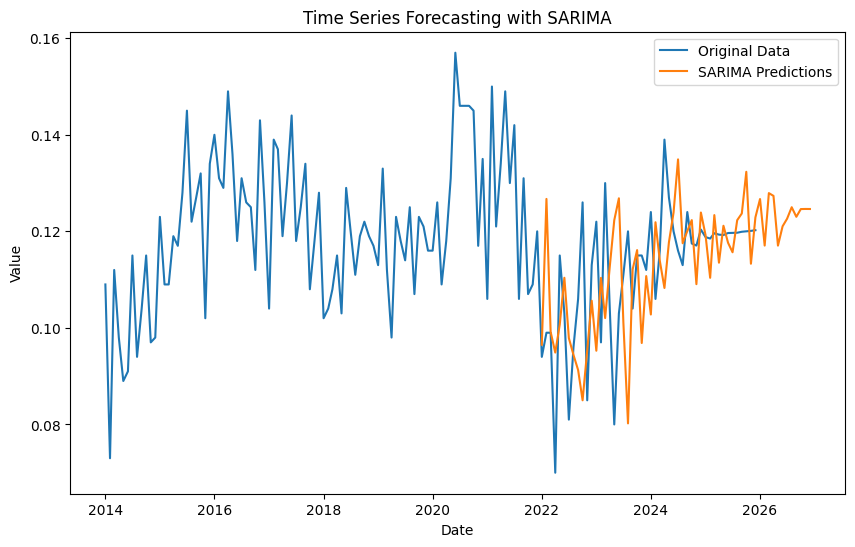

R^2 Score for SARIMA: -0.45
SARIMA - MSE: 0.00026661950792012344, RMSE: 0.01632848761888631, MAPE: 11.09%


In [142]:
model_sarima(data_filtered,'Norway', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-746.882, Time=0.78 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-591.366, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-660.846, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-739.128, Time=0.39 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-593.355, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-803.520, Time=0.62 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-741.251, Time=0.10 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-805.957, Time=0.55 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-771.553, Time=0.79 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-812.623, Time=0.93 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-739.407, Time=0.14 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-812.680, Time=0.69 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-802.472, Time=0.91 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-807.494, Time=0.88 sec
 ARIMA(2,2,3)(0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


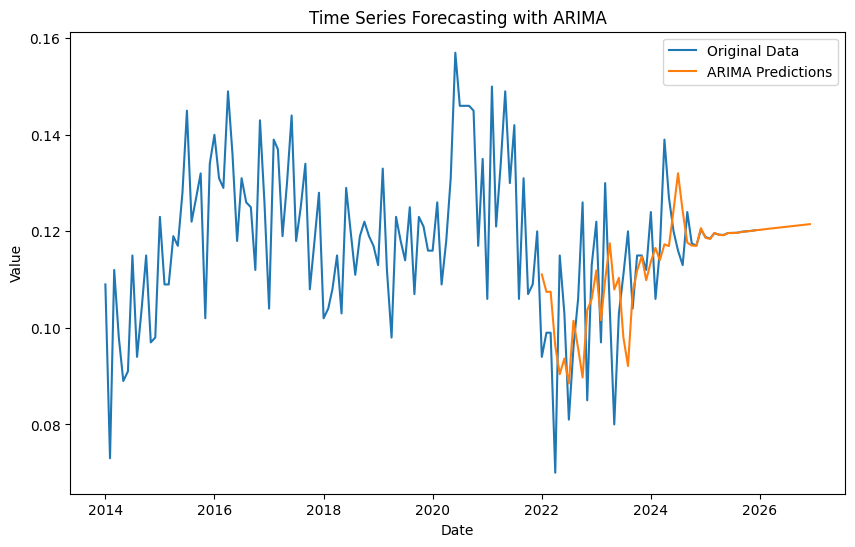

R^2 Score for ARIMA: 0.16
ARIMA - MSE: 0.00015567515331044713, RMSE: 0.01247698494470708, MAPE: 8.09%


In [143]:
model_arima(data_filtered,'Norway', '15-24', 'Total')

## 25+, Female

In [144]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Female')

In [145]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6852
Weak or no seasonality detected.


(0.6852051188282152, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1086.335, Time=0.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-982.055, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1041.681, Time=0.84 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1088.249, Time=0.30 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1013.845, Time=0.32 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1070.778, Time=1.22 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1085.491, Time=1.14 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1052.878, Time=0.38 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1085.339, Time=1.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1054.859, Time=0.30 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1086.864, Time=0.64 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1078.211, Time=0.67 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1084.768, Time=0.85 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1086.307, Time=0.19 sec

Best 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


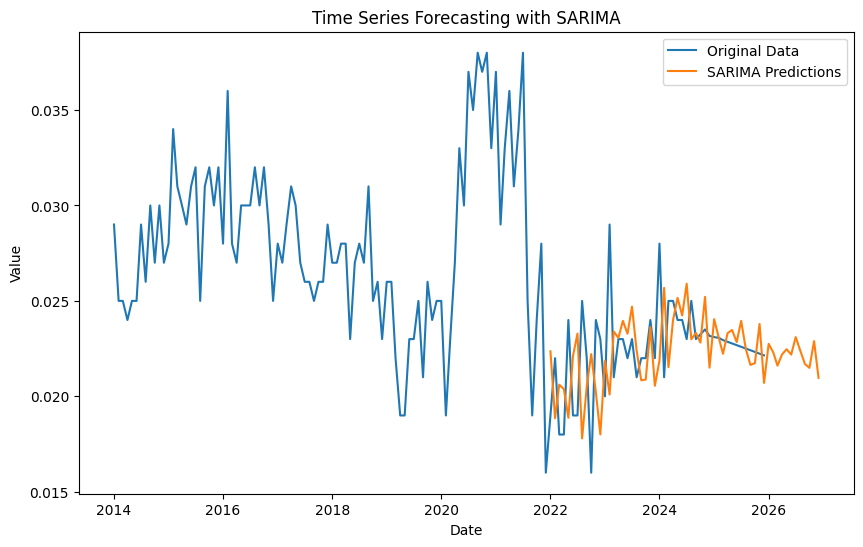

R^2 Score for SARIMA: -0.71
SARIMA - MSE: 8.800514886861888e-06, RMSE: 0.0029665661777317372, MAPE: 9.81%


In [146]:
model_sarima(data_filtered,'Norway', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1161.699, Time=0.96 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1034.563, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1100.339, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1036.560, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1197.648, Time=0.47 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1155.181, Time=0.23 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1195.443, Time=0.18 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1202.290, Time=0.67 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1203.273, Time=0.17 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1203.939, Time=0.21 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-1198.943, Time=0.58 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1198.258, Time=0.62 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-1205.974, Time=0.41 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


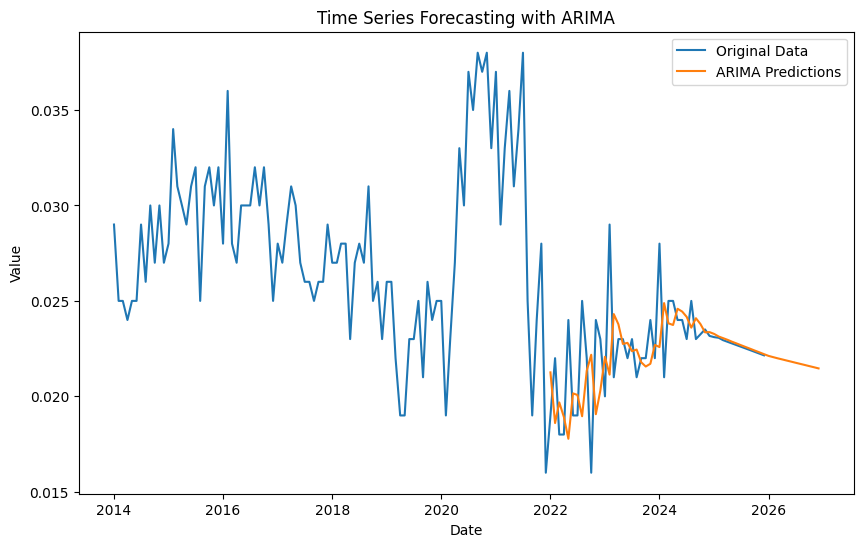

R^2 Score for ARIMA: -0.24
ARIMA - MSE: 6.417229231878291e-06, RMSE: 0.002533225065381734, MAPE: 7.08%


In [147]:
model_arima(data_filtered,'Norway', '25+', 'Female')

## 25+, Male

In [148]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Male')

In [149]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7513
Strong seasonality detected.


(0.7512513672095775, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-928.489, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-972.642, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.41 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-957.361, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-984.925, Time=0.71 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1007.641, Time=2.18 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-981.169, Time=0.57 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-996.273, Time=2.12 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1004.643, Time=0.89 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-980.712, Time=1.65 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1003.648, Time=1.79 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1014.507, Time=2.62 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-991.090, Time=0.12 sec
 ARIMA(1,1,1)(2,1,0)[12] 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


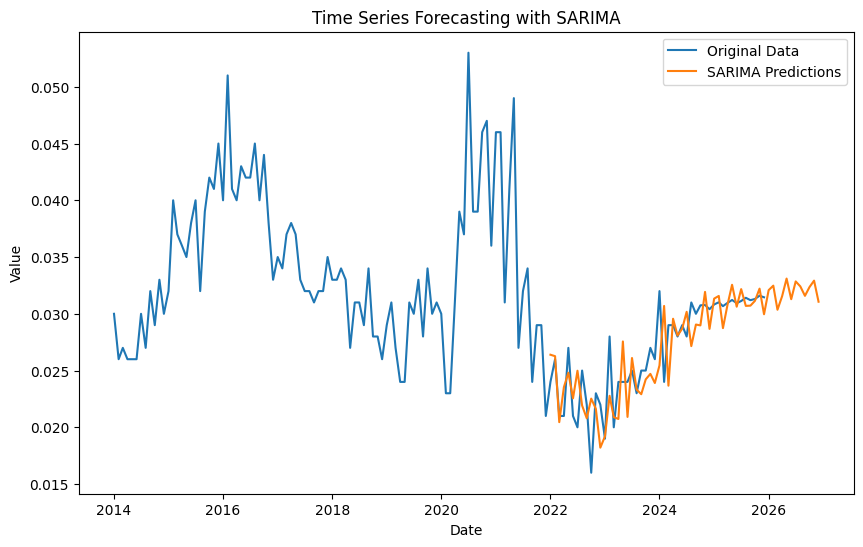

R^2 Score for SARIMA: 0.59
SARIMA - MSE: 7.217483902627423e-06, RMSE: 0.002686537530470666, MAPE: 8.03%


In [150]:
model_sarima(data_filtered,'Norway', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1114.343, Time=0.80 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-946.059, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1005.338, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-948.057, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1136.803, Time=0.67 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1094.193, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1137.025, Time=1.18 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1118.921, Time=0.39 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1115.285, Time=1.31 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1136.357, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1140.442, Time=0.74 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1133.136, Time=0.50 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1120.895, Time=0.42 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-1140.037, Time=0.21 sec
 AR

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


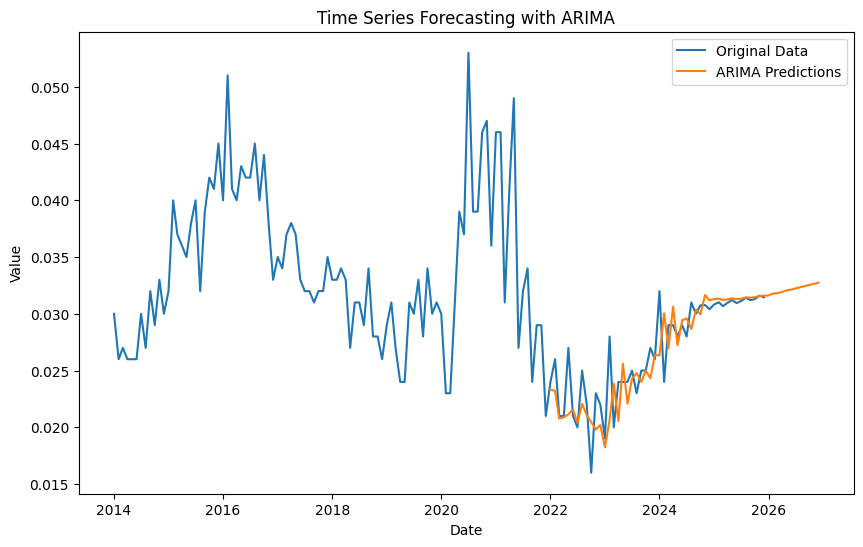

R^2 Score for ARIMA: 0.68
ARIMA - MSE: 5.6841813537960985e-06, RMSE: 0.0023841521247177366, MAPE: 6.32%


In [151]:
model_arima(data_filtered,'Norway', '25+', 'Male')

## 25+, Total

In [152]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Total')

In [153]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7571
Strong seasonality detected.


(0.7570814943291391, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-993.723, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1039.414, Time=0.81 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1069.011, Time=0.37 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1021.237, Time=0.21 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1055.730, Time=0.64 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1067.126, Time=1.02 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1043.816, Time=0.13 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1071.967, Time=2.32 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-1052.283, Time=1.28 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1058.605, Time=0.57 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1029.803, Time=0.35 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1058.695, Time=0.80 sec
 ARIMA(0,1,2)(1,1,2)[12]             : AIC=-1060.012, Time=1.09 sec
 ARIMA(1,1,0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


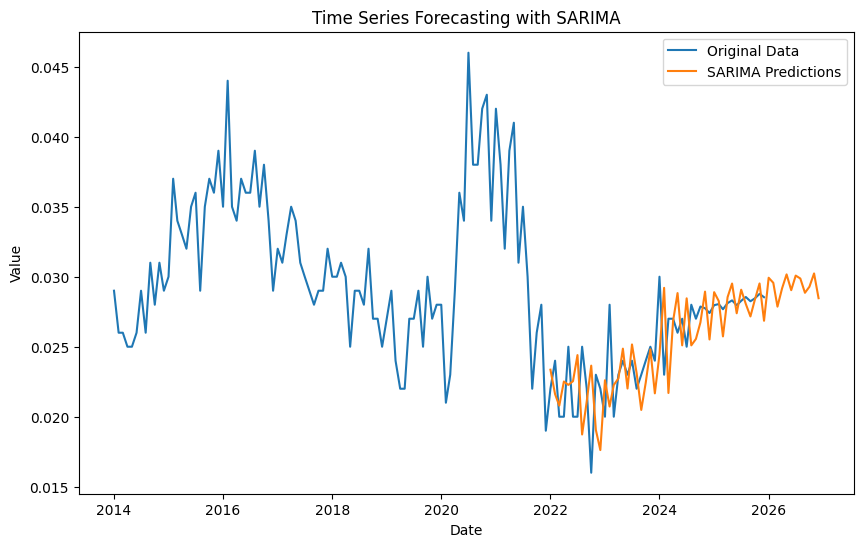

R^2 Score for SARIMA: 0.17
SARIMA - MSE: 8.634599951550055e-06, RMSE: 0.0029384689808725317, MAPE: 9.46%


In [154]:
model_sarima(data_filtered,'Norway', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1019.388, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1085.324, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1021.387, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1160.625, Time=0.09 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1178.481, Time=0.07 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1188.384, Time=0.68 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1185.922, Time=0.16 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1188.212, Time=0.88 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1186.467, Time=0.07 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1196.485, Time=0.14 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1187.912, Time=0.26 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1180.472, Time=0.36 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-1145.853, Time=0.60 sec
 ARIMA(

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


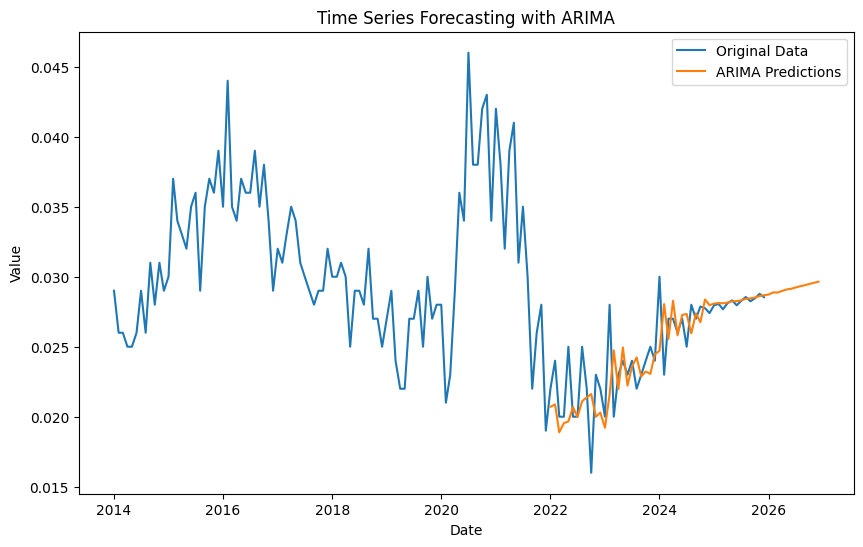

R^2 Score for ARIMA: 0.51
ARIMA - MSE: 5.1448119363711245e-06, RMSE: 0.002268217788566857, MAPE: 6.20%


In [155]:
model_arima(data_filtered,'Norway', '25+', 'Total')

# Latvia

## 15-24, Female

In [156]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Female')

In [157]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7874
Strong seasonality detected.


(0.7873694153826971, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-615.486, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-726.805, Time=0.62 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-680.808, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-755.962, Time=1.67 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.74 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-694.173, Time=0.70 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-809.083, Time=1.24 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-774.694, Time=0.66 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-817.467, Time=3.72 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-813.016, Time=1.53 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-808.666, Time=1.38 sec
 ARIMA(2,1,0)(1,1,2)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


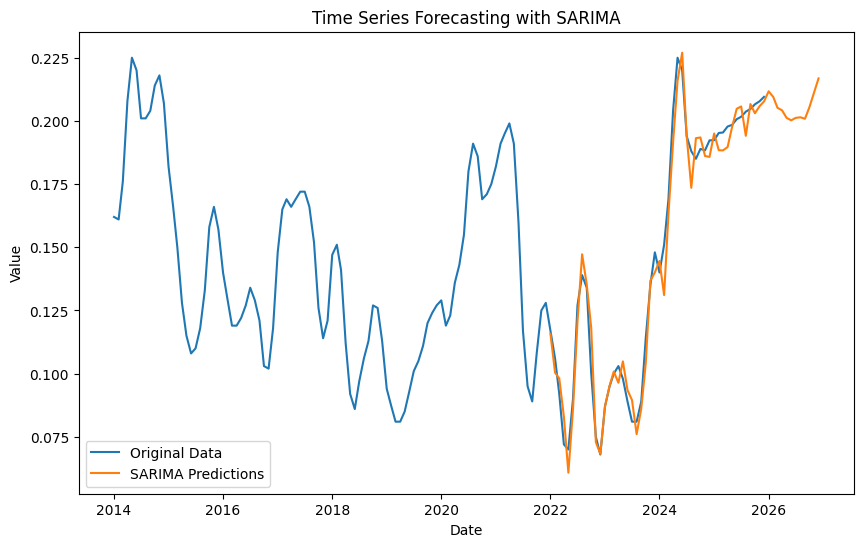

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 5.254755480333232e-05, RMSE: 0.007248969223505665, MAPE: 4.43%


In [158]:
model_sarima(data_filtered,'Latvia', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-849.084, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-857.935, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-860.133, Time=0.43 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-851.083, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-863.811, Time=0.43 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-884.370, Time=0.52 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-915.743, Time=0.63 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-885.218, Time=0.85 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-922.152, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-915.344, Time=0.78 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-930.685, Time=0.20 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-910.195, Time=0.91 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=-938.272, Time=0.96 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=inf, Time=0.66 sec
 ARIMA(3,2,2)(0,0,0)

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


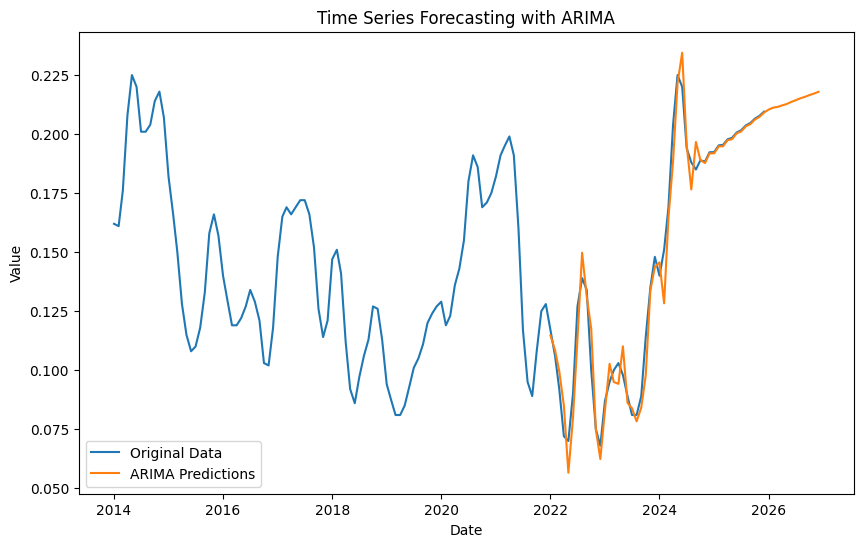

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 6.51773558123875e-05, RMSE: 0.008073249396146976, MAPE: 4.87%


In [159]:
model_arima(data_filtered,'Latvia', '15-24', 'Female')

## 15-24, Male

In [403]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Male')

In [404]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4913
Weak or no seasonality detected.


(0.49129472958122355, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-599.267, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-733.825, Time=2.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-739.651, Time=4.59 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-693.092, Time=0.55 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-728.607, Time=1.67 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.99 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-729.955, Time=2.07 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.31 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-828.072, Time=1.41 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-773.576, Time=0.90 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-807.941, Time=1.58 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-829.256, Time=0.72 sec
 ARIMA(0,1,2)(1,1,2)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


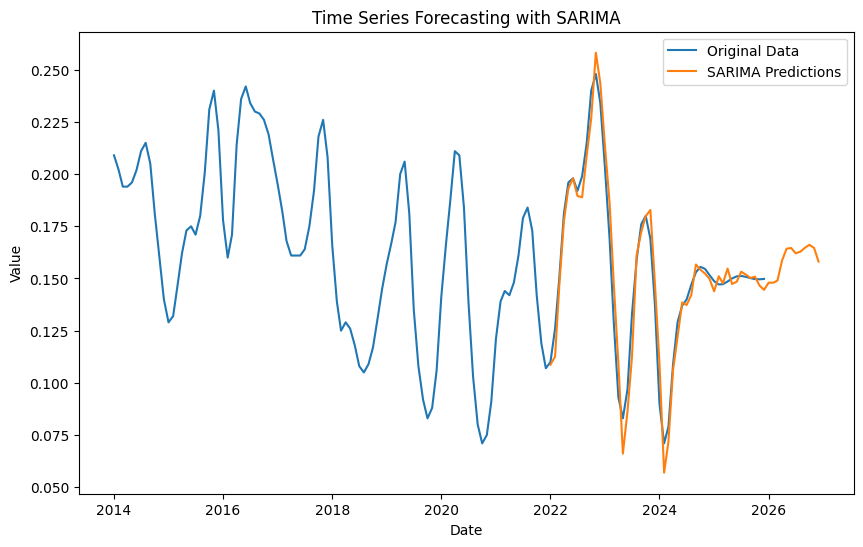

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 7.751557927670483e-05, RMSE: 0.00880429322982287, MAPE: 5.12%


In [405]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-863.197, Time=0.89 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-822.869, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-856.941, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-859.313, Time=0.66 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-824.867, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-920.236, Time=1.40 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-879.067, Time=0.72 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-903.751, Time=1.92 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-889.193, Time=2.50 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-894.980, Time=2.29 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-901.867, Time=0.44 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.32 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=1.82 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 15.091 seconds
                               SARIMAX Results                            

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


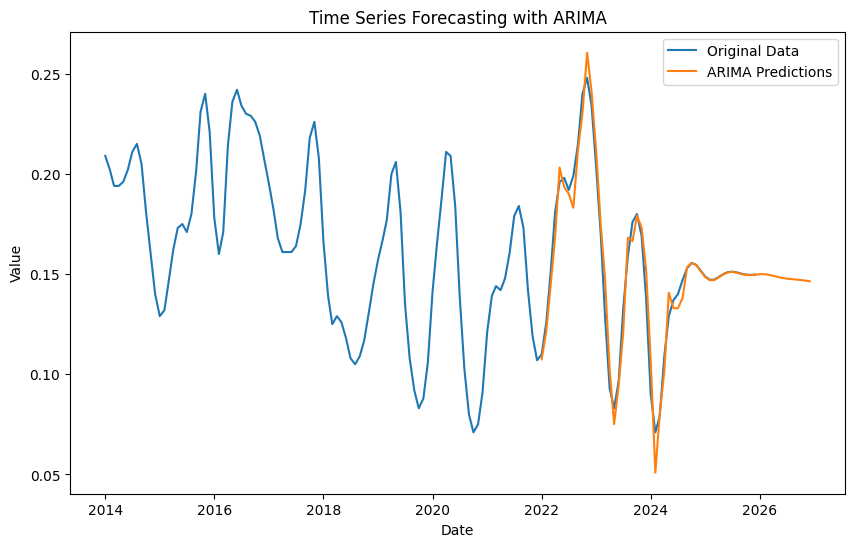

R^2 Score for ARIMA: 0.96
ARIMA - MSE: 6.25701245965199e-05, RMSE: 0.007910127975988751, MAPE: 4.19%


In [406]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Total

In [164]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Total')

In [165]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6753
Weak or no seasonality detected.


(0.6753102570783291, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-904.655, Time=3.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-735.025, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-851.989, Time=1.54 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.35 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-830.741, Time=0.86 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-892.918, Time=3.89 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-901.791, Time=5.10 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-875.154, Time=2.72 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=4.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=3.17 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-918.411, Time=1.54 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-854.382, Time=0.81 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-913.043, Time=3.72 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-918.247, Time=3.42 sec
 ARIMA(2,1,1)(1,1,0)[12]          

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


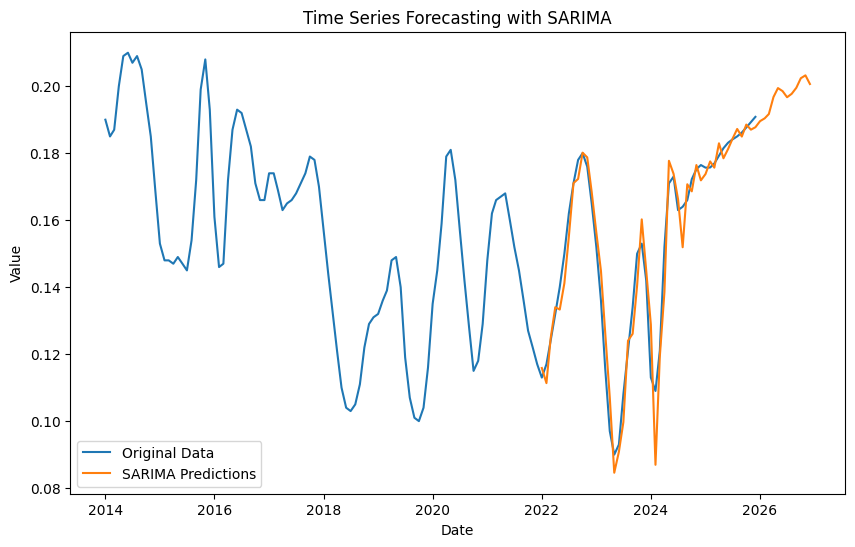

R^2 Score for SARIMA: 0.95
SARIMA - MSE: 4.4578371451257325e-05, RMSE: 0.006676703636620194, MAPE: 3.69%


In [166]:
model_sarima(data_filtered,'Latvia', '15-24', 'Total')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-978.935, Time=1.06 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-963.043, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-978.008, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-979.777, Time=0.15 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-965.038, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-981.686, Time=0.75 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-982.967, Time=0.77 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-997.879, Time=0.58 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-990.799, Time=0.67 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1007.048, Time=1.12 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1007.891, Time=1.11 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1009.793, Time=0.45 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-986.174, Time=0.36 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1011.795, Time=0.07 sec
 ARIMA(2,2,0)(0,0,0)[0]      

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


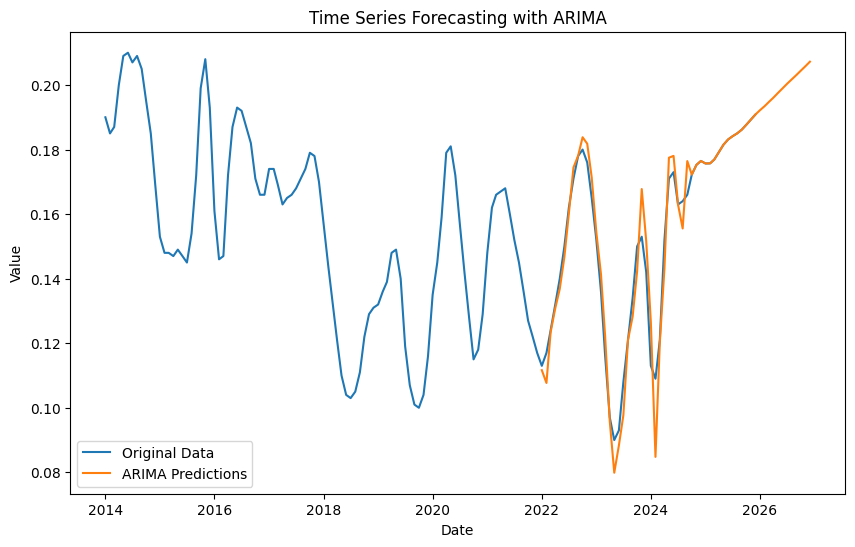

R^2 Score for ARIMA: 0.95
ARIMA - MSE: 4.195185227898392e-05, RMSE: 0.006477024955871632, MAPE: 3.12%


In [167]:
model_arima(data_filtered,'Latvia', '15-24', 'Total')

## 25+, Male

In [168]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Male')

In [169]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9318
Strong seasonality detected.


(0.9317564696203559, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1191.909, Time=3.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1050.772, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1160.884, Time=1.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1091.551, Time=1.34 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1141.063, Time=0.88 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1179.986, Time=3.39 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1172.306, Time=3.60 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1176.306, Time=1.55 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1183.334, Time=1.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1172.203, Time=0.58 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1211.538, Time=1.15 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1163.274, Time=0.09 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1193.271, Time=1.50 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1186.106, Time=3.28 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


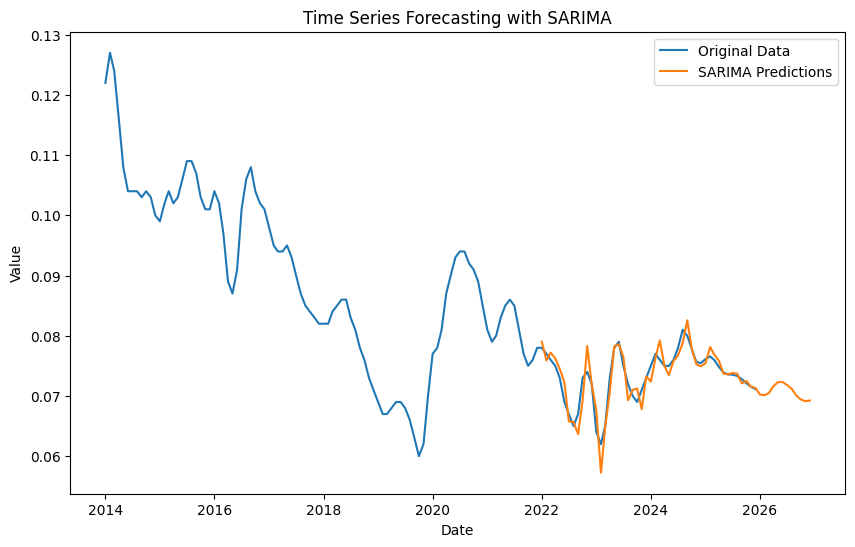

R^2 Score for SARIMA: 0.79
SARIMA - MSE: 3.548884182266492e-06, RMSE: 0.001883848237588817, MAPE: 1.94%


In [170]:
model_sarima(data_filtered,'Latvia', '25+', 'Male')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1270.962, Time=1.00 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1280.797, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1288.180, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1287.495, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1282.768, Time=0.04 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1301.084, Time=0.42 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1333.449, Time=1.05 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1331.051, Time=0.24 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1274.796, Time=0.54 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1335.453, Time=0.92 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-1303.070, Time=0.23 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1333.053, Time=1.08 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1276.900, Time=0.85 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 6.858 seconds
         

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


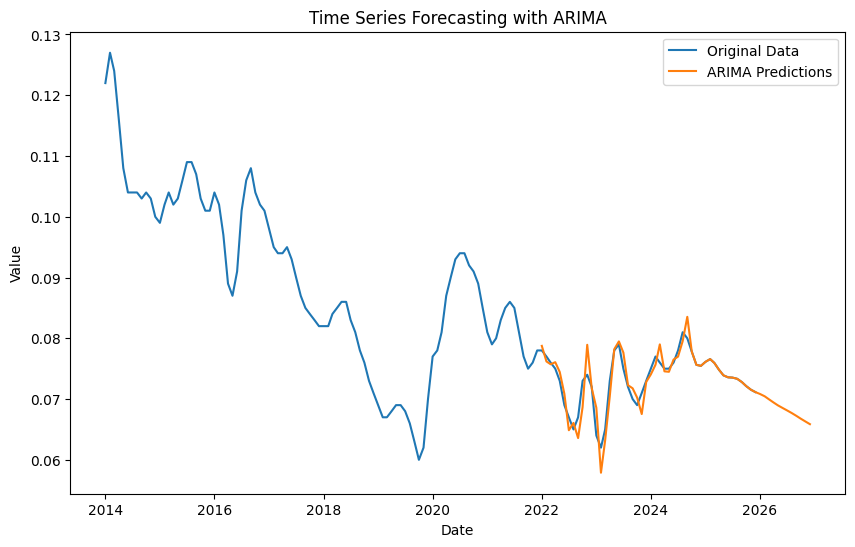

R^2 Score for ARIMA: 0.80
ARIMA - MSE: 3.502041980157712e-06, RMSE: 0.0018713743559634754, MAPE: 1.71%


In [171]:
model_arima(data_filtered,'Latvia', '25+', 'Male')

## 25+, Female

In [172]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Female')

In [173]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9721
Strong seasonality detected.


(0.972060099577375, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1105.803, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1229.246, Time=0.45 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1182.488, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1252.063, Time=0.43 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1249.734, Time=0.62 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1245.012, Time=0.54 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1184.557, Time=0.83 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1256.518, Time=2.86 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-1253.109, Time=2.17 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1253.953, Time=5.34 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-1256.470, Time=1.90 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-1259.795, Time=1.00 sec
 ARIMA(3,1,0)(1,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


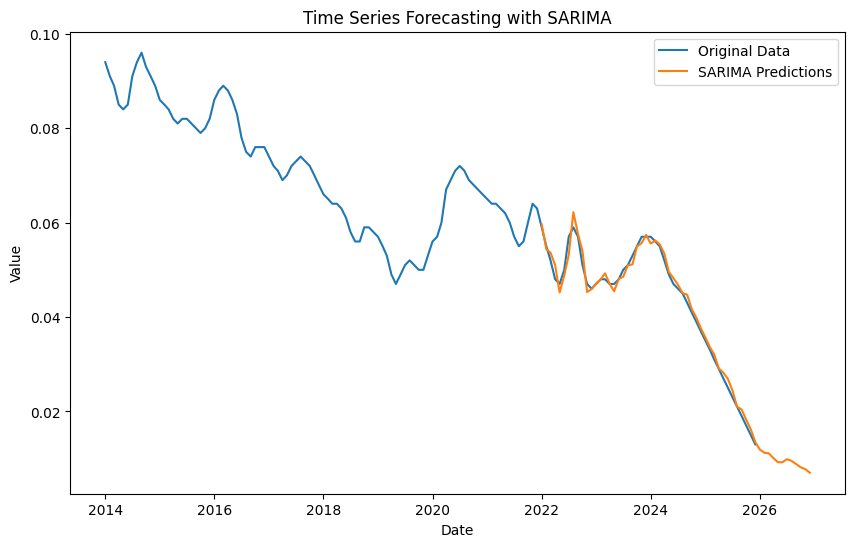

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 1.913503289585615e-06, RMSE: 0.0013832943611486366, MAPE: 2.73%


In [174]:
model_sarima(data_filtered,'Latvia', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1367.883, Time=0.24 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1382.766, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1383.840, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1384.281, Time=0.26 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1384.764, Time=0.05 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 0.636 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 693.382
Date:                Sun, 24 Nov 2024   AIC                          -1384.764
Time:                        18:07:00   BIC                          -1381.808
Sample:                    01-01-2014   HQIC                         -1383.562
                         - 12-01-2025                                         
Covariance Type:                  o

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


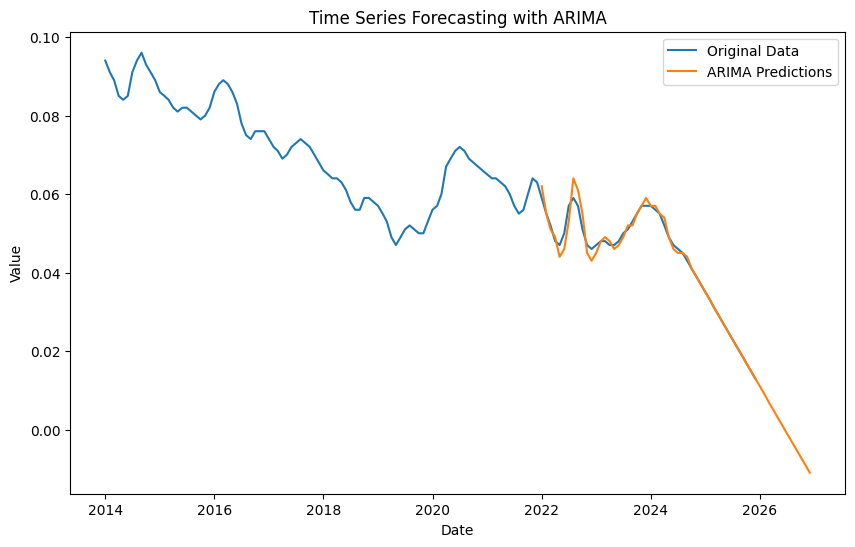

R^2 Score for ARIMA: 0.98
ARIMA - MSE: 3.020746234398489e-06, RMSE: 0.0017380294112581895, MAPE: 2.06%


In [175]:
model_arima(data_filtered,'Latvia', '25+', 'Female')

## 25+, Total

In [176]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Total')

In [177]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9753
Strong seasonality detected.


(0.9752765556426942, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1300.554, Time=1.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1167.369, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1281.777, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1268.896, Time=0.62 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1238.147, Time=0.34 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1294.253, Time=0.97 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1296.205, Time=0.49 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1283.406, Time=0.41 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1291.525, Time=1.59 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1294.263, Time=0.56 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1303.216, Time=0.64 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1240.700, Time=0.22 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1290.931, Time=1.36 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1295.796, Time=1.00 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


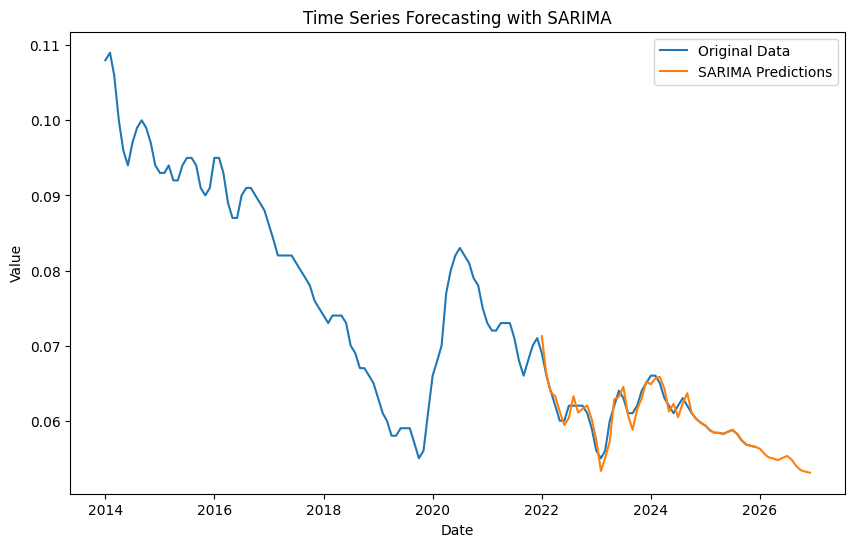

R^2 Score for SARIMA: 0.88
SARIMA - MSE: 1.0653702424339526e-06, RMSE: 0.001032167739485183, MAPE: 1.21%


In [178]:
model_sarima(data_filtered,'Latvia', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1406.074, Time=0.92 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1410.077, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1408.893, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1408.060, Time=0.11 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1412.070, Time=0.02 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 1.154 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  144
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 707.035
Date:                Sun, 24 Nov 2024   AIC                          -1412.070
Time:                        18:07:26   BIC                          -1409.114
Sample:                    01-01-2014   HQIC                         -1410.869
                         - 12-01-2025                                         
Covariance Type:                  o

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


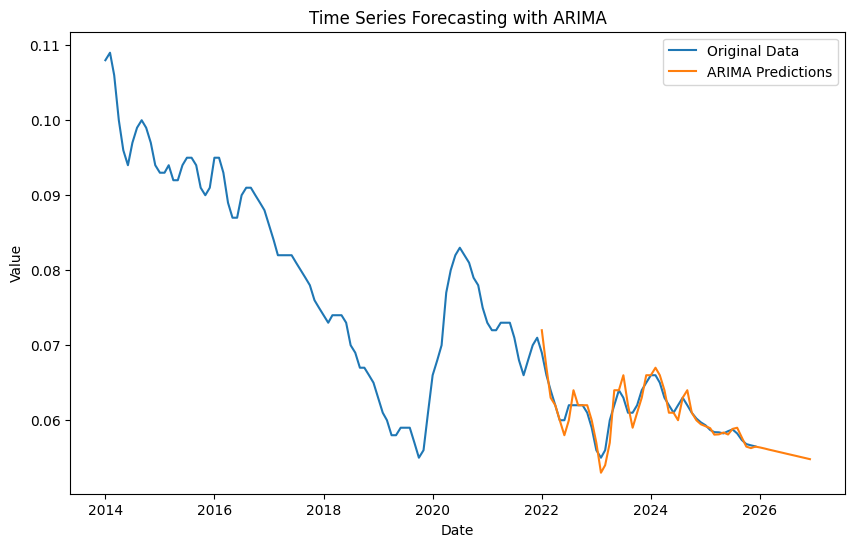

R^2 Score for ARIMA: 0.82
ARIMA - MSE: 1.6155474447354556e-06, RMSE: 0.0012710418737144169, MAPE: 1.49%


In [179]:
model_arima(data_filtered,'Latvia', '25+', 'Total')

# Lithuania

## 15-24,Male

In [180]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Male')

In [181]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7065
Strong seasonality detected.


(0.7065319097842284, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-570.881, Time=1.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-523.132, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-546.641, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-531.068, Time=0.24 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-569.265, Time=1.06 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.35 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-545.909, Time=0.89 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-567.165, Time=2.05 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-571.828, Time=1.03 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-531.643, Time=0.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-569.817, Time=0.76 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-570.568, Time=1.32 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.97 sec
 ARIMA(0,1,0)(0,1,1)[12]          

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


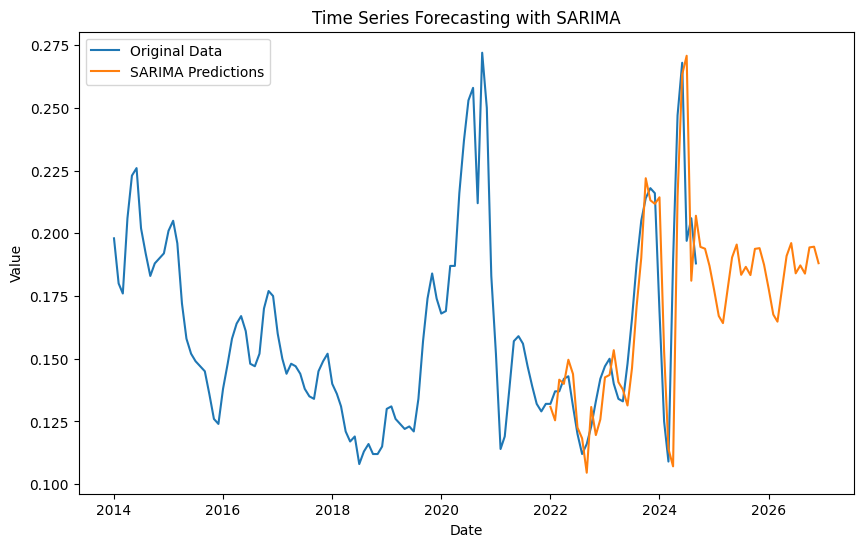

R^2 Score for SARIMA: 0.64
SARIMA - MSE: 0.0005973513543003243, RMSE: 0.02444077237528152, MAPE: 9.65%


In [182]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-596.131, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-602.000, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-598.131, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-603.908, Time=0.03 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-616.765, Time=0.10 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-654.484, Time=0.82 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-644.511, Time=0.34 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-650.542, Time=0.67 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-657.800, Time=0.79 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-618.759, Time=0.13 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-655.169, Time=0.54 sec
 ARIMA(2,2,0)(0,0,0)[0]       

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


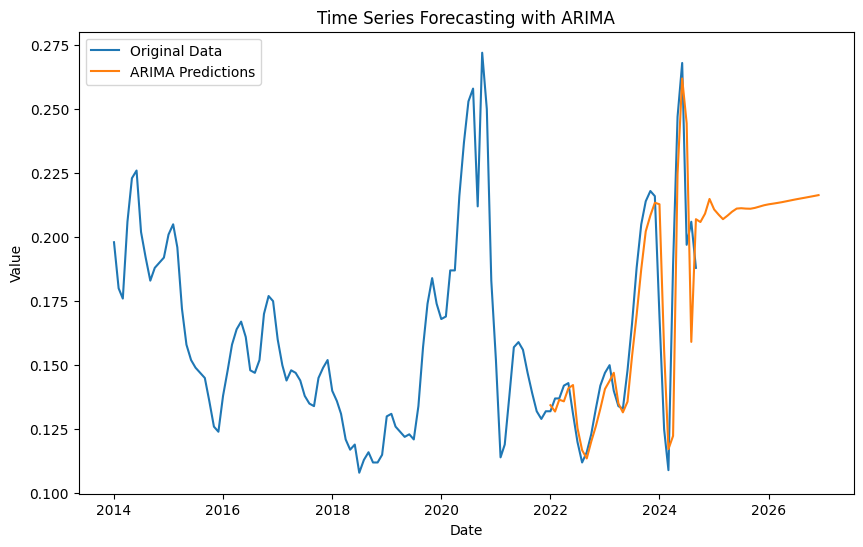

R^2 Score for ARIMA: 0.73
ARIMA - MSE: 0.00043780130902829127, RMSE: 0.020923702087066027, MAPE: 8.10%


In [183]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Female

In [184]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Female')

In [185]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9348
Strong seasonality detected.


(0.9348442230726747, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-683.471, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-736.579, Time=0.86 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-764.653, Time=1.25 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-695.012, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-765.249, Time=2.87 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-739.888, Time=0.87 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-763.234, Time=2.97 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-764.150, Time=3.49 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-764.315, Time=0.78 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-744.060, Time=1.18 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-762.154, Time=3.50 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.49 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-765.188, Time=2.64 sec
 ARIMA(0,1,2)(1,1,1)[12]     

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


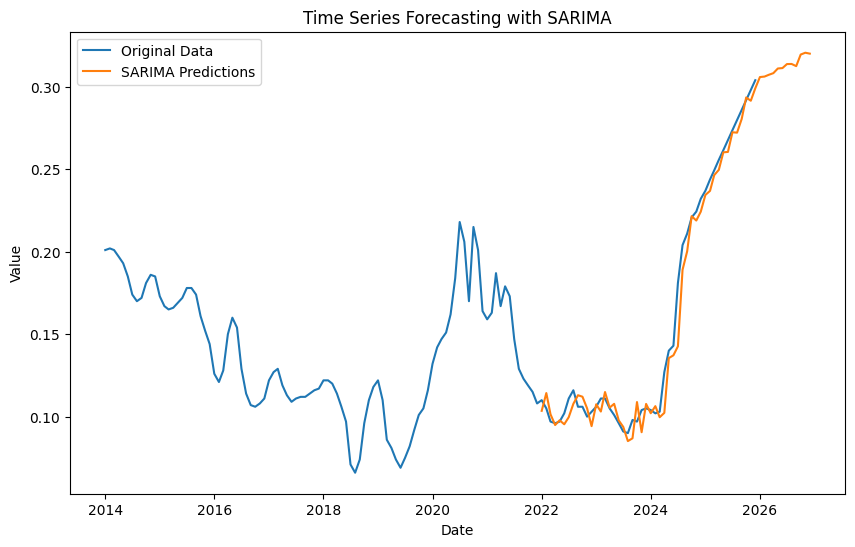

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 8.539990789808748e-05, RMSE: 0.009241207058500935, MAPE: 4.90%


In [186]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Female')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-862.956, Time=1.04 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-807.550, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-818.042, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-809.549, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-862.150, Time=0.46 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-869.800, Time=0.13 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-860.496, Time=0.04 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-864.742, Time=0.62 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-864.552, Time=0.45 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-859.235, Time=0.17 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-870.769, Time=0.52 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-865.906, Time=0.23 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


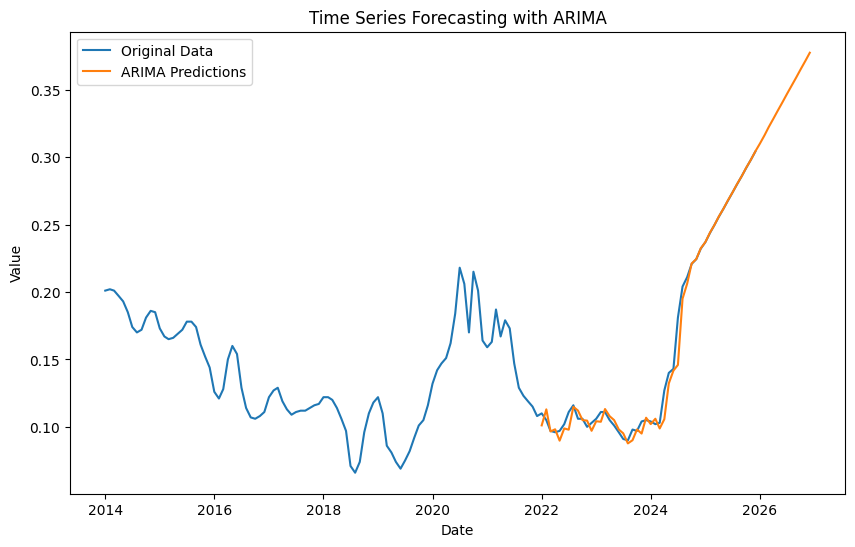

R^2 Score for ARIMA: 0.99
ARIMA - MSE: 5.47349012619577e-05, RMSE: 0.007398303944956418, MAPE: 3.43%


In [187]:
model_arima(data_filtered,'Lithuania', '15-24', 'Female')

## 15-24, Total

In [188]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Total')

In [189]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8252
Strong seasonality detected.


(0.8251824055369972, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-665.724, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-710.781, Time=0.84 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-746.279, Time=0.56 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-673.968, Time=0.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-744.758, Time=1.03 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-712.990, Time=0.28 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=3.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=1.76 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-742.768, Time=0.72 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-743.402, Time=0.63 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]          
T

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


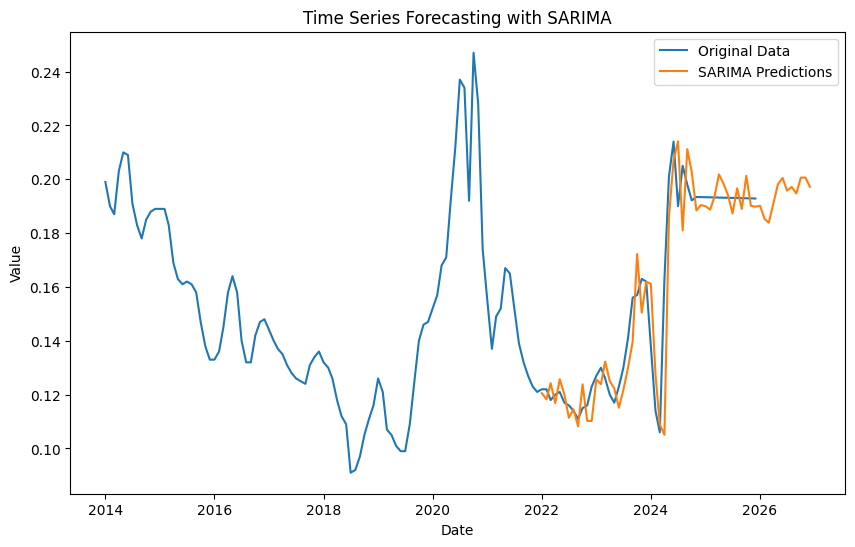

R^2 Score for SARIMA: 0.88
SARIMA - MSE: 0.00015745138836903286, RMSE: 0.012547963514811192, MAPE: 5.44%


In [190]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-816.144, Time=0.78 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-771.149, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-781.424, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-773.146, Time=0.05 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-833.214, Time=0.54 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-793.080, Time=0.08 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-826.659, Time=0.35 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-829.087, Time=0.23 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-797.720, Time=0.27 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-825.719, Time=0.55 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 4.330 seconds
                               SARIMAX Results                                
D

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


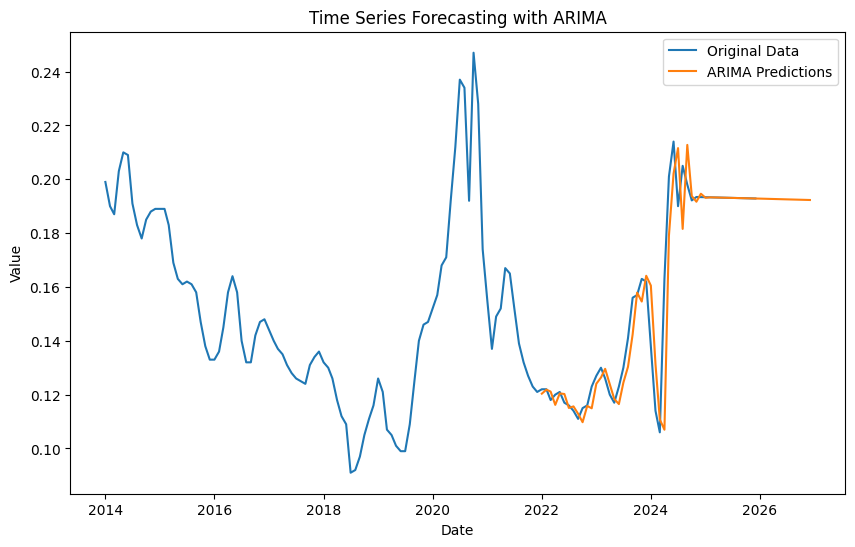

R^2 Score for ARIMA: 0.89
ARIMA - MSE: 0.0001348633446495346, RMSE: 0.01161306783970259, MAPE: 3.97%


In [191]:
model_arima(data_filtered,'Lithuania', '15-24', 'Total')

## 25+, Female

In [192]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Female')

In [193]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9327
Strong seasonality detected.


(0.9326896998641082, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1156.861, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1099.880, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1156.192, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1158.534, Time=0.70 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1105.065, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1163.022, Time=0.54 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1154.635, Time=0.50 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1161.414, Time=1.34 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1154.622, Time=2.23 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.06 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-1163.068, Time=0.81 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1157.752, Time=0.47 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1162.053, Time=1.42 sec
 ARIMA(0,1,2)(2,1,0)[12]             : AIC=-1162.532, Time=0.88 sec
 ARIMA(1,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


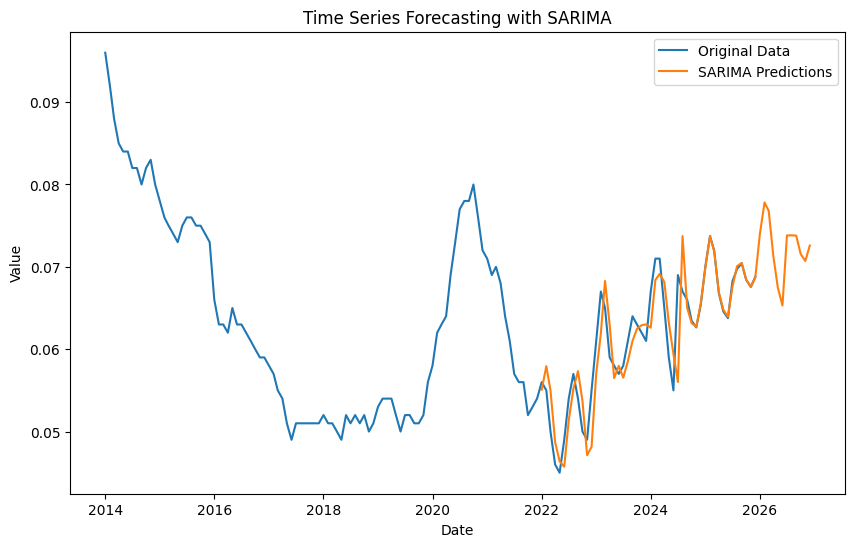

R^2 Score for SARIMA: 0.79
SARIMA - MSE: 1.0972233215357322e-05, RMSE: 0.003312436145098849, MAPE: 3.85%


In [194]:
model_sarima(data_filtered,'Lithuania', '25+', 'Female')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1212.191, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1217.356, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1222.757, Time=0.23 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1214.174, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1257.014, Time=0.25 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1255.314, Time=0.85 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-1248.242, Time=0.91 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1252.865, Time=0.24 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-1258.770, Time=0.28 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-1251.296, Time=0.47 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-1260.092, Time=0.59 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1212.704, Time=0.41 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-1260.018, Time=0.24 sec
 ARIMA(1,2,3)(0,0,0)[0]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodel

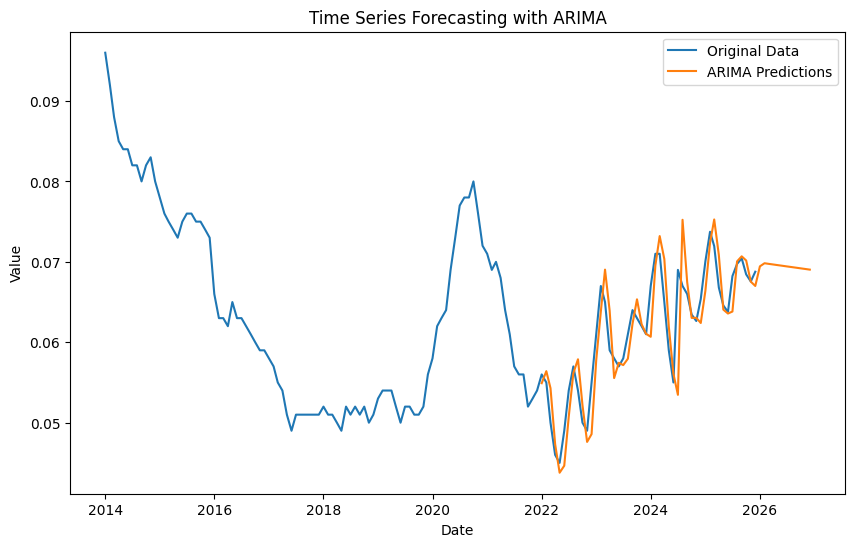

R^2 Score for ARIMA: 0.73
ARIMA - MSE: 1.4135867385013957e-05, RMSE: 0.0037597695920114516, MAPE: 4.34%


In [195]:
model_arima(data_filtered,'Lithuania',  '25+', 'Female')

## 25+, Male

In [196]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Male')

In [197]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9525
Strong seasonality detected.


(0.9525419947039109, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1096.904, Time=1.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1061.775, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1078.304, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1100.064, Time=0.57 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1060.780, Time=0.33 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1095.371, Time=0.85 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1097.904, Time=0.55 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1078.214, Time=0.45 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1073.506, Time=0.77 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1097.761, Time=0.40 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1101.390, Time=1.12 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-1063.490, Time=0.25 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1107.852, Time=2.17 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-1080.679, Time=0.63 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


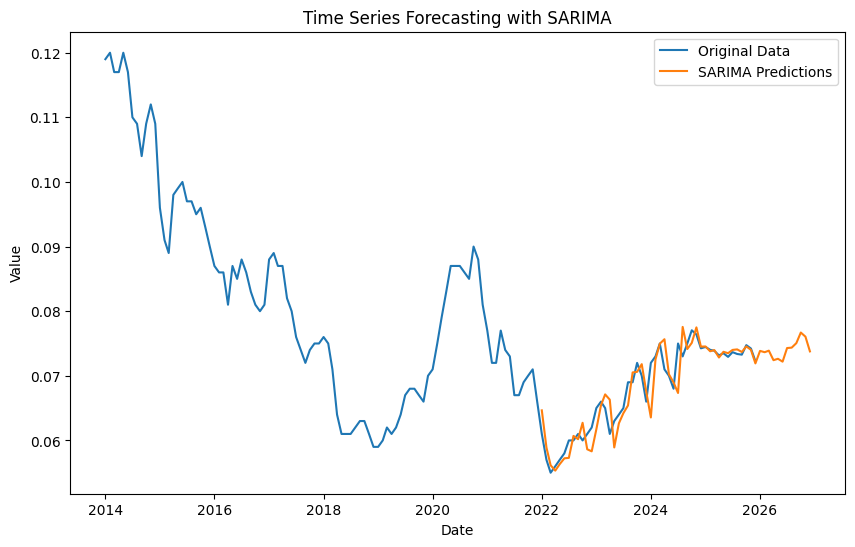

R^2 Score for SARIMA: 0.84
SARIMA - MSE: 6.703397710300434e-06, RMSE: 0.0025890920629248458, MAPE: 2.63%


In [198]:
model_sarima(data_filtered,'Lithuania', '25+', 'Male')

## 25+, Total

In [199]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Total')

In [200]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9546
Strong seasonality detected.


(0.9545802937060193, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1153.764, Time=1.54 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1097.989, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1129.786, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1155.804, Time=0.63 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1096.817, Time=0.21 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1153.853, Time=0.43 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1151.657, Time=1.91 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1129.309, Time=0.54 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1123.663, Time=1.66 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1154.564, Time=0.91 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1155.291, Time=1.70 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1156.159, Time=0.53 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1096.944, Time=0.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1156.295, Time=0.96 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


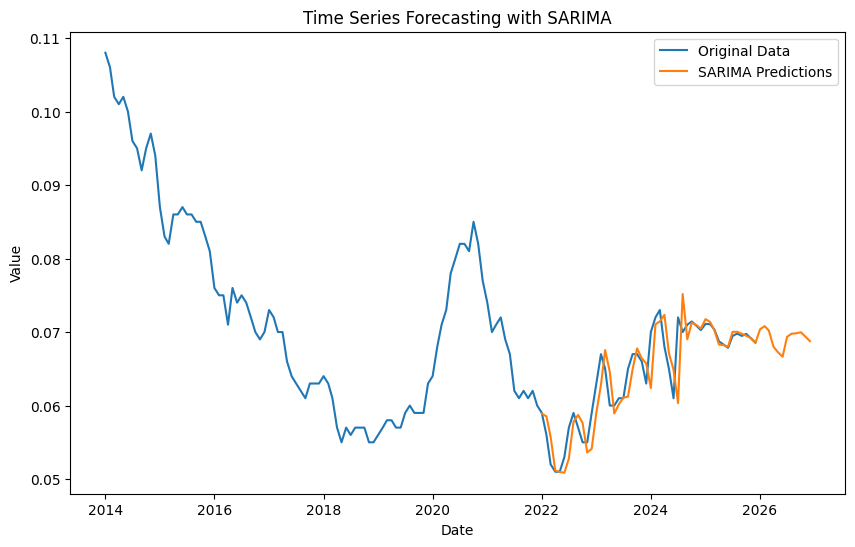

R^2 Score for SARIMA: 0.78
SARIMA - MSE: 9.103470410380426e-06, RMSE: 0.00301719578588802, MAPE: 3.09%


In [201]:
model_sarima(data_filtered,'Lithuania', '25+', 'Total')

# Slovakia

## 15-24, Female

In [202]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Female')

In [203]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9198
Strong seasonality detected.


(0.9198242158531775, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-856.225, Time=1.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-701.618, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-817.819, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-841.068, Time=0.75 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-777.230, Time=0.12 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-854.346, Time=2.14 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-857.828, Time=1.35 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.24 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-843.665, Time=1.96 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-854.369, Time=1.97 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-858.896, Time=1.91 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-860.971, Time=0.85 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-783.521, Time=0.21 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-861.419, Time=2.24 sec
 ARIMA(2,1,1)(1,1,0)[12]

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


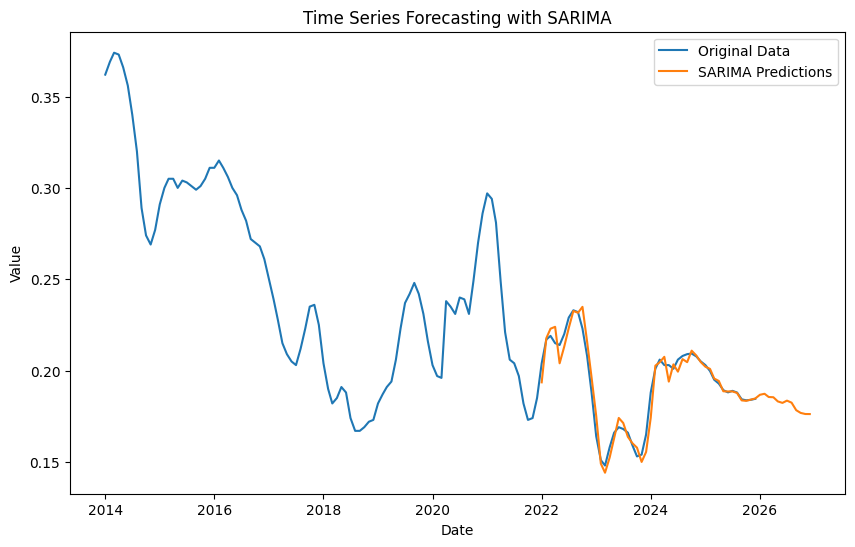

R^2 Score for SARIMA: 0.94
SARIMA - MSE: 2.900409661932076e-05, RMSE: 0.0053855451552578, MAPE: 2.04%


In [204]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Female')

## 15-24, Male

In [205]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Male')

In [206]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9557
Strong seasonality detected.


(0.955702577347226, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-936.391, Time=1.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-824.440, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-912.939, Time=0.43 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-936.856, Time=2.87 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-883.357, Time=0.89 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-932.077, Time=2.35 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-932.710, Time=2.02 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-911.456, Time=1.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-932.219, Time=2.52 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-890.417, Time=1.43 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-937.845, Time=1.25 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-890.841, Time=0.57 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-939.346, Time=4.85 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-915.292, Time=2.62 sec
 ARIMA(0,1,2)(2,1,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


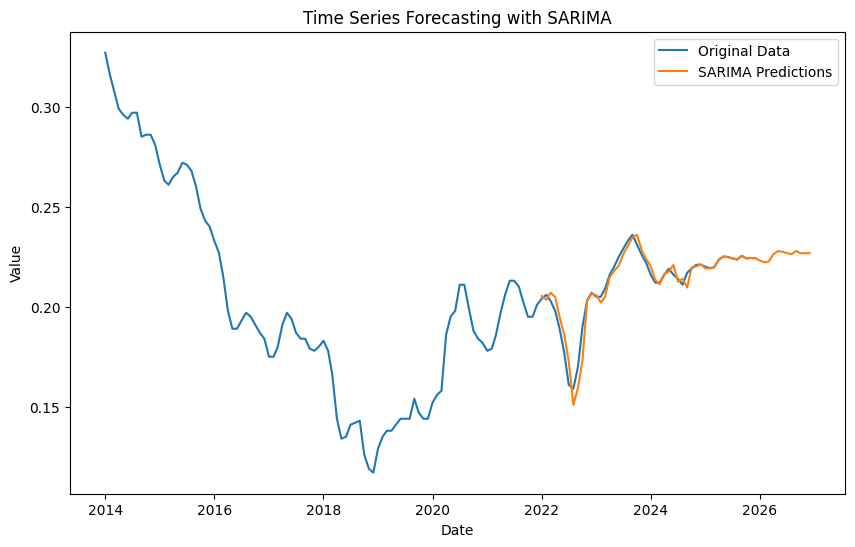

R^2 Score for SARIMA: 0.93
SARIMA - MSE: 2.084511230873139e-05, RMSE: 0.00456564478564982, MAPE: 1.47%


In [207]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Male')

## 15-24, Total

In [208]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Total')

In [209]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9704
Strong seasonality detected.


(0.9704106638059204, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-963.020, Time=1.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-870.986, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-927.747, Time=0.43 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-963.516, Time=0.77 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-898.932, Time=0.33 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-961.118, Time=1.78 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.39 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-926.883, Time=0.97 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-961.522, Time=1.30 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-934.733, Time=0.35 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-962.643, Time=0.92 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-964.000, Time=0.50 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-899.171, Time=0.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(1,1,0)(0,1,2)[12]     

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


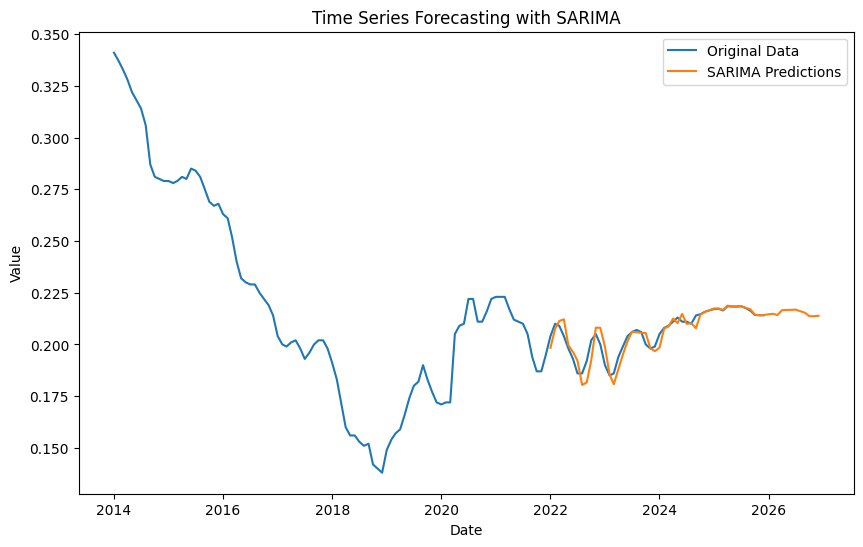

R^2 Score for SARIMA: 0.83
SARIMA - MSE: 1.6133431955242828e-05, RMSE: 0.004016644365044387, MAPE: 1.34%


In [210]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Total')

## 25+, Female

In [211]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Female')

In [212]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9967
Strong seasonality detected.


(0.9967054355884196, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1353.828, Time=1.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1279.627, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1342.746, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1350.610, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1327.560, Time=0.35 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1342.109, Time=0.53 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1366.002, Time=1.27 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1361.377, Time=2.11 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1363.240, Time=0.77 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1368.177, Time=0.92 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1355.934, Time=0.40 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1363.598, Time=0.91 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1344.233, Time=0.64 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1317.796, Time=0.24 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


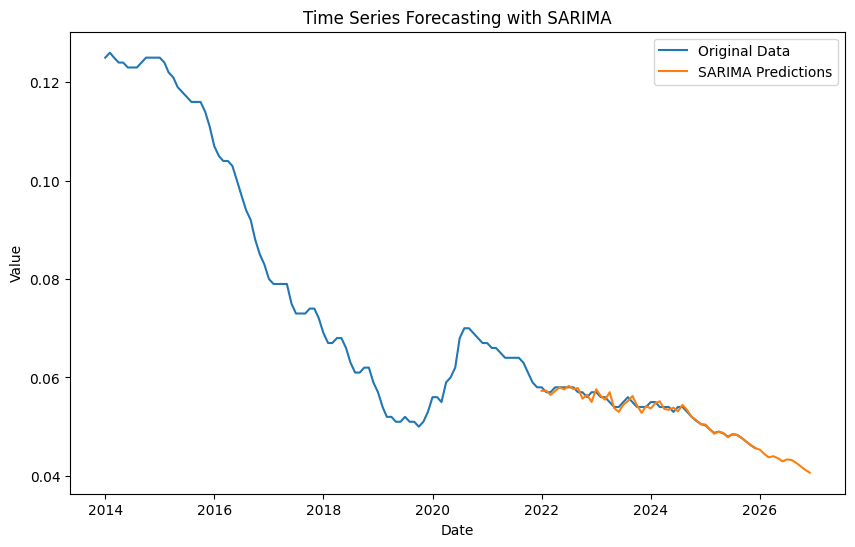

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 4.930979891239126e-07, RMSE: 0.0007022093627429874, MAPE: 0.91%


In [213]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Female')

## 25+, Male

In [214]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Male')

In [215]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9983
Strong seasonality detected.


(0.998300506073406, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1425.469, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1363.056, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1411.448, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1410.014, Time=0.72 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1377.448, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1421.032, Time=0.51 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1419.714, Time=0.57 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1430.951, Time=1.65 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1429.361, Time=2.02 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1417.958, Time=0.69 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1410.744, Time=1.16 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1420.455, Time=1.37 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1428.823, Time=1.38 sec
 ARIMA(1,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


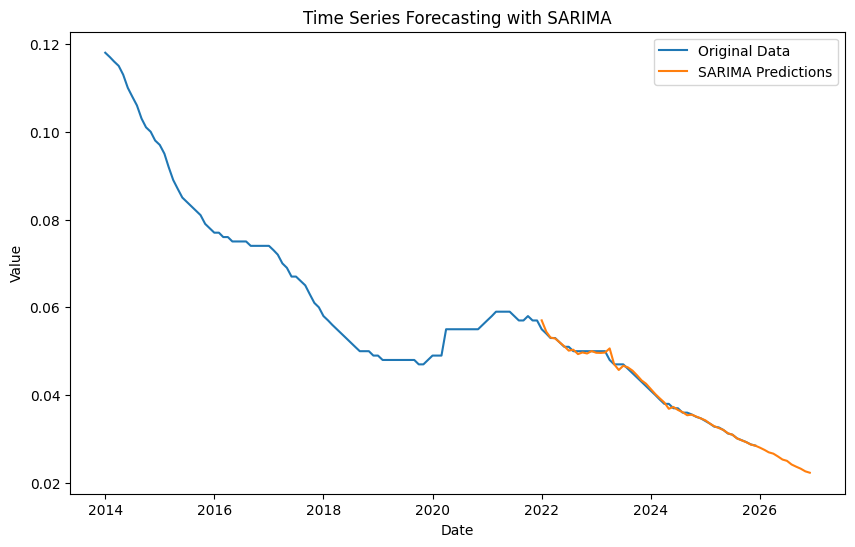

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 3.847187868820464e-07, RMSE: 0.000620257032916231, MAPE: 0.81%


In [216]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Male')

## 25+, Total

In [217]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Total')

In [218]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9987
Strong seasonality detected.


(0.9986793327548413, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1436.578, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1386.078, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1415.190, Time=0.40 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1421.442, Time=0.18 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1400.284, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1429.422, Time=0.59 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1423.825, Time=0.52 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1436.733, Time=1.23 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1432.300, Time=1.39 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1433.467, Time=1.29 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1418.751, Time=1.96 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1424.070, Time=0.78 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1433.328, Time=1.57 sec
 ARIMA(1,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


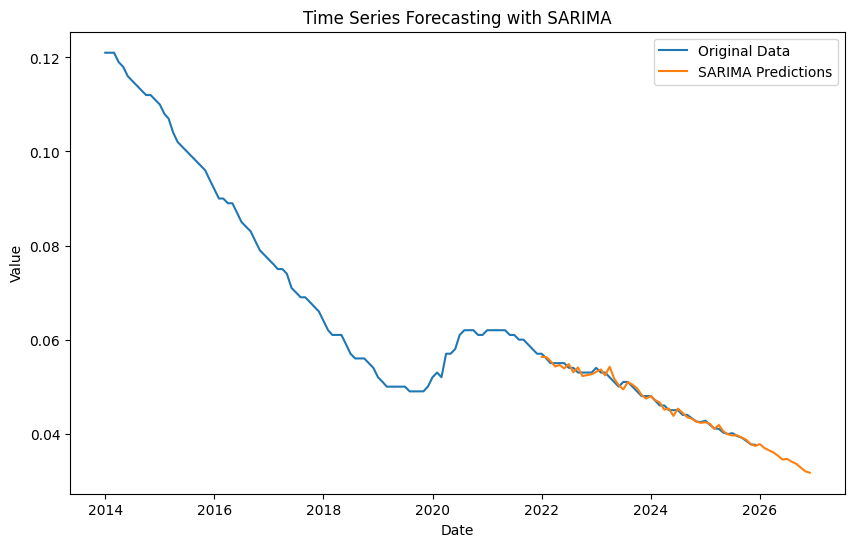

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 4.513898468004769e-07, RMSE: 0.0006718555252436917, MAPE: 1.05%


In [219]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Total')

# Hungary

## 15-24, Female

In [220]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Female')

In [221]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9299
Strong seasonality detected.


(0.9298705404164703, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-828.970, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-872.232, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-834.106, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-892.996, Time=2.48 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-895.541, Time=2.69 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-902.487, Time=1.26 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-908.694, Time=0.98 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.65 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.48 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-908.740, Time=0.58 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=-833.962, Time=0.19 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


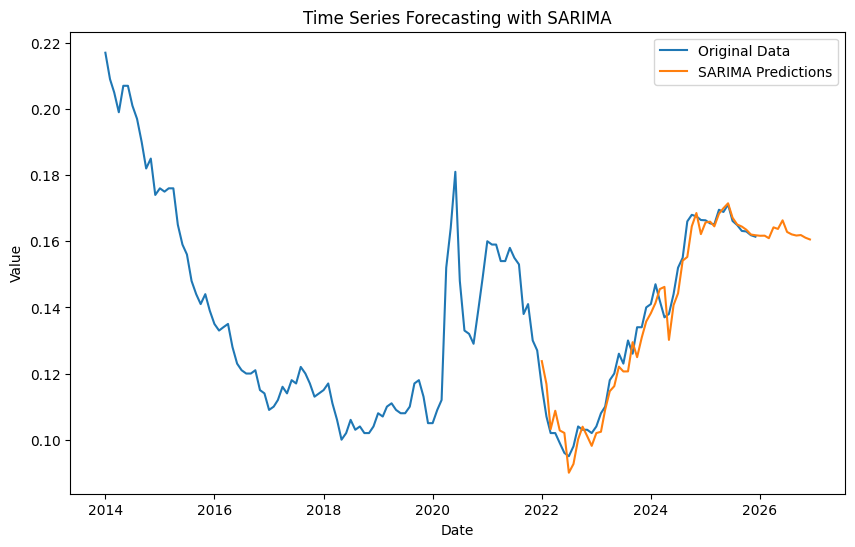

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 2.2054314723405336e-05, RMSE: 0.004696202159554605, MAPE: 2.94%


In [222]:
model_sarima(data_filtered,'Hungary', '15-24', 'Female')

## 15-24, Male

In [223]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Male')

In [224]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9648
Strong seasonality detected.


(0.9647779271378603, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-946.497, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-884.931, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-920.993, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-952.587, Time=1.76 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-895.455, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-928.597, Time=0.34 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-948.228, Time=1.65 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-921.472, Time=0.84 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-947.014, Time=1.39 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-934.204, Time=0.61 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-965.699, Time=1.06 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-908.846, Time=1.08 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-954.224, Time=2.14 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-965.018, Time=2.18 sec
 ARIMA(0,1,2)(1,1,0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


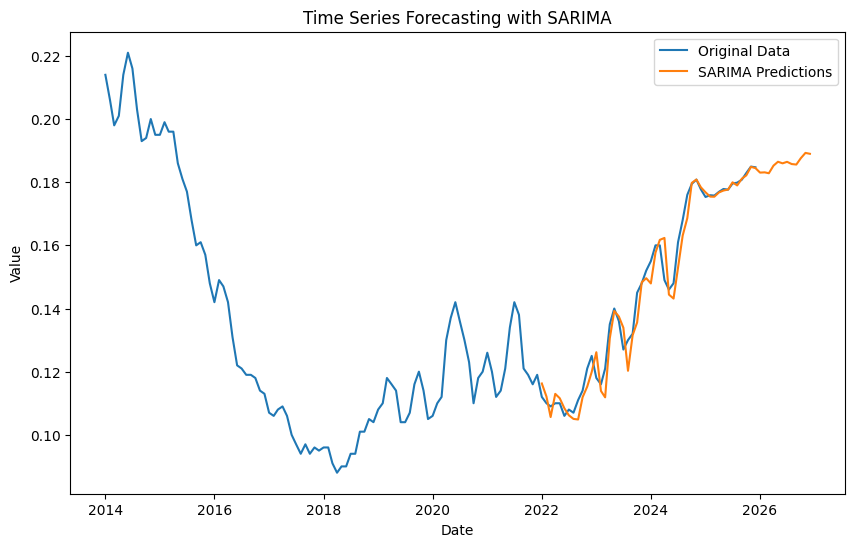

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 2.05187802330325e-05, RMSE: 0.004529766024093574, MAPE: 2.37%


In [225]:
model_sarima(data_filtered,'Hungary', '15-24', 'Male')

## 15-24, Total

In [226]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Total')

In [227]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9604
Strong seasonality detected.


(0.9603761227878713, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-950.705, Time=0.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-883.379, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-922.657, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-888.689, Time=0.58 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-953.234, Time=2.09 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-920.666, Time=0.37 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-936.906, Time=0.49 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.99 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-939.738, Time=1.60 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=2.43 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-933.407, Time=0.85 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-935.431, Time=0.40 sec
 ARIMA(2,1,1)(1,1,1)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


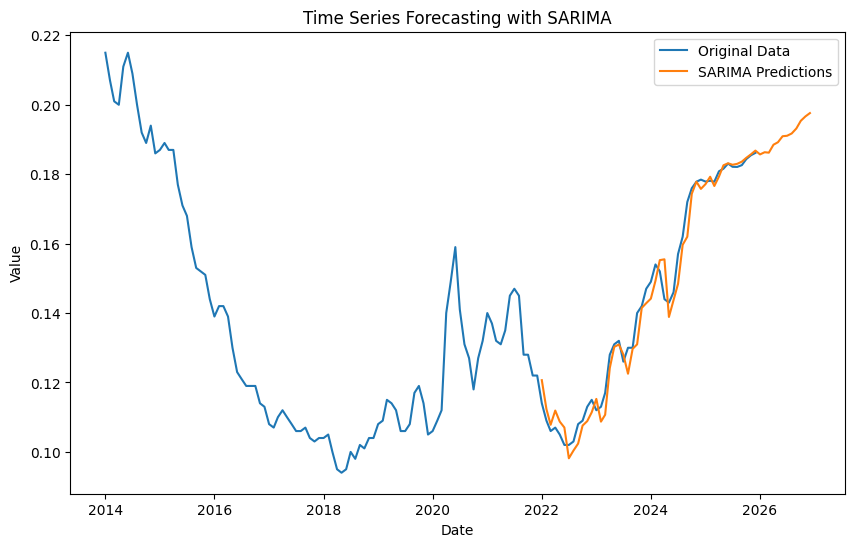

R^2 Score for SARIMA: 0.98
SARIMA - MSE: 1.792117679371212e-05, RMSE: 0.004233341091113746, MAPE: 2.46%


In [228]:
model_sarima(data_filtered,'Hungary', '15-24', 'Total')

## 25+, Female

In [229]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Female')

In [230]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9898
Strong seasonality detected.


(0.9897664361756361, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1335.629, Time=2.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1282.919, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1312.523, Time=2.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1338.490, Time=1.86 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1281.463, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1333.619, Time=3.24 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1277.461, Time=0.92 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1312.562, Time=1.08 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1339.634, Time=0.90 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1334.956, Time=2.48 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1278.917, Time=0.87 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1314.241, Time=0.44 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=3.81 sec
 ARIMA(1,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1908: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(0,1,2)[12] intercept   : AIC=-1277.026, Time=1.63 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=-1312.707, Time=2.17 sec
 ARIMA(0,1,0)(1,1,2)[12] intercept   : AIC=inf, Time=4.72 sec
 ARIMA(1,1,0)(0,1,1)[12] intercept   : AIC=-1341.957, Time=1.47 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1342.030, Time=1.34 sec
 ARIMA(1,1,1)(0,1,1)[12] intercept   : AIC=-1339.835, Time=1.83 sec

Best model:  ARIMA(0,1,0)(0,1,1)[12] intercept
Total fit time: 43.442 seconds
                                      SARIMAX Results                                       
Dep. Variable:                                    y   No. Observations:                  144
Model:             SARIMAX(0, 1, 0)x(0, 1, [1], 12)   Log Likelihood                 674.917
Date:                              Sun, 24 Nov 2024   AIC                          -1343.834
Time:                                      18:21:09   BIC                          -1335.209
Sample:                                  01-01-2014   

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


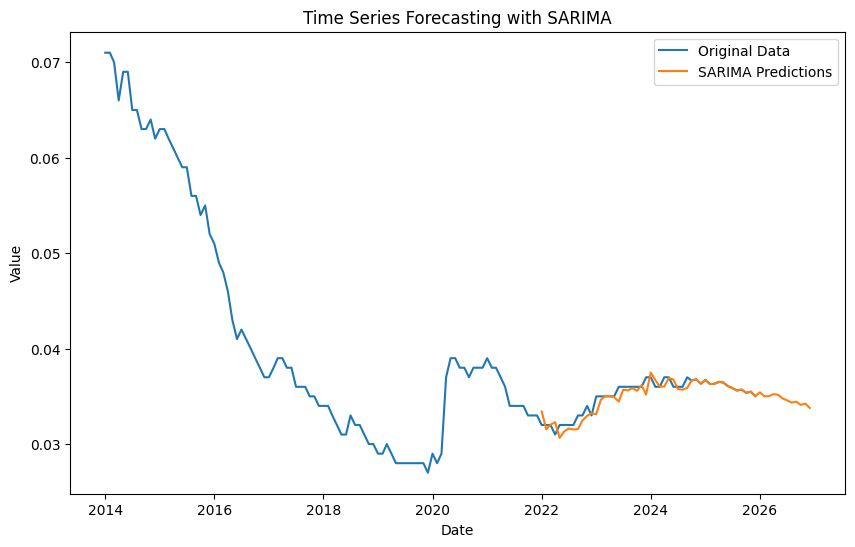

R^2 Score for SARIMA: 0.84
SARIMA - MSE: 4.874452844908184e-07, RMSE: 0.0006981728184989862, MAPE: 1.29%


In [231]:
model_sarima(data_filtered,'Hungary', '25+', 'Female')

## 25+, Male

In [232]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Male')

In [233]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.992940570278658, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1382.963, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1342.066, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1368.264, Time=0.73 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1384.159, Time=0.90 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1340.311, Time=0.46 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1377.940, Time=0.66 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1367.784, Time=1.10 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1385.503, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1379.568, Time=0.65 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1369.874, Time=0.63 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(1,1,0)(0,1,1)[12]     

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


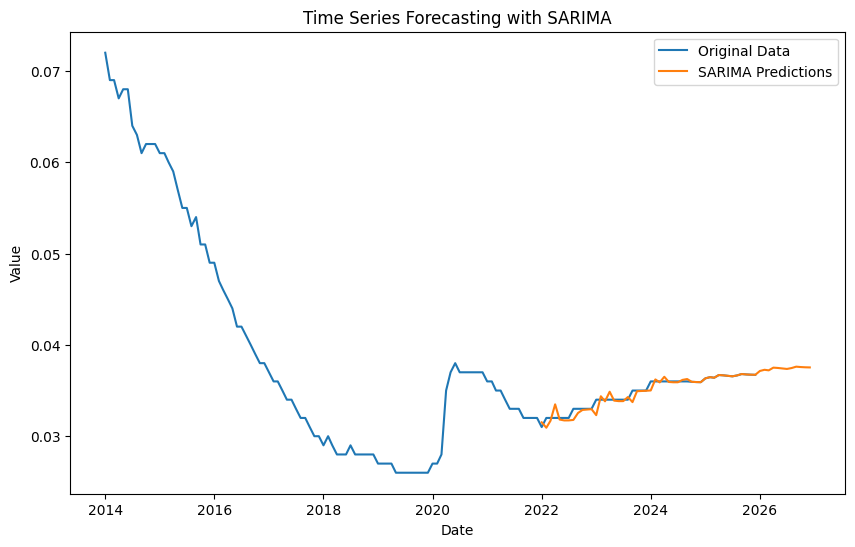

R^2 Score for SARIMA: 0.91
SARIMA - MSE: 2.625089722639746e-07, RMSE: 0.0005123562942562282, MAPE: 0.85%


In [234]:
model_sarima(data_filtered,'Hungary', '25+', 'Male')

## 25+, Total

In [235]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Total')

In [236]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9929106780587006, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1383.883, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1337.785, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1365.483, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1385.305, Time=1.13 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1336.124, Time=0.30 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1378.787, Time=1.17 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1365.341, Time=1.39 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1383.849, Time=1.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1386.418, Time=0.63 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1380.079, Time=0.19 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1366.945, Time=0.31 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1384.476, Time=1.28 sec
 ARIMA(1,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


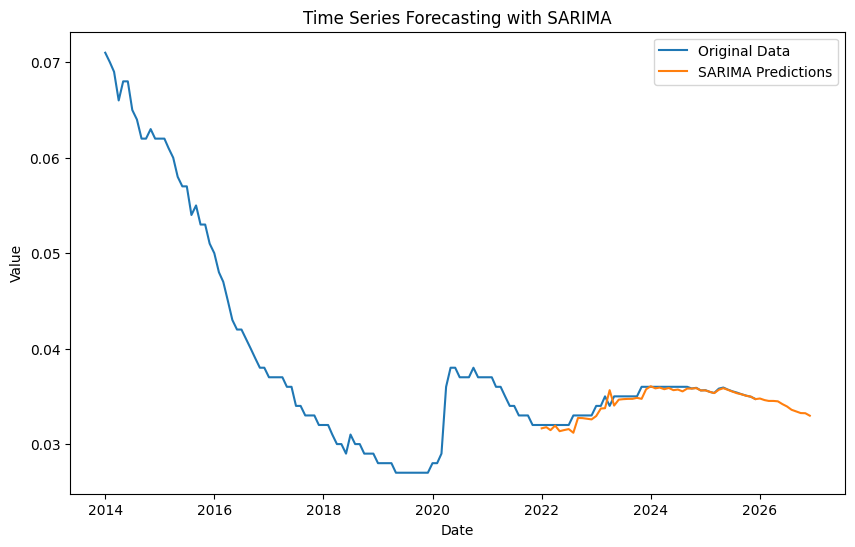

R^2 Score for SARIMA: 0.85
SARIMA - MSE: 2.935079681705167e-07, RMSE: 0.0005417637567893562, MAPE: 1.00%


In [237]:
model_sarima(data_filtered,'Hungary', '25+', 'Total')

# USA

## 15-24, Male

In [238]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Male')

In [239]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6669
Weak or no seasonality detected.


(0.6669207460073665, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.54 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-630.202, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-660.111, Time=0.40 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-629.685, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-667.767, Time=1.38 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=5.10 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.80 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-667.801, Time=0.94 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-660.748, Time=0.38 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.73 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-669.161, Time=0.65 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-660.975, Time=0.50 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, T

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


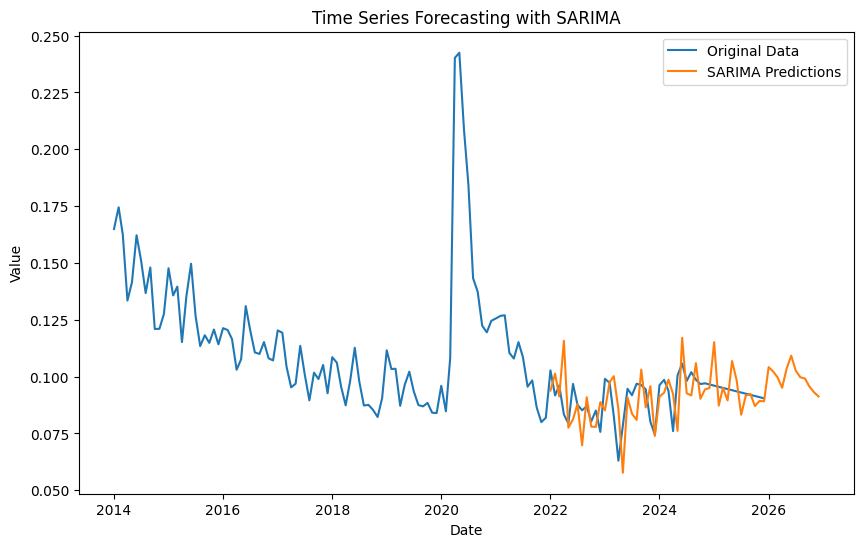

R^2 Score for SARIMA: -0.78
SARIMA - MSE: 0.00012879524636028703, RMSE: 0.011348799335625203, MAPE: 9.90%


In [240]:
model_sarima(data_filtered,'United States of America', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-747.777, Time=0.80 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-675.649, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-689.339, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-677.648, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-755.563, Time=0.88 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-755.120, Time=0.10 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-752.506, Time=0.76 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-758.362, Time=0.61 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 4.682 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:               

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodel

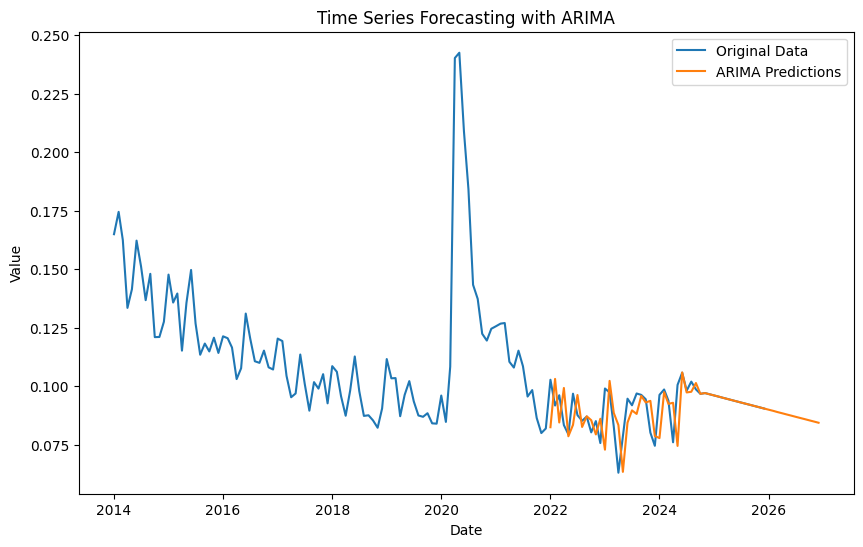

R^2 Score for ARIMA: -0.29
ARIMA - MSE: 9.299011442715512e-05, RMSE: 0.009643138204296105, MAPE: 6.93%


In [241]:
model_arima(data_filtered,'United States of America', '15-24', 'Male')

## 15-24, Female

In [242]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Female')

In [243]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6009
Weak or no seasonality detected.


(0.6008706880716919, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-549.351, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-577.981, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-547.356, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-587.226, Time=0.90 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-589.222, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-579.980, Time=0.49 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-608.069, Time=0.58 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


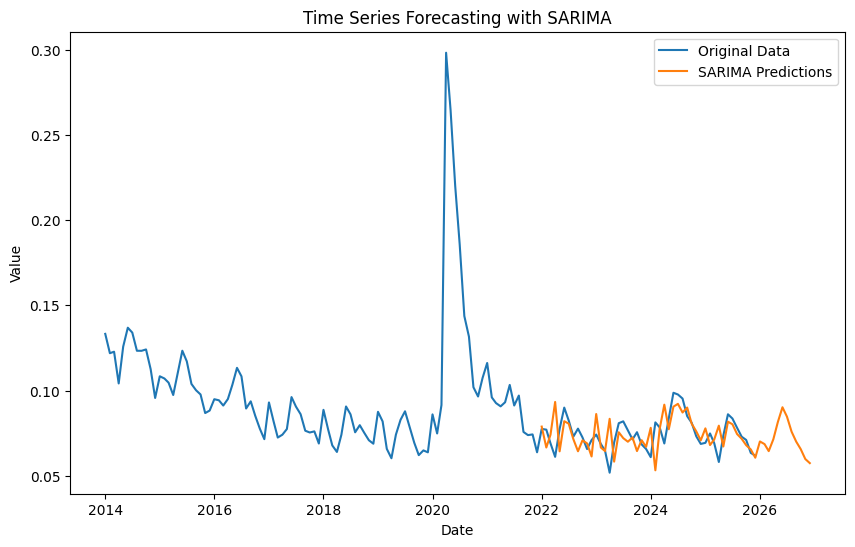

R^2 Score for SARIMA: -0.29
SARIMA - MSE: 0.00012116015317142247, RMSE: 0.01100727728239016, MAPE: 10.95%


In [244]:
model_sarima(data_filtered,'United States of America', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-593.791, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-616.585, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-595.790, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-638.324, Time=0.03 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-642.298, Time=0.52 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-679.977, Time=0.50 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-679.106, Time=0.30 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 4.943 seconds
                               SARIMAX Results                                
Dep. Variable:  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


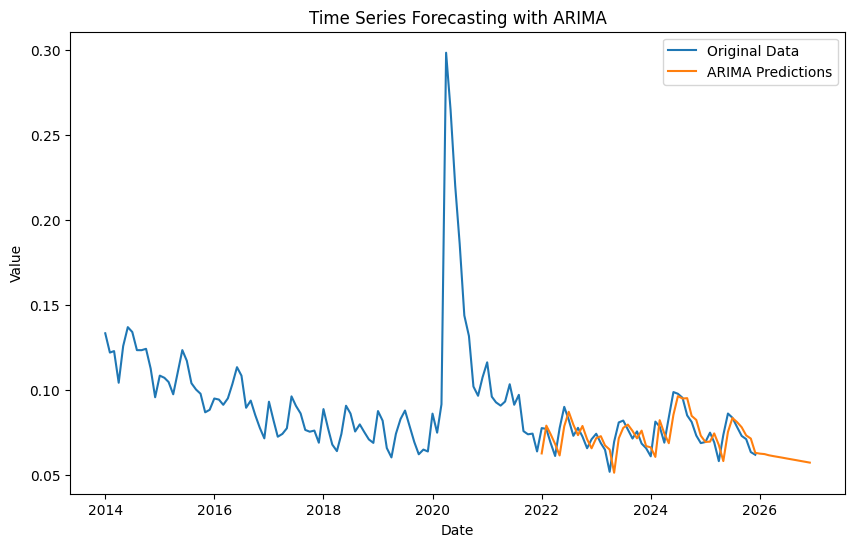

R^2 Score for ARIMA: 0.26
ARIMA - MSE: 6.983837462677142e-05, RMSE: 0.008356935719913814, MAPE: 9.12%


In [245]:
model_arima(data_filtered,'United States of America', '15-24', 'Female')

## 15-24, Total

In [246]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Total')

In [247]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6264
Weak or no seasonality detected.


(0.6263766330011036, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-596.626, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-626.236, Time=1.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-595.496, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-634.393, Time=1.00 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-632.686, Time=0.22 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-638.186, Time=0.89 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-629.662, Time=0.51 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=2.22 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-636.402, Time=1.31 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-640.6

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


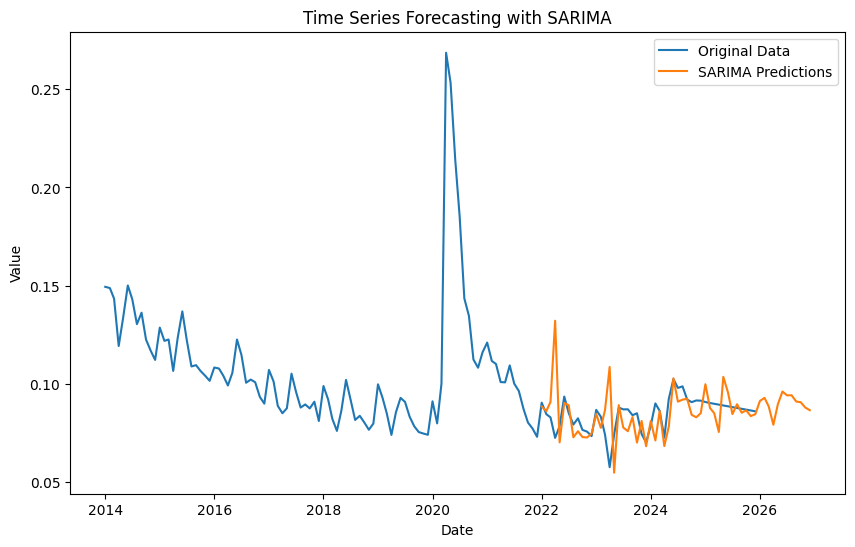

R^2 Score for SARIMA: -1.75
SARIMA - MSE: 0.0001861157667901481, RMSE: 0.013642425253236614, MAPE: 10.29%


In [248]:
model_sarima(data_filtered,'United States of America', '15-24', 'Total')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-651.139, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-666.699, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-653.139, Time=0.01 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-689.555, Time=0.13 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-693.854, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-730.057, Time=0.85 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-728.379, Time=0.50 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-727.391, Time=0.85 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.90 sec

Best model:  ARIMA(3,2,1)(0,0,0)[0] intercept
Total fit time: 5.390 seconds
                               SARIMAX Results                                
Dep. Variable:               

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


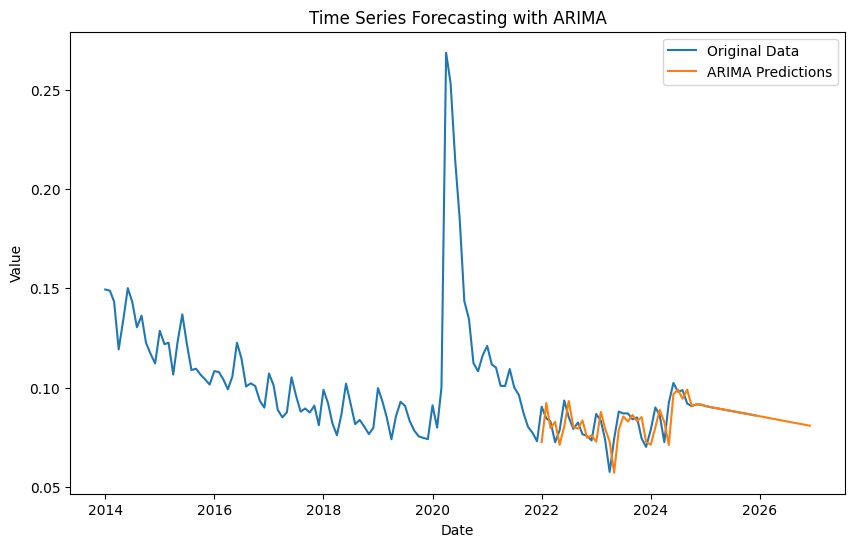

R^2 Score for ARIMA: 0.18
ARIMA - MSE: 5.573505188820807e-05, RMSE: 0.007465591194822287, MAPE: 6.19%


In [249]:
model_arima(data_filtered,'United States of America', '15-24', 'Total')

## 25+, Male

In [250]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Male')

In [251]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7140
Strong seasonality detected.


(0.7139704278385417, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-862.819, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-806.233, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-836.436, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-803.022, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-860.028, Time=0.95 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.57 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-835.256, Time=1.15 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-867.635, Time=1.09 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-802.160, Time=0.34 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=inf, T

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


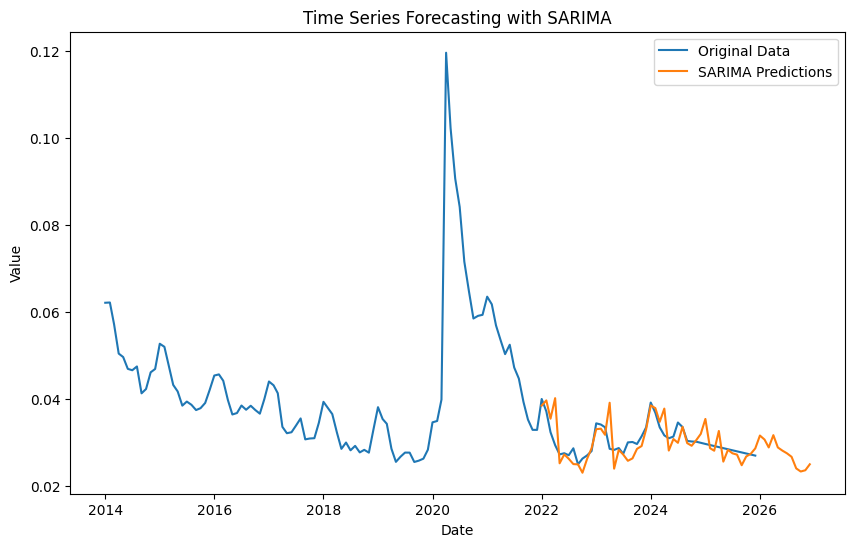

R^2 Score for SARIMA: 0.07
SARIMA - MSE: 1.0156564833323346e-05, RMSE: 0.003186936590728367, MAPE: 7.16%


In [252]:
model_sarima(data_filtered,'United States of America', '25+', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-951.388, Time=0.41 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-877.326, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-912.005, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-879.326, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-950.343, Time=0.80 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-955.656, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-959.761, Time=0.08 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-961.632, Time=0.43 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-958.838, Time=0.53 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-963.187, Time=0.14 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-961.746, Time=0.32 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=inf, Time=0.83 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-966.674, Time=0.07 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.11 sec
 ARIMA(2,2,2)(0,0,0)[0]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


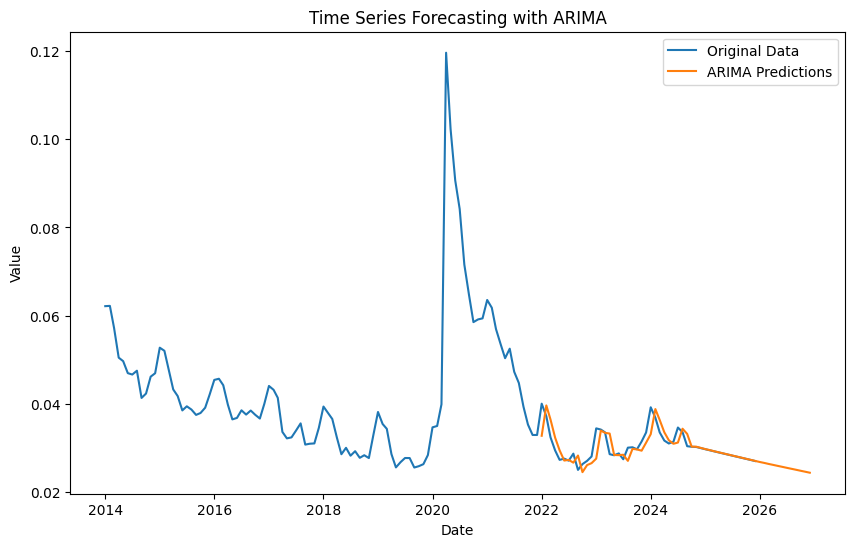

R^2 Score for ARIMA: 0.48
ARIMA - MSE: 5.670598347988078e-06, RMSE: 0.0023813018179113872, MAPE: 4.64%


In [253]:
model_arima(data_filtered,'United States of America', '25+', 'Male')

## 25+, Female

In [254]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Female')

In [255]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6546
Weak or no seasonality detected.


(0.6545782585086141, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-739.421, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-769.434, Time=0.50 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-802.274, Time=0.40 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-737.435, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-769.762, Time=0.75 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-805.068, Time=0.68 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-741.243, Time=0.46 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-773.189, T

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


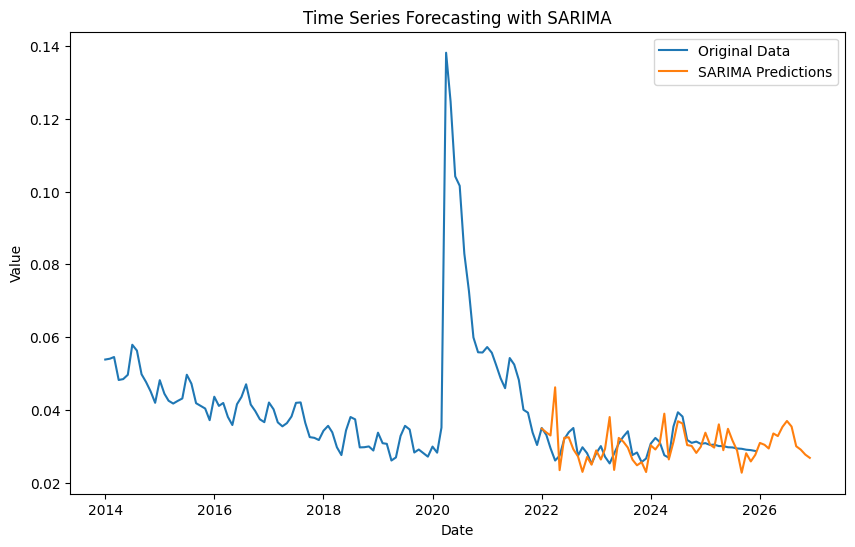

R^2 Score for SARIMA: -1.39
SARIMA - MSE: 2.25764672020538e-05, RMSE: 0.004751470004330639, MAPE: 10.42%


In [256]:
model_sarima(data_filtered,'United States of America', '25+', 'Female')

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-898.830, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-811.822, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-836.913, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-871.849, Time=0.04 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-813.822, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-899.087, Time=0.40 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-859.414, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-897.639, Time=0.72 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-897.683, Time=0.96 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-887.702, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-861.447, Time=0.07 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-891.745, Time=0.66 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.25 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 4.160 seconds
                           

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


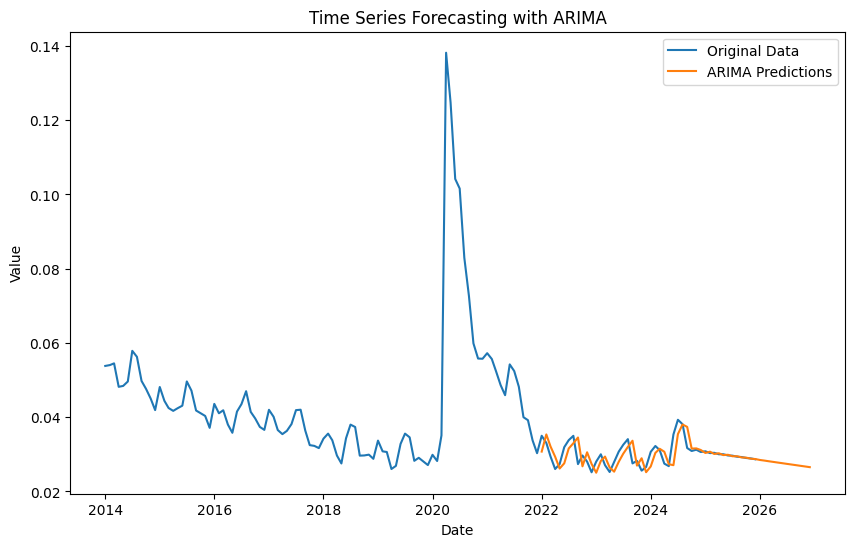

R^2 Score for ARIMA: 0.15
ARIMA - MSE: 8.01464798563806e-06, RMSE: 0.002831015363016962, MAPE: 6.87%


In [257]:
model_arima(data_filtered,'United States of America', '25+', 'Female')

## 25+, Total

In [258]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Total')

In [259]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6785
Weak or no seasonality detected.


(0.6785304299572812, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-835.244, Time=0.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-774.927, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-805.081, Time=0.54 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.34 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-771.001, Time=0.22 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-831.413, Time=1.52 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.71 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-803.405, Time=1.40 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=3.62 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-839.124, Time=1.65 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-771.659, Time=0.25 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=inf, Time=2.80 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-803.3

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


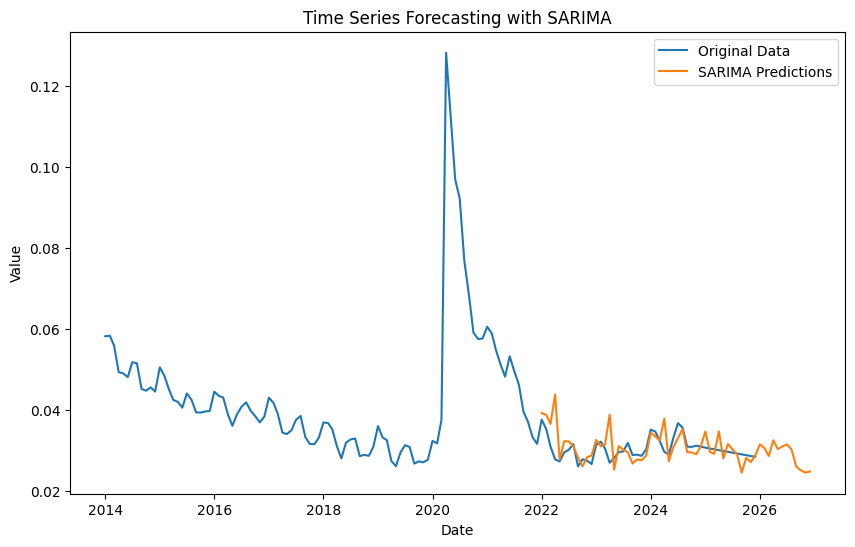

R^2 Score for SARIMA: -1.14
SARIMA - MSE: 1.3949481628021275e-05, RMSE: 0.003734900484353134, MAPE: 7.97%


In [260]:
model_sarima(data_filtered,'United States of America', '25+', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-848.525, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-877.853, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-850.526, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-898.974, Time=0.54 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-901.308, Time=0.08 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-926.239, Time=0.34 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-920.100, Time=0.53 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-932.149, Time=1.18 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-936.754, Time=0.15 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-927.799, Time=0.15 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-932.104, Time=0.19 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-930.031, Time=0.79 sec
 ARIMA(2,2,2)(0,0,0)[0]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


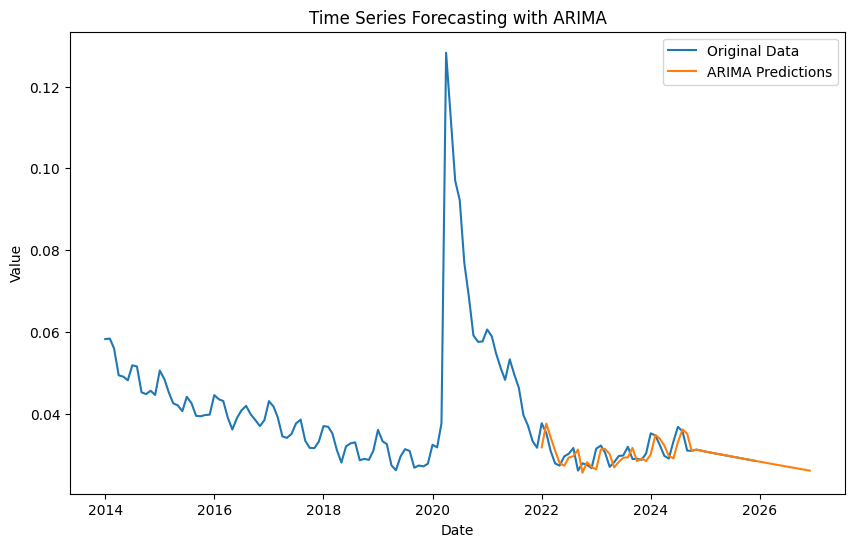

R^2 Score for ARIMA: 0.21
ARIMA - MSE: 5.1458546981771145e-06, RMSE: 0.0022684476406073634, MAPE: 4.89%


In [261]:
model_arima(data_filtered,'United States of America', '25+', 'Total')

# Germany

## 15-24 Male

In [262]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Male')


In [263]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9833
Strong seasonality detected.


(0.983317569599154, True)

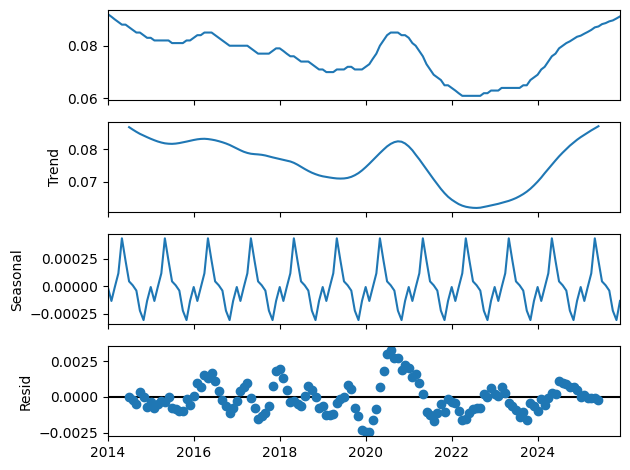

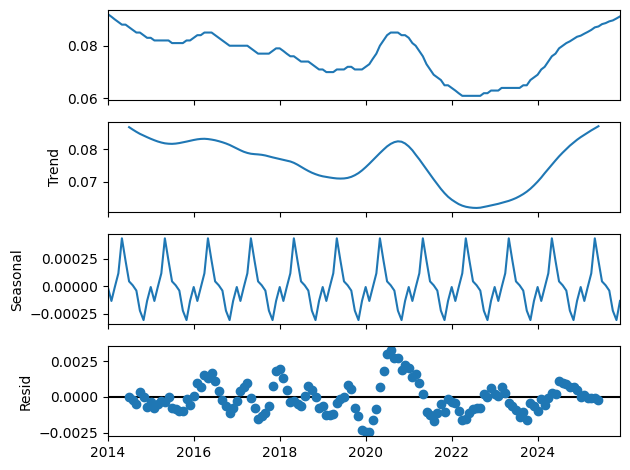

In [264]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1504.711, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1339.614, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1483.692, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1443.019, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1462.658, Time=0.09 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1490.621, Time=0.61 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1490.304, Time=1.38 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1498.553, Time=1.95 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1496.366, Time=0.45 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1505.786, Time=1.52 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1463.920, Time=0.08 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1492.554, Time=3.60 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=2.66 sec
 ARIMA(2,1,1)(1,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


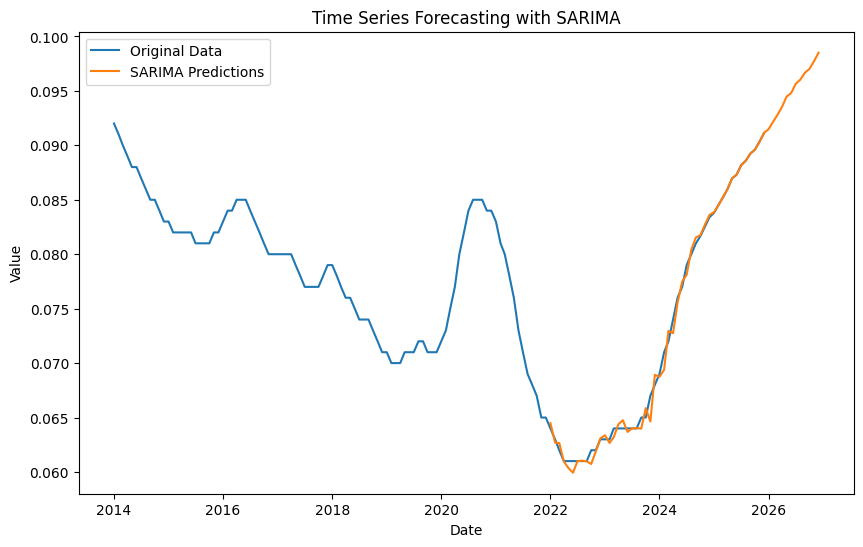

R^2 Score for SARIMA: 1.00
SARIMA - MSE: 4.3313845828052613e-07, RMSE: 0.0006581325537310293, MAPE: 0.63%


In [265]:
model_sarima(data_filtered,'Germany', '15-24', 'Male')


## 15-24 Female

In [266]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Female')


In [267]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9608
Strong seasonality detected.


(0.9608194638550656, True)

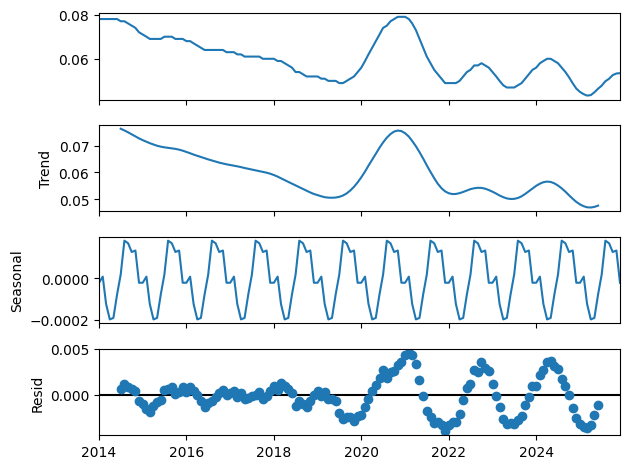

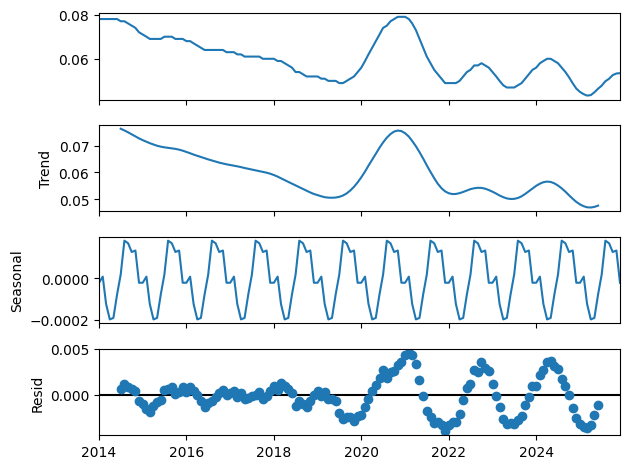

In [268]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1391.199, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1189.274, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1414.321, Time=2.92 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1276.231, Time=1.83 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1394.746, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1416.885, Time=4.27 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1420.139, Time=1.36 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1416.944, Time=0.17 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1418.537, Time=1.50 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1406.546, Time=1.30 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1289.484, Time=1.00 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-1426.557, Time=2.06 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-1422.716, Time=0.52 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1424.043, Time=1.67 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


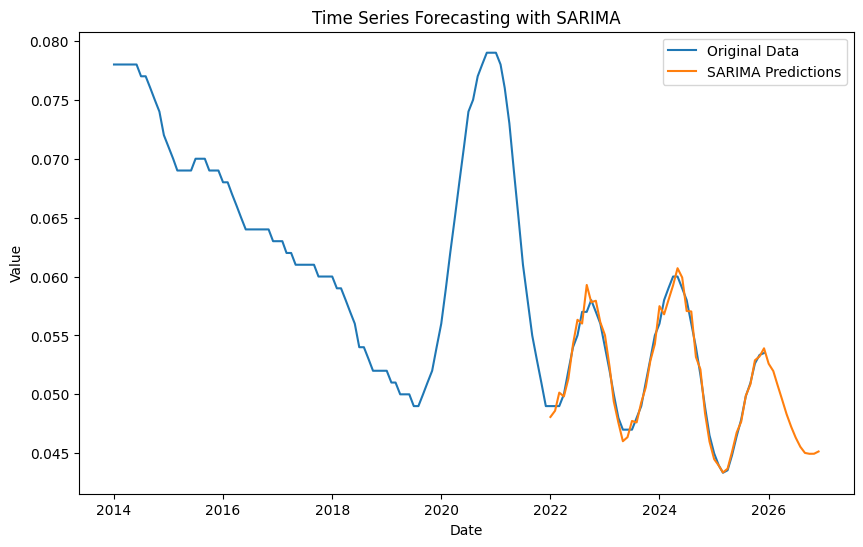

R^2 Score for SARIMA: 0.97
SARIMA - MSE: 5.6437312569489e-07, RMSE: 0.0007512477126054296, MAPE: 1.14%


In [269]:
model_sarima(data_filtered,'Germany', '15-24', 'Female')


## 15-24 Total

In [270]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Total')


In [271]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9763
Strong seasonality detected.


(0.9763081238264079, True)

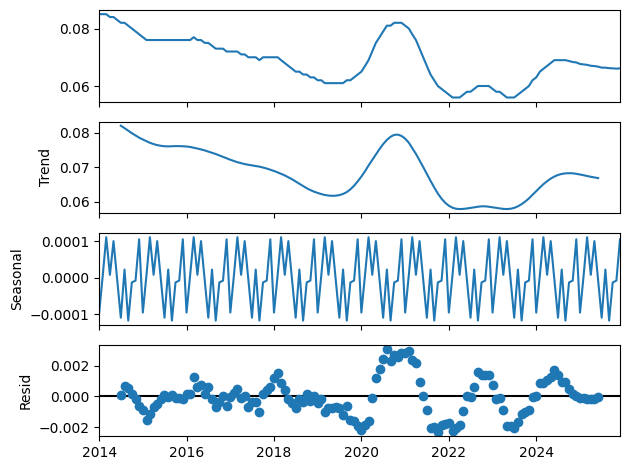

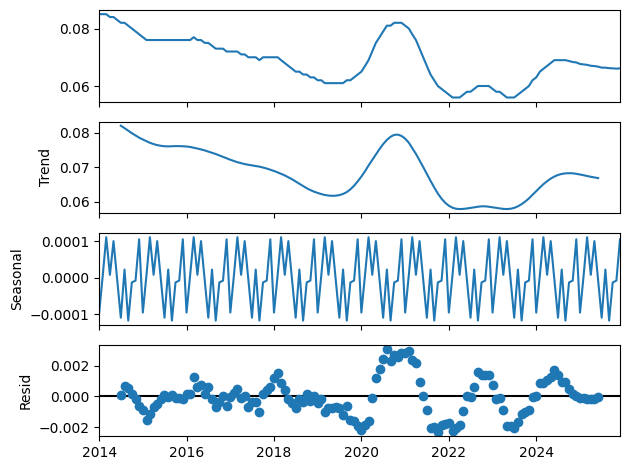

In [272]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1523.514, Time=0.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1287.199, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1477.030, Time=0.82 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1424.393, Time=0.39 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1456.291, Time=0.59 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1492.112, Time=1.08 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1452.283, Time=1.93 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1491.463, Time=0.84 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1483.794, Time=2.15 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1510.113, Time=0.51 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1308.568, Time=1.24 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1545.223, Time=2.70 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1483.813, Time=0.61 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1510.091, Time=2.09 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


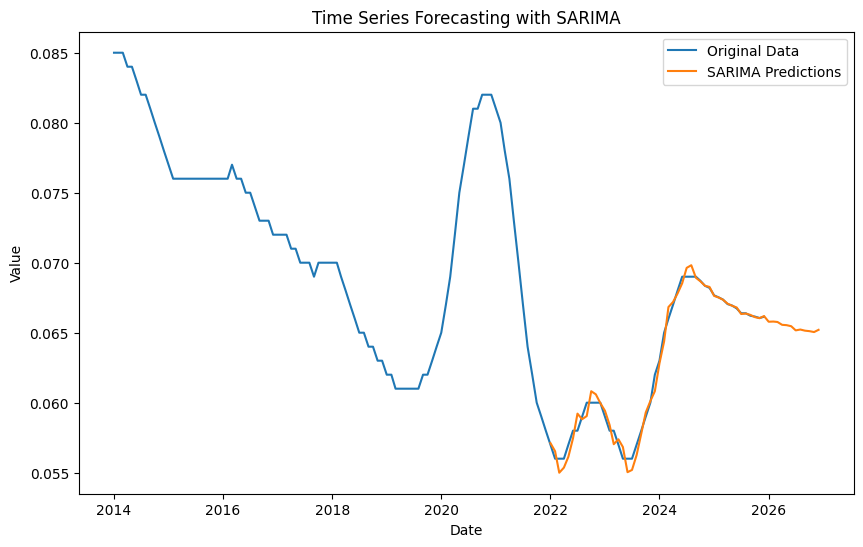

R^2 Score for SARIMA: 0.99
SARIMA - MSE: 3.0256053044080155e-07, RMSE: 0.0005500550249209633, MAPE: 0.68%


In [273]:
model_sarima(data_filtered,'Germany', '15-24', 'Total')


## 25+ Male

In [274]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Male')


In [275]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9901
Strong seasonality detected.


(0.9901111149839108, True)

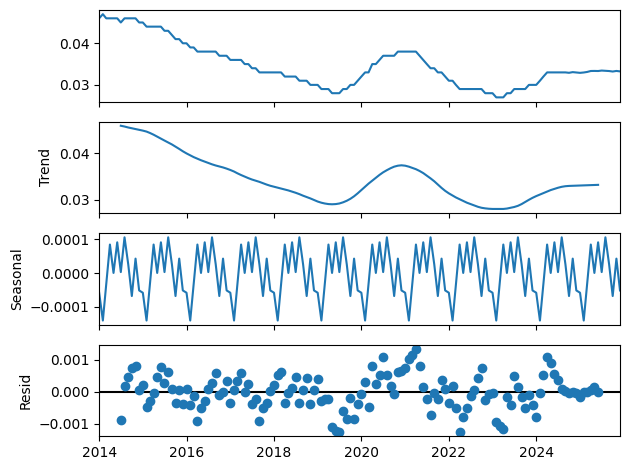

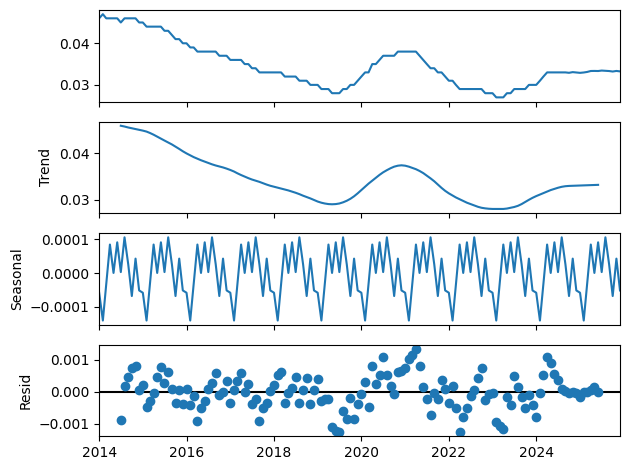

In [276]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1539.706, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1468.931, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1497.019, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1528.319, Time=0.99 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1478.935, Time=0.35 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1524.594, Time=1.64 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1474.935, Time=1.58 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1506.072, Time=0.96 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1501.764, Time=1.39 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1530.152, Time=0.63 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1551.574, Time=1.26 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1489.090, Time=0.56 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1537.877, Time=1.15 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1485.095, Time=0.84 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


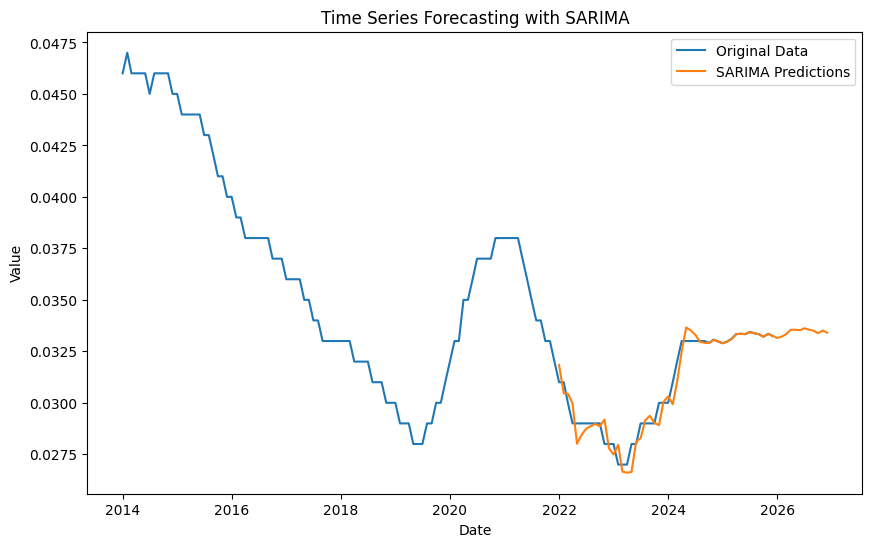

R^2 Score for SARIMA: 0.94
SARIMA - MSE: 2.7988342547605176e-07, RMSE: 0.000529040098174091, MAPE: 1.19%


In [277]:
model_sarima(data_filtered,'Germany', '25+', 'Male')


## 25+ Female

In [278]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Female')


In [279]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9870
Strong seasonality detected.


(0.9870237630205974, True)

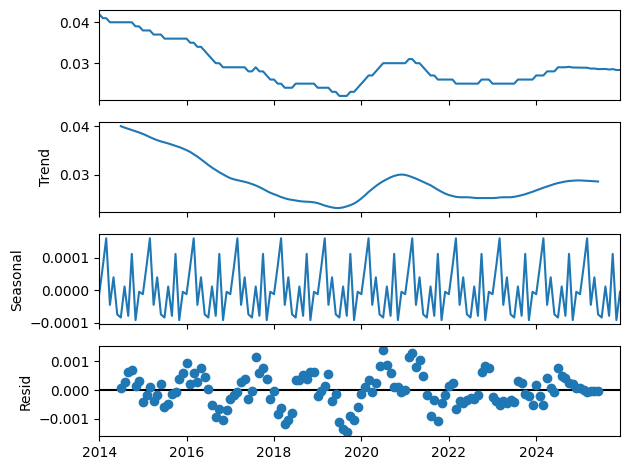

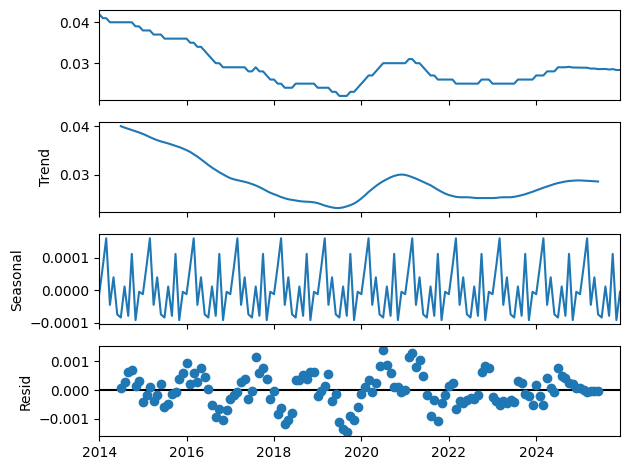

In [280]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1567.774, Time=1.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1484.358, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1534.754, Time=0.97 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1558.088, Time=1.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1493.668, Time=0.22 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1562.476, Time=1.86 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1563.106, Time=0.89 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1539.303, Time=0.58 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1554.694, Time=0.79 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1561.228, Time=0.44 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1571.443, Time=0.77 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1497.573, Time=0.40 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1564.616, Time=1.56 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1566.730, Time=0.76 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


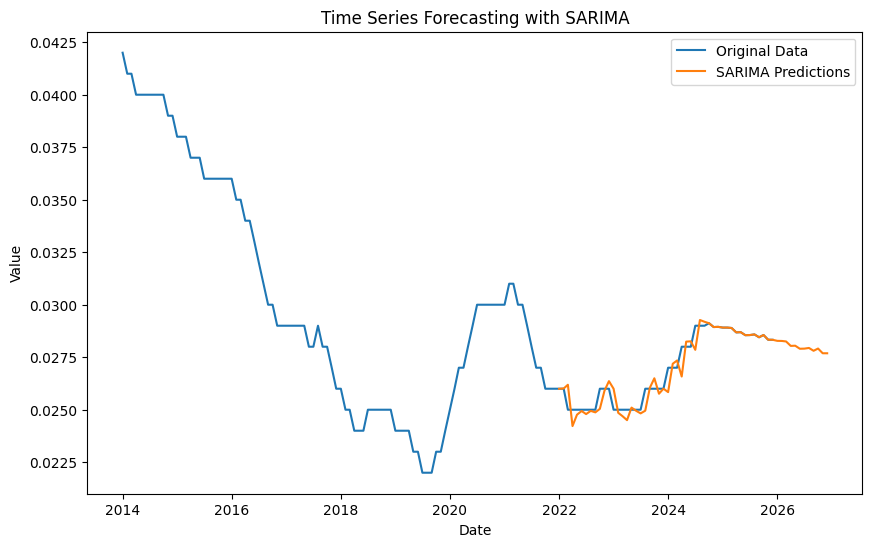

R^2 Score for SARIMA: 0.91
SARIMA - MSE: 2.306557086315799e-07, RMSE: 0.00048026628929332516, MAPE: 1.06%


In [281]:
model_sarima(data_filtered,'Germany', '25+', 'Female')


## 25+ Total

In [282]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Total')

In [283]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9905
Strong seasonality detected.


(0.9905243064054475, True)

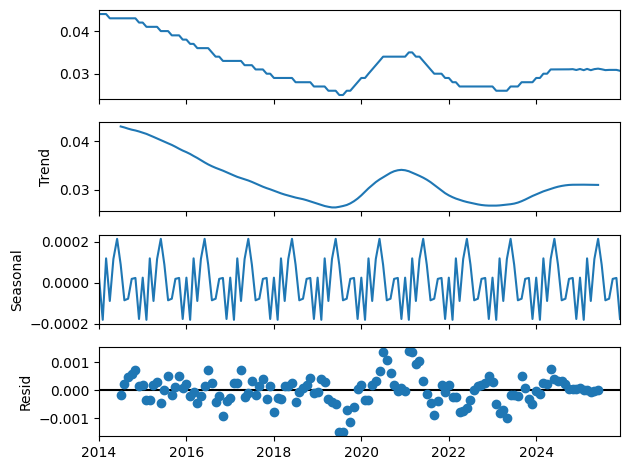

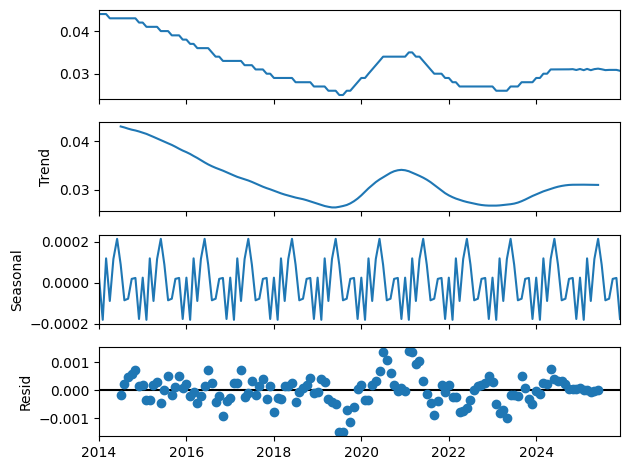

In [284]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1578.971, Time=2.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1499.173, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1531.572, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1568.029, Time=1.18 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1506.026, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1502.726, Time=1.37 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1569.610, Time=3.81 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1458.287, Time=1.64 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1516.498, Time=4.75 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1571.860, Time=0.56 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1556.933, Time=1.06 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1585.035, Time=0.21 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1516.406, Time=0.77 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1574.657, Time=1.03 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


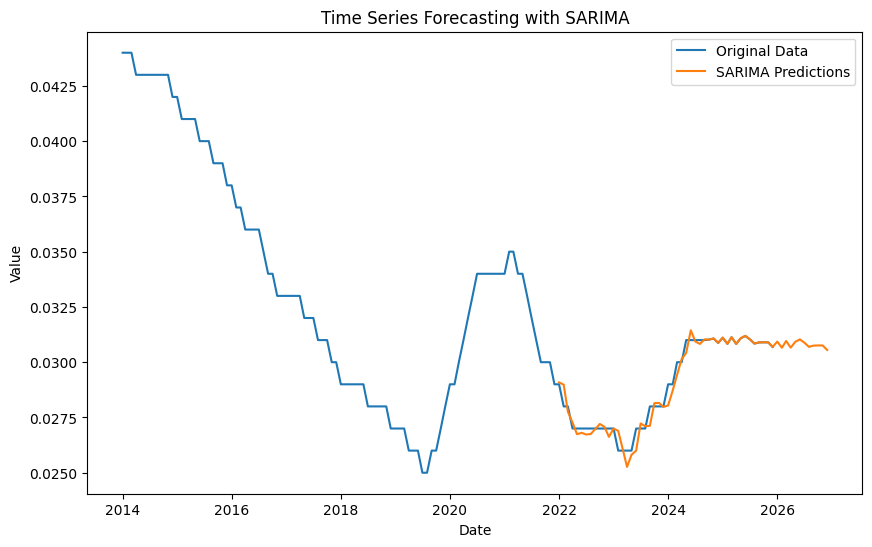

R^2 Score for SARIMA: 0.96
SARIMA - MSE: 1.4000397165987288e-07, RMSE: 0.000374171045993504, MAPE: 0.82%


In [285]:
model_sarima(data_filtered,'Germany', '25+', 'Total')


# Ireland

## 15-24 Male

In [286]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Male')


In [287]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9310
Strong seasonality detected.


(0.9310397806057337, True)

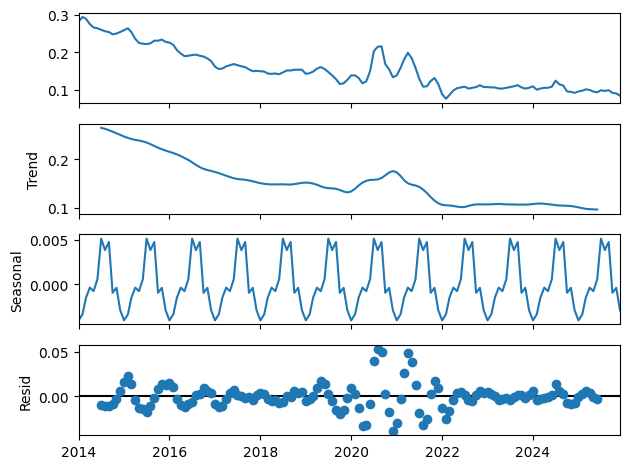

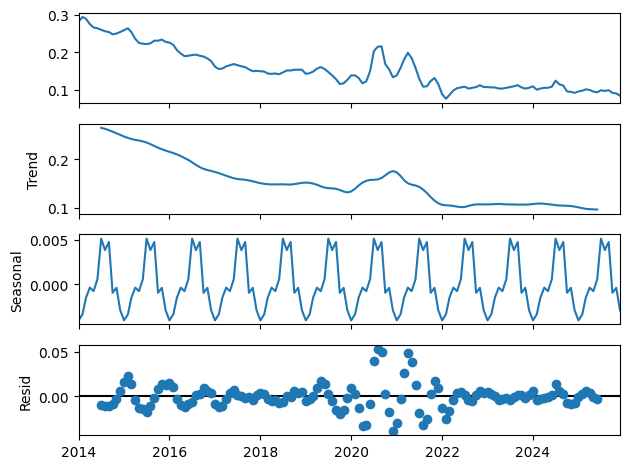

In [288]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-696.796, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-787.530, Time=1.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-743.647, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-799.458, Time=1.00 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-817.240, Time=2.20 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-822.516, Time=1.72 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-820.114, Time=1.67 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-823.373, Time=1.63 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-787.426, Time=0.61 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-842.363, Time=3.02 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(2,1,0)(1,1,2)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


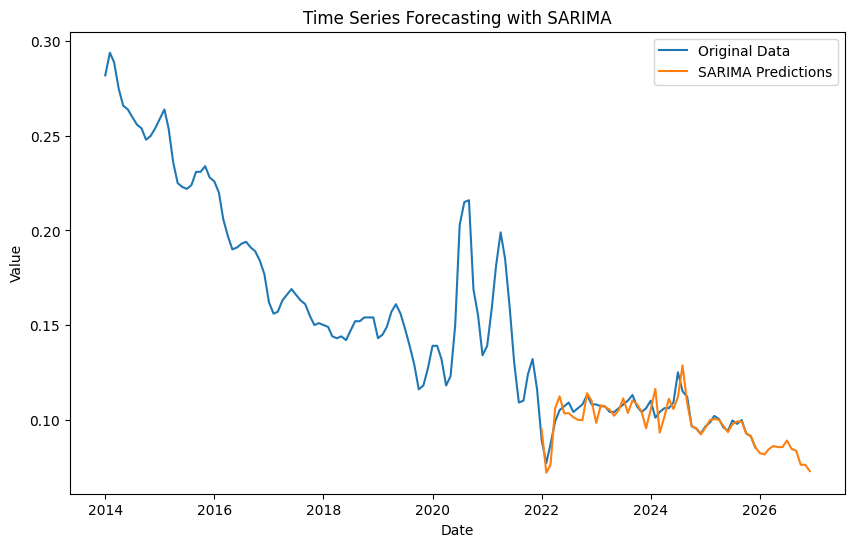

R^2 Score for SARIMA: 0.56
SARIMA - MSE: 3.203330161778002e-05, RMSE: 0.005659796959059576, MAPE: 3.78%


In [289]:
model_sarima(data_filtered,'Ireland', '15-24', 'Male')


## 15-24 Female

In [290]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Female')

In [291]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.8760
Strong seasonality detected.


(0.8760139868786446, True)

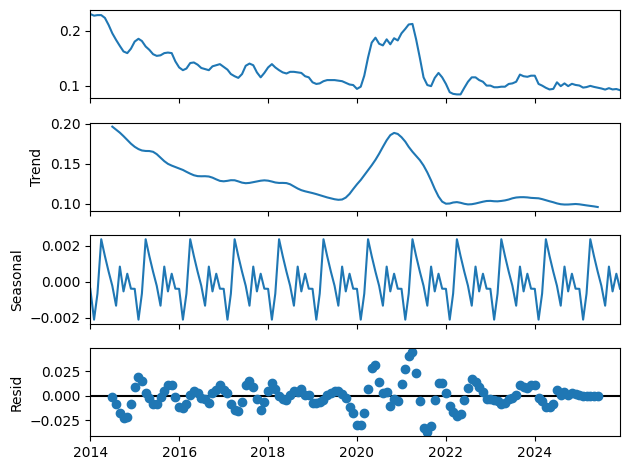

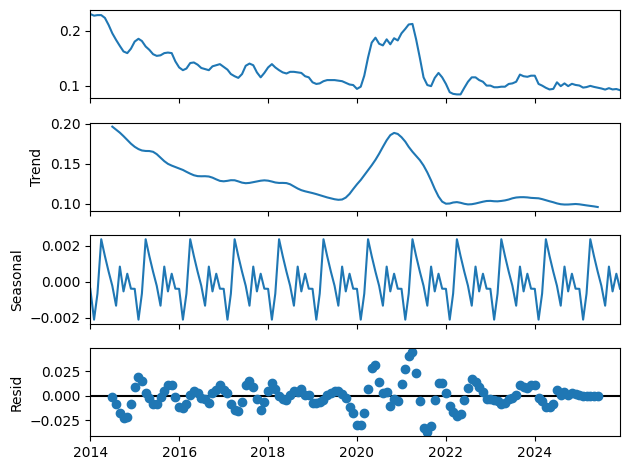

In [292]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-877.129, Time=0.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-746.045, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-841.390, Time=0.72 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-863.555, Time=1.60 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-814.694, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-870.125, Time=2.44 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=2.12 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-845.020, Time=0.65 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.28 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-874.901, Time=0.56 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-855.693, Time=1.38 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-891.281, Time=1.66 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-828.505, Time=1.77 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-887.458, Time=2.13 sec
 ARIMA(1,1,2)(0,1,2)[12]     

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


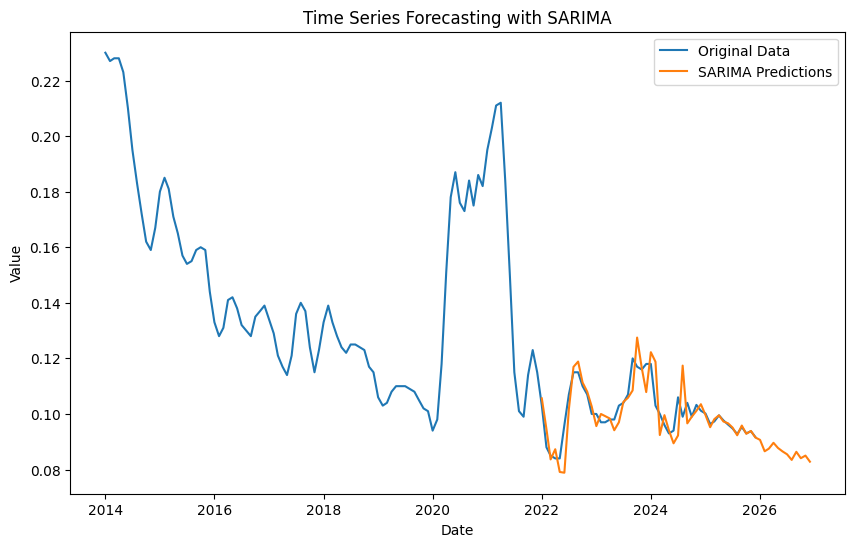

R^2 Score for SARIMA: 0.51
SARIMA - MSE: 3.798383789774546e-05, RMSE: 0.006163102943951647, MAPE: 3.91%


In [293]:
model_sarima(data_filtered,'Ireland', '15-24', 'Female')

## 15-24 Total

In [294]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Total')


In [295]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9361
Strong seasonality detected.


(0.9360686738550277, True)

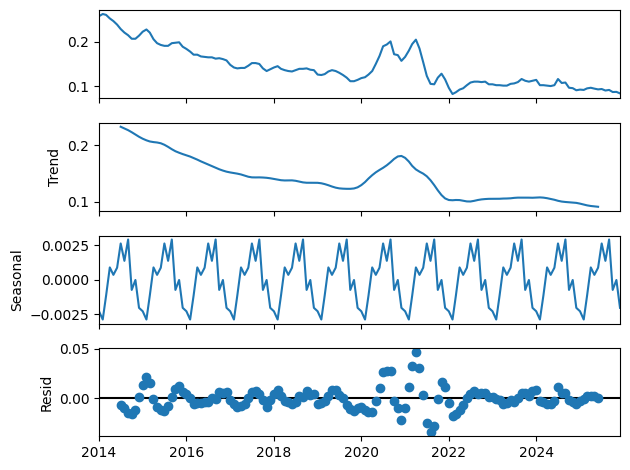

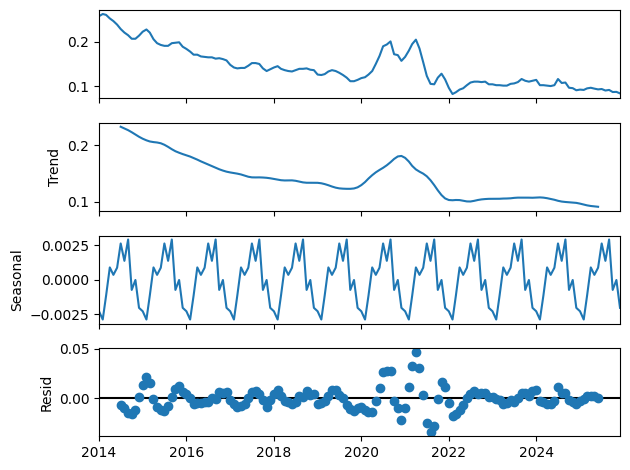

In [296]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-763.148, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-859.646, Time=0.68 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-813.890, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-875.675, Time=1.18 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-875.925, Time=1.32 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-887.913, Time=2.23 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.42 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-892.704, Time=0.91 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-854.185, Time=0.97 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-894.287, Time=2.98 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=i

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


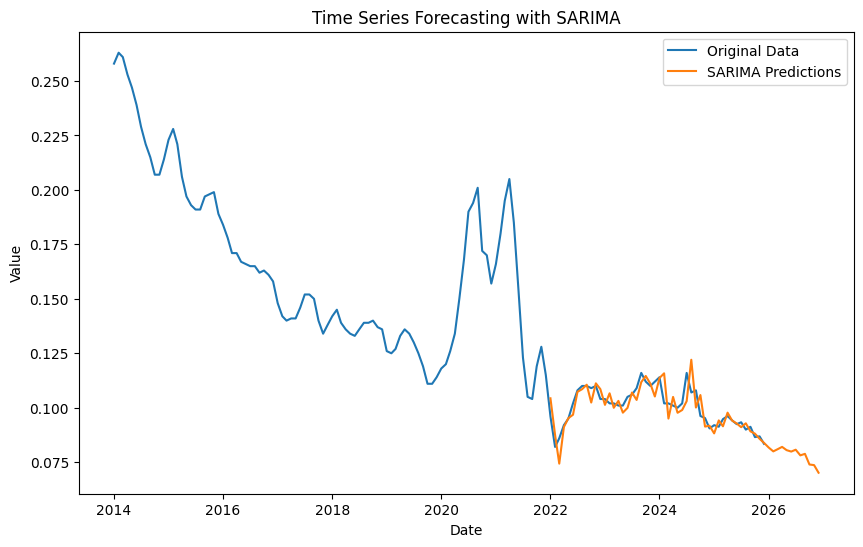

R^2 Score for SARIMA: 0.62
SARIMA - MSE: 2.9227257902948712e-05, RMSE: 0.005406223996741969, MAPE: 3.95%


In [297]:
model_sarima(data_filtered,'Ireland', '15-24', 'Total')

## 25+ Male

In [298]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Male')

In [299]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9911
Strong seasonality detected.


(0.9911074408456734, True)

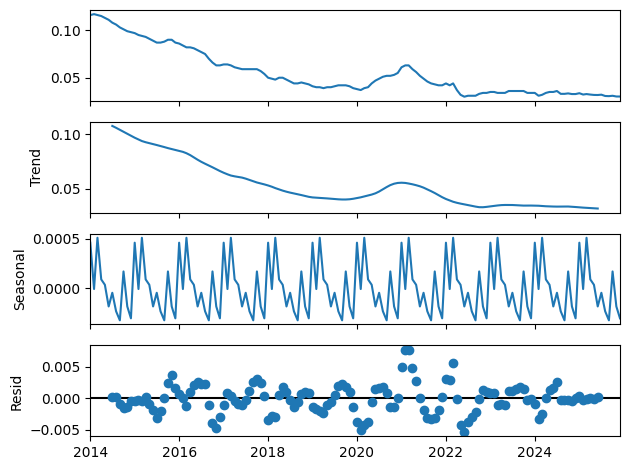

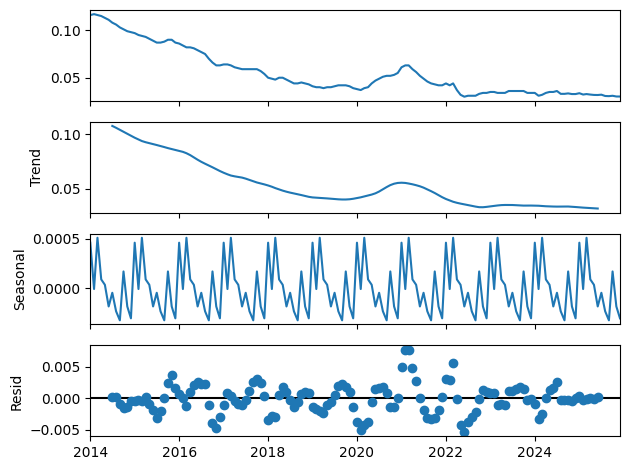

In [300]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1286.198, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1185.521, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1270.742, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1263.499, Time=0.19 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1235.510, Time=0.67 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1279.162, Time=0.71 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1231.509, Time=1.12 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1269.564, Time=0.64 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1288.057, Time=1.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1236.845, Time=0.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1280.743, Time=0.11 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1232.845, Time=1.46 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


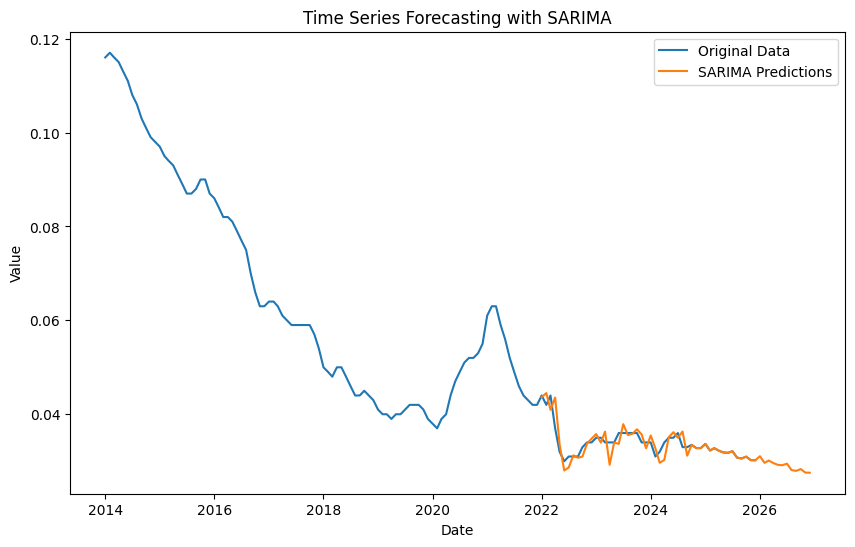

R^2 Score for SARIMA: 0.64
SARIMA - MSE: 3.3532066002236215e-06, RMSE: 0.0018311762886799353, MAPE: 3.38%


In [301]:

model_sarima(data_filtered,'Ireland', '25+', 'Male')

## 25+ Female

In [302]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Female')

In [303]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9696
Strong seasonality detected.


(0.9696025021074133, True)

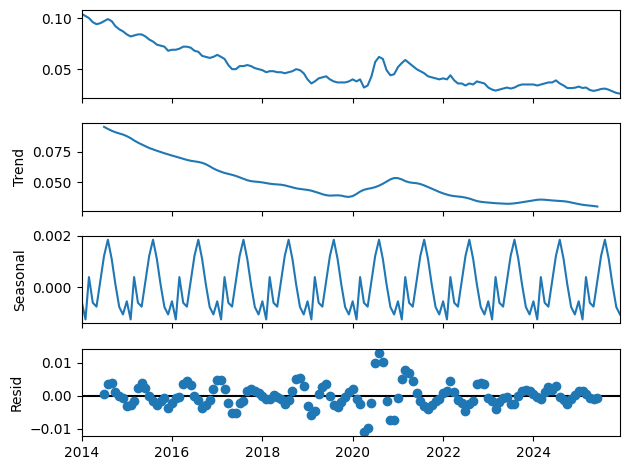

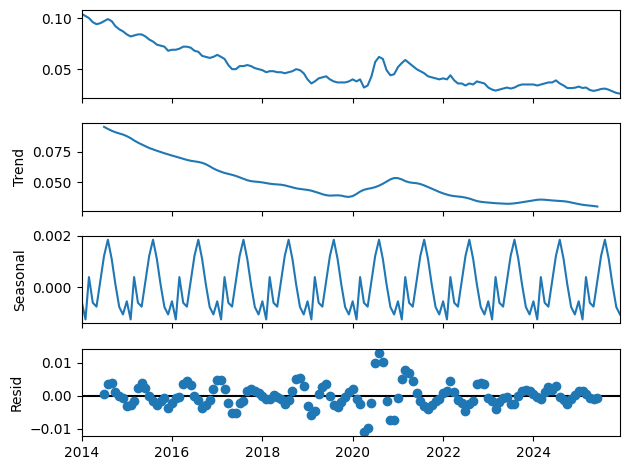

In [304]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1155.856, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1062.838, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1113.312, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1158.331, Time=0.95 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1091.415, Time=0.37 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1143.994, Time=2.12 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1161.982, Time=2.53 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1107.043, Time=0.54 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1058.840, Time=0.91 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1085.061, Time=0.65 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1104.669, Time=1.35 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1089.819, Time=0.65 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-1088.699, Time=1.50 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-1131.302, Time=1.51 sec

Best

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


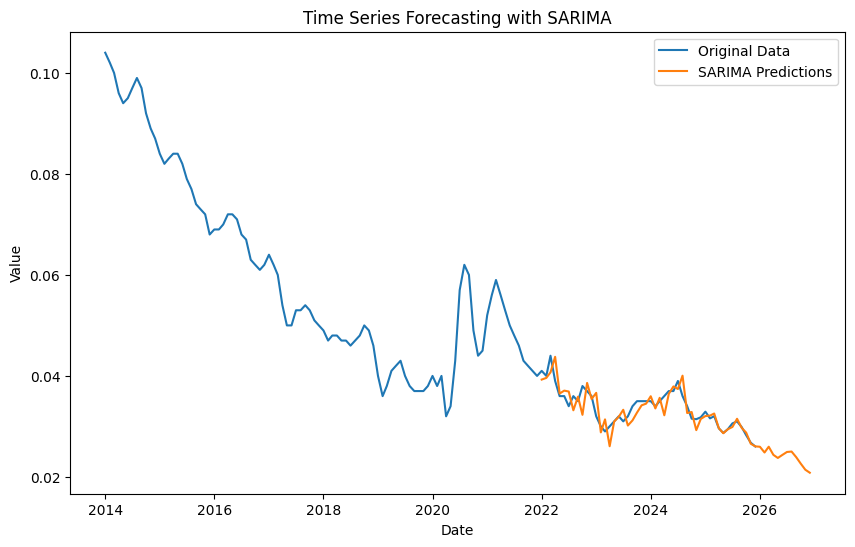

R^2 Score for SARIMA: 0.69
SARIMA - MSE: 4.261225562202613e-06, RMSE: 0.0020642736161184186, MAPE: 4.30%


In [305]:
model_sarima(data_filtered,'Ireland', '25+', 'Female')

## 25+ Total


In [306]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Total')


In [307]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9884
Strong seasonality detected.


(0.9884242857229713, True)

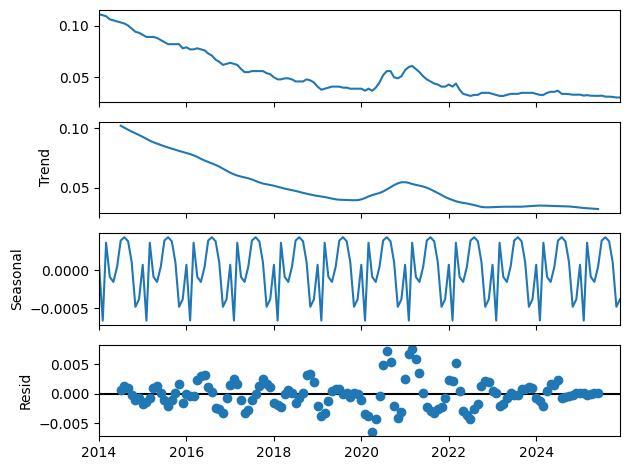

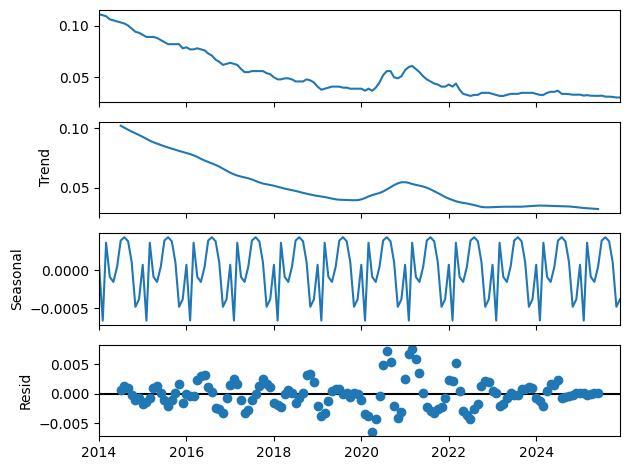

In [308]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1242.930, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1168.120, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1213.644, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1235.829, Time=0.20 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1193.703, Time=0.32 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1232.925, Time=1.17 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1189.704, Time=0.78 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1212.070, Time=0.84 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1208.091, Time=0.43 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1244.632, Time=0.82 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1195.429, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1234.581, Time=0.53 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1191.429, Time=0.13 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1238.722, Time=1.93 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


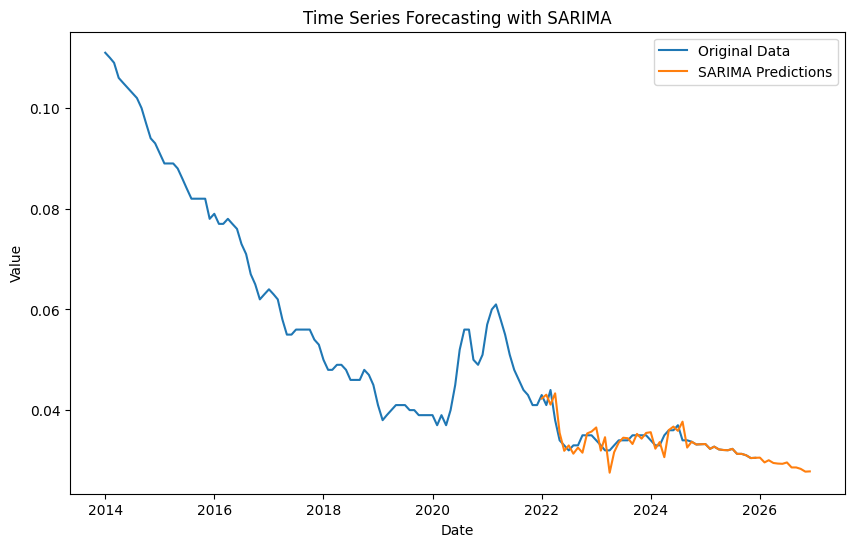

R^2 Score for SARIMA: 0.60
SARIMA - MSE: 2.956535076824345e-06, RMSE: 0.001719457785705815, MAPE: 3.10%


In [309]:
model_sarima(data_filtered,'Ireland', '25+', 'Total')


# Netherlands

## 15-24 Male

In [310]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Male')


In [311]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9639
Strong seasonality detected.


(0.963902348970513, True)

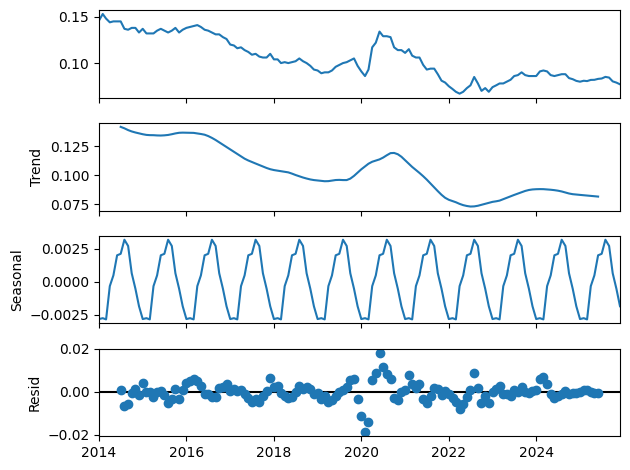

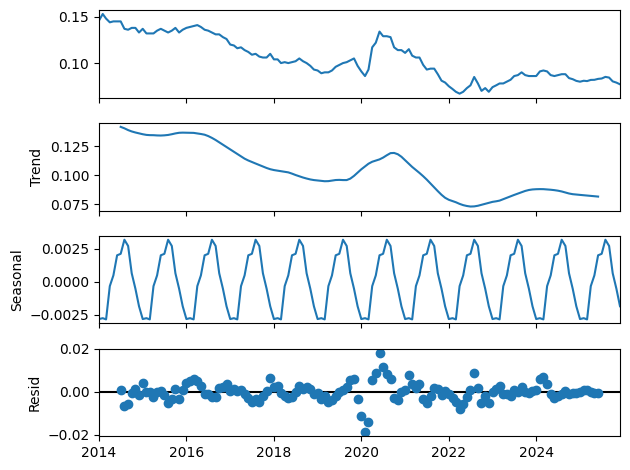

In [312]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1036.581, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-976.914, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1010.400, Time=0.71 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1037.357, Time=0.71 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-979.097, Time=0.63 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1026.735, Time=0.76 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1038.089, Time=1.44 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1035.872, Time=1.40 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1037.105, Time=0.70 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1036.976, Time=2.55 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1038.239, Time=1.82 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1038.534, Time=0.40 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-983.523, Time=0.78 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1028.176, Time=0.97 sec
 ARIMA(0

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


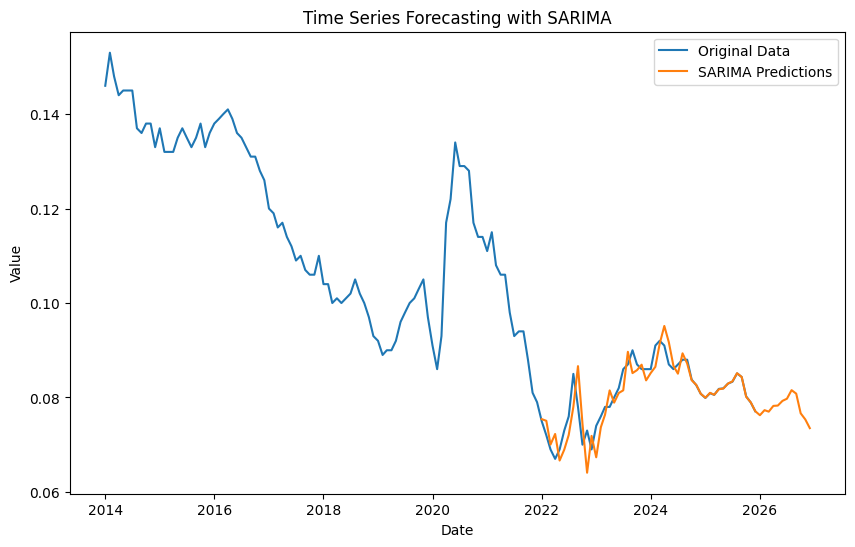

R^2 Score for SARIMA: 0.75
SARIMA - MSE: 1.0419991847668522e-05, RMSE: 0.00322800121556181, MAPE: 2.78%


In [313]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Male')

## 15-24 Female

In [314]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Female')

In [315]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9547
Strong seasonality detected.


(0.9547342827859102, True)

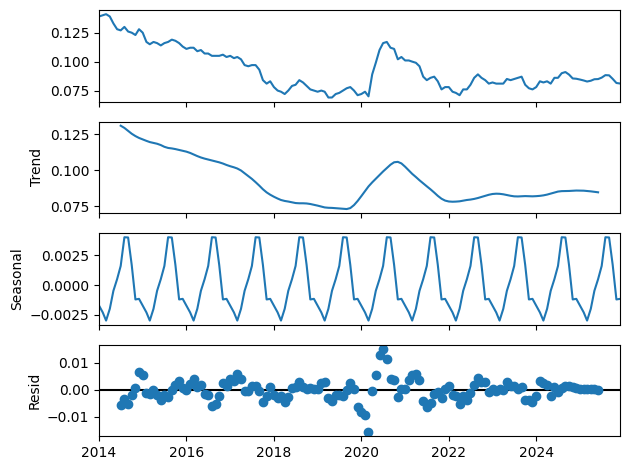

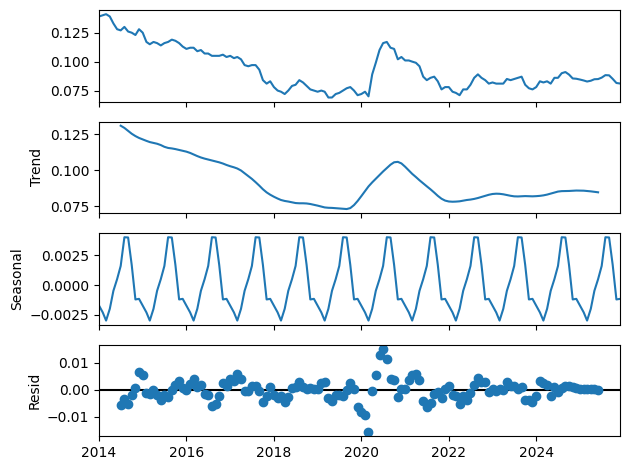

In [316]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1083.300, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1005.292, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1047.180, Time=0.62 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1079.205, Time=0.14 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1016.692, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1070.343, Time=1.82 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=3.11 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1049.679, Time=0.85 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.92 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1082.571, Time=0.65 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1083.575, Time=1.63 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1014.132, Time=0.67 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1076.913, Time=3.09 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1072.869, Time=1.69 sec
 ARIMA(2,1,1)(1,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


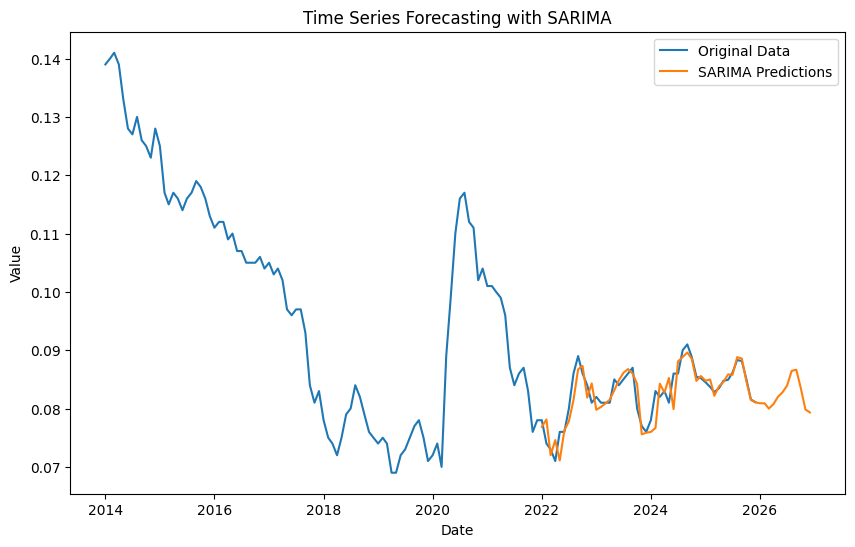

R^2 Score for SARIMA: 0.73
SARIMA - MSE: 5.276523994713557e-06, RMSE: 0.002297068565522927, MAPE: 2.00%


In [317]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Female')

## 15-24 Total

In [318]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Total')

In [319]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9635
Strong seasonality detected.


(0.9635281186495334, True)

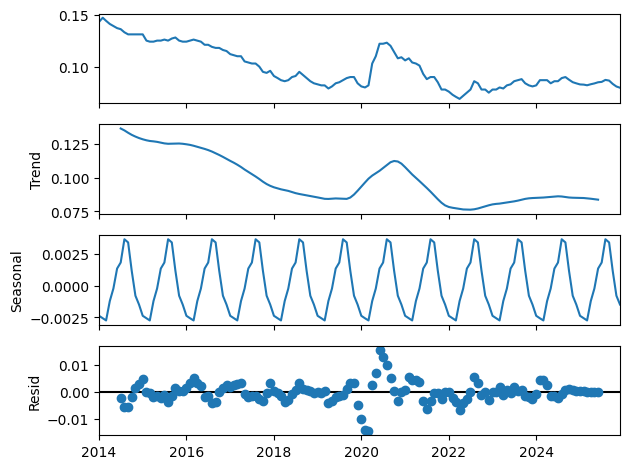

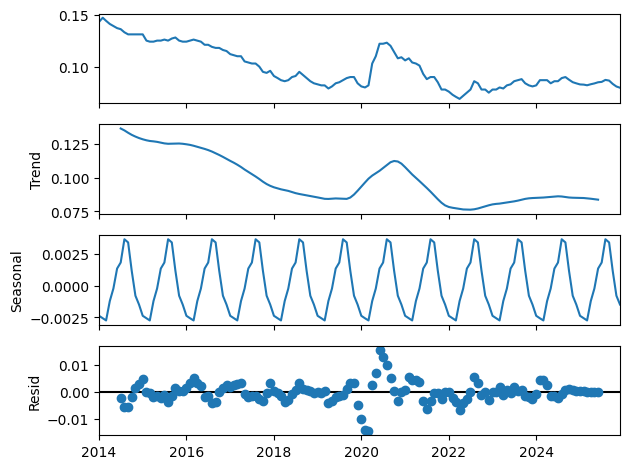

In [320]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1103.050, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1024.829, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1069.458, Time=0.99 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1097.621, Time=0.84 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1038.354, Time=0.08 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1084.667, Time=0.72 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1092.544, Time=0.72 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1068.810, Time=1.08 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1103.981, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1038.864, Time=0.06 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1085.499, Time=0.84 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1086.324, Time=1.68 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


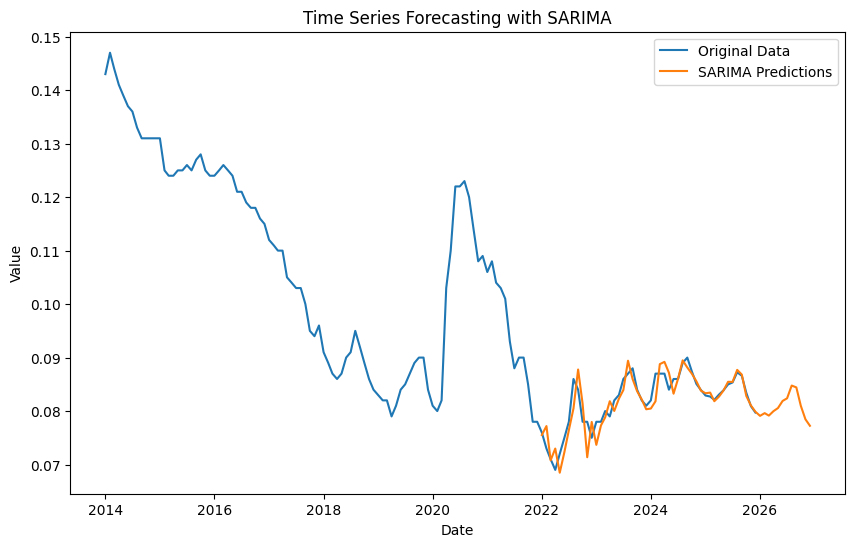

R^2 Score for SARIMA: 0.76
SARIMA - MSE: 5.687610200959461e-06, RMSE: 0.0023848711078294066, MAPE: 2.13%


In [321]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Total')

## 25+ Male

In [322]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Male')

In [323]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9939
Strong seasonality detected.


(0.9938768858380279, True)

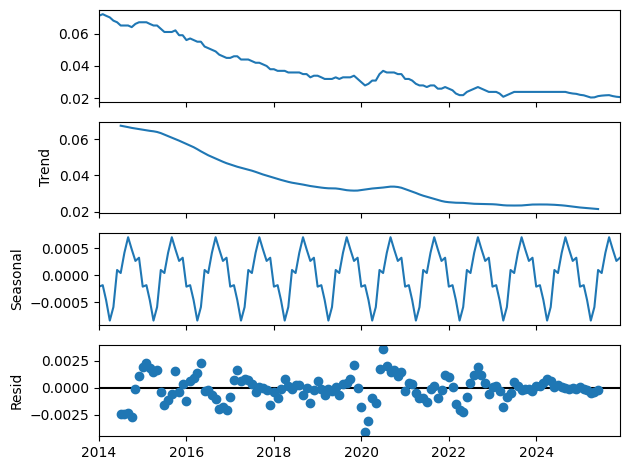

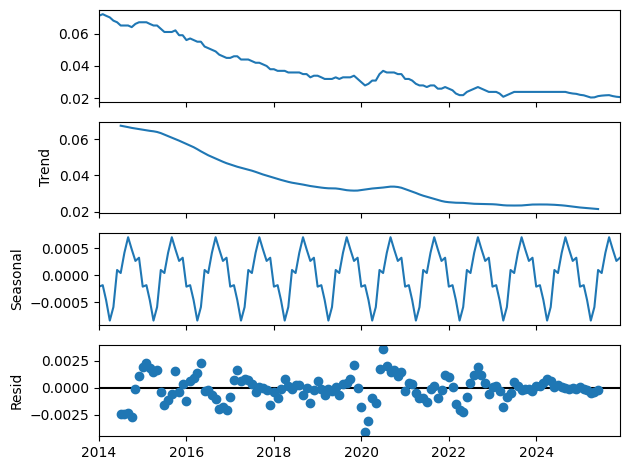

In [324]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1381.647, Time=0.99 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1335.340, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1371.158, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1383.753, Time=0.91 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1333.336, Time=0.55 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1377.730, Time=0.38 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1371.177, Time=0.89 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1379.517, Time=1.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1385.612, Time=0.44 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1379.631, Time=0.18 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1373.118, Time=0.49 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1381.285, Time=1.02 sec
 ARIMA(1,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


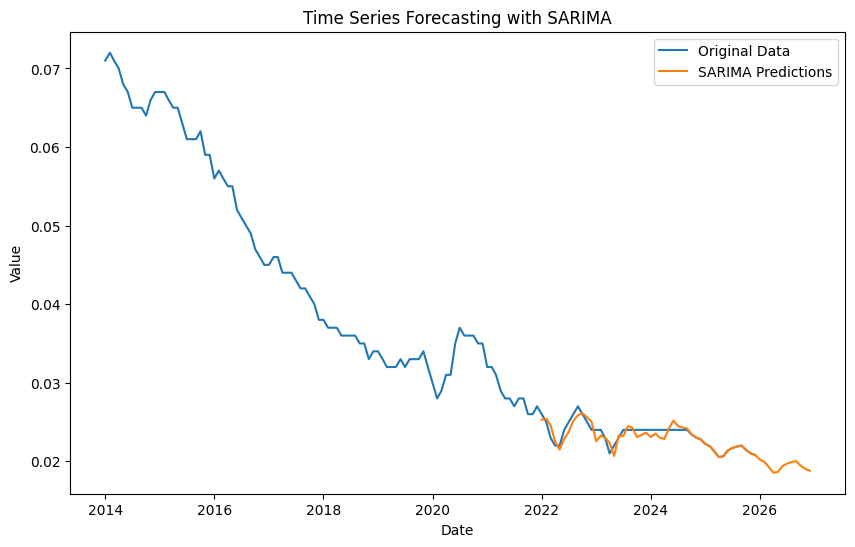

R^2 Score for SARIMA: 0.79
SARIMA - MSE: 4.952162620200144e-07, RMSE: 0.000703716037915873, MAPE: 2.12%


In [325]:
model_sarima(data_filtered,'Netherlands', '25+', 'Male')

## 25+ Female

In [326]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Female')

In [327]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9923
Strong seasonality detected.


(0.9922790468345222, True)

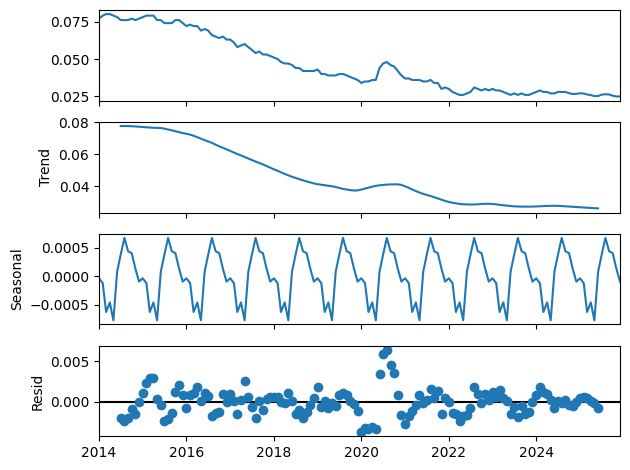

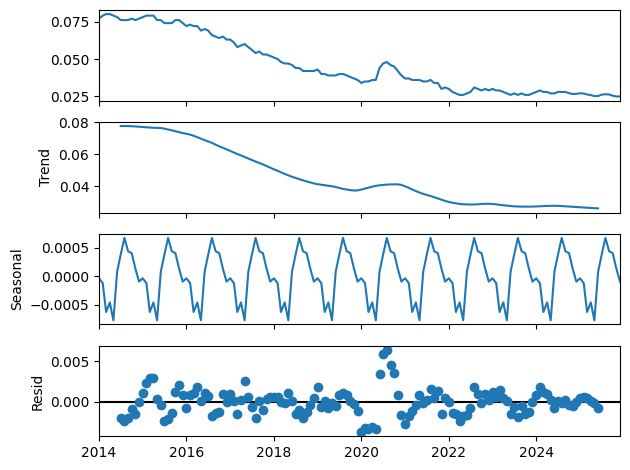

In [328]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1300.129, Time=0.58 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1269.519, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1288.008, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1302.116, Time=0.56 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1267.521, Time=0.44 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1291.994, Time=0.75 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1263.521, Time=1.24 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1288.014, Time=0.31 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1304.149, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1294.024, Time=0.35 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1265.520, Time=1.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1290.035, Time=0.48 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


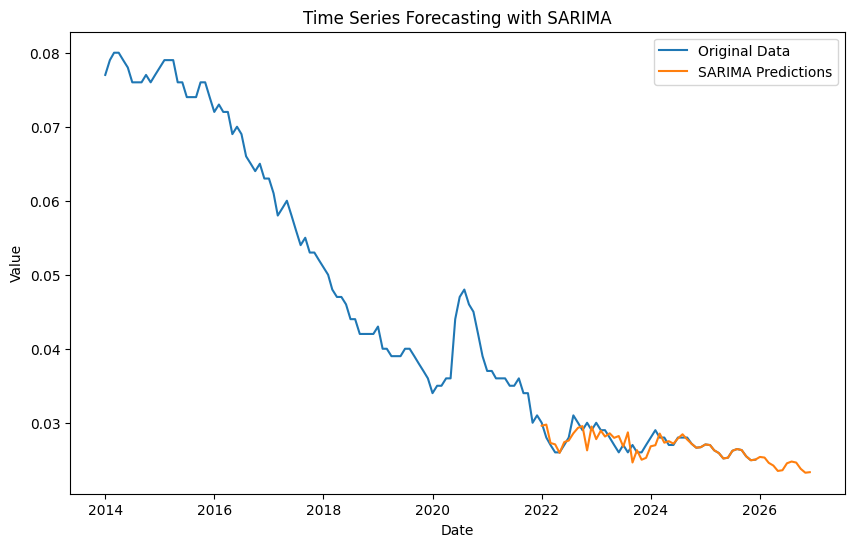

R^2 Score for SARIMA: 0.40
SARIMA - MSE: 1.27790544095607e-06, RMSE: 0.0011304447978367055, MAPE: 2.49%


In [329]:
model_sarima(data_filtered,'Netherlands', '25+', 'Female')

## 25+ Total

In [330]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Total')

In [331]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9941
Strong seasonality detected.


(0.9940813559005315, True)

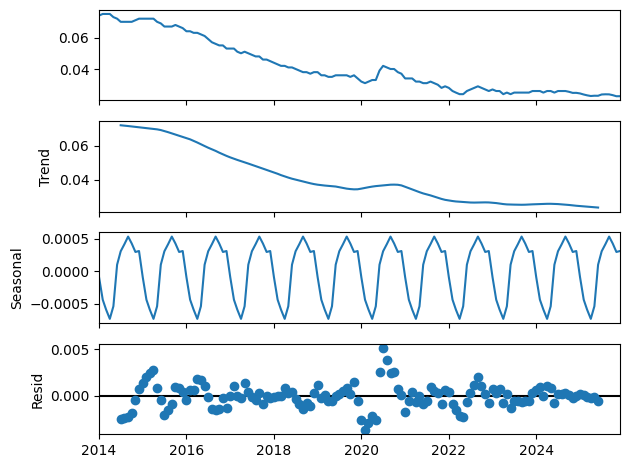

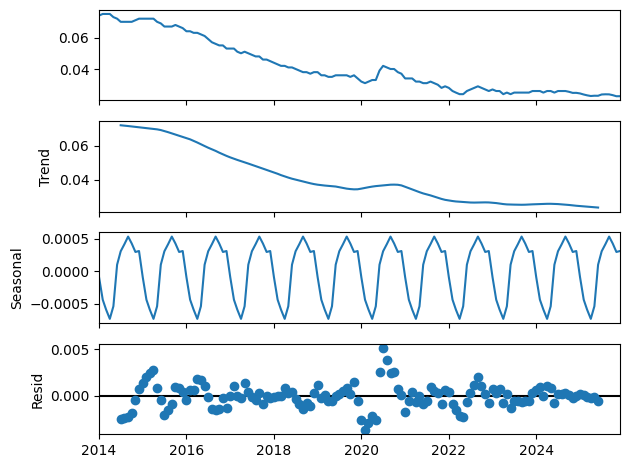

In [332]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1373.004, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1330.794, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1363.530, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1374.845, Time=0.20 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1328.832, Time=0.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1366.380, Time=0.70 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1324.832, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1363.435, Time=0.24 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1369.357, Time=1.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1376.458, Time=0.39 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1368.028, Time=0.38 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1326.798, Time=1.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1365.161, Time=0.44 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1370.880, Time=0.74 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


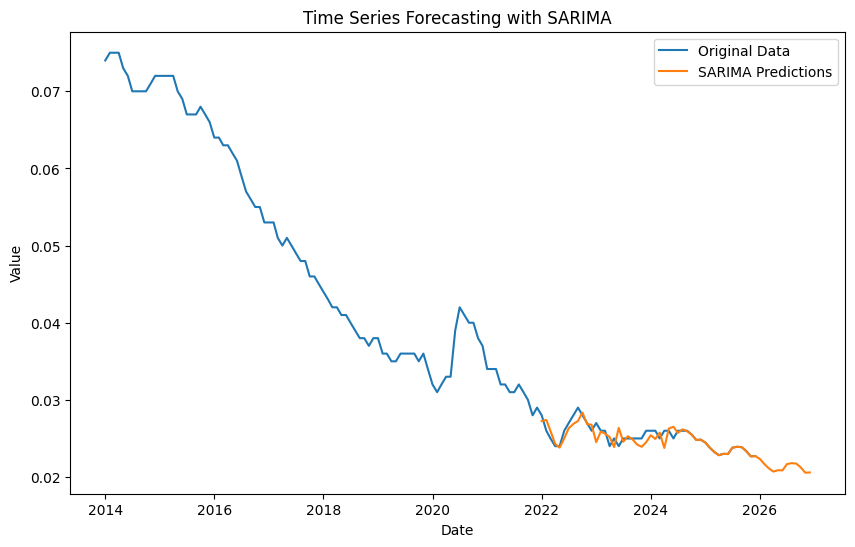

R^2 Score for SARIMA: 0.64
SARIMA - MSE: 8.001147032530506e-07, RMSE: 0.0008944913097694413, MAPE: 2.27%


In [333]:
model_sarima(data_filtered,'Netherlands', '25+', 'Total')


# Chechia

## 15-24 Male

In [334]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Male')

In [335]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9374
Strong seasonality detected.


(0.9373632452542526, True)

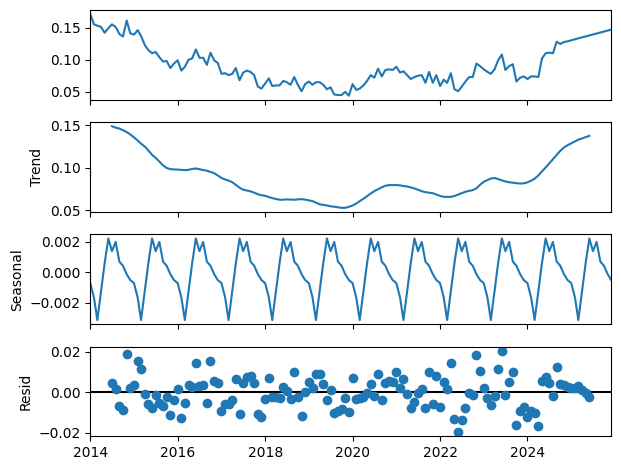

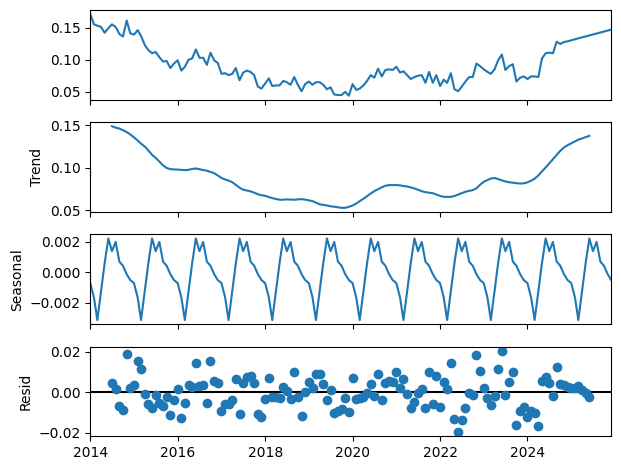

In [336]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-739.037, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-777.489, Time=1.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-810.378, Time=0.90 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-747.584, Time=0.14 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-807.410, Time=2.72 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-808.518, Time=2.35 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-778.015, Time=0.57 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-806.456, Time=2.72 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-808.941, Time=2.10 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-810.164, Time=1.01 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-801.697, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=inf, Time=2.94 sec

Best model:  ARIMA(0,1,1)(0,1,1)[

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


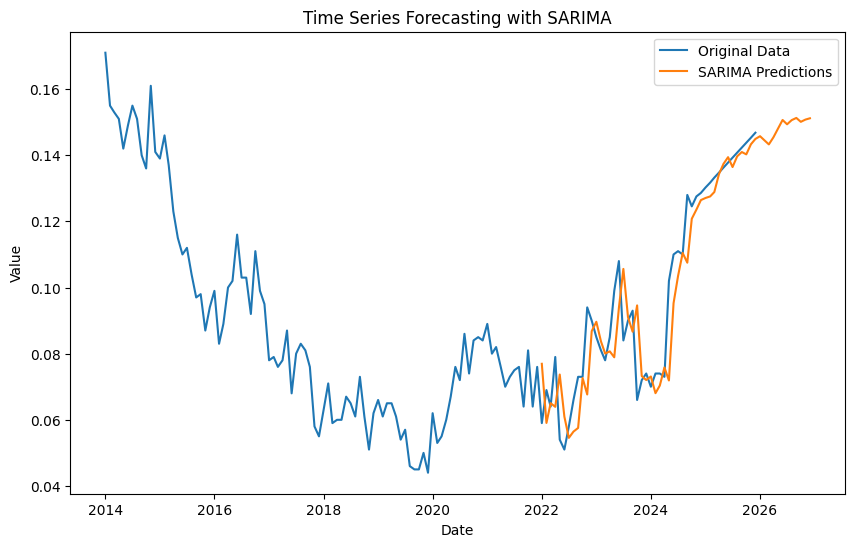

R^2 Score for SARIMA: 0.86
SARIMA - MSE: 0.00012404163490017578, RMSE: 0.011137398030966469, MAPE: 9.20%


In [337]:
model_sarima(data_filtered,'Czechia', '15-24', 'Male')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-903.690, Time=0.43 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-778.688, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-845.885, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-780.678, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-914.261, Time=1.21 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-869.431, Time=0.18 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-904.030, Time=3.79 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-910.047, Time=0.49 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-889.017, Time=0.24 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-907.916, Time=1.29 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-915.403, Time=0.46 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-916.903, Time=0.66 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-906.698, Time=0.16 sec
 ARIMA(1,2,0)(0,0,0)

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


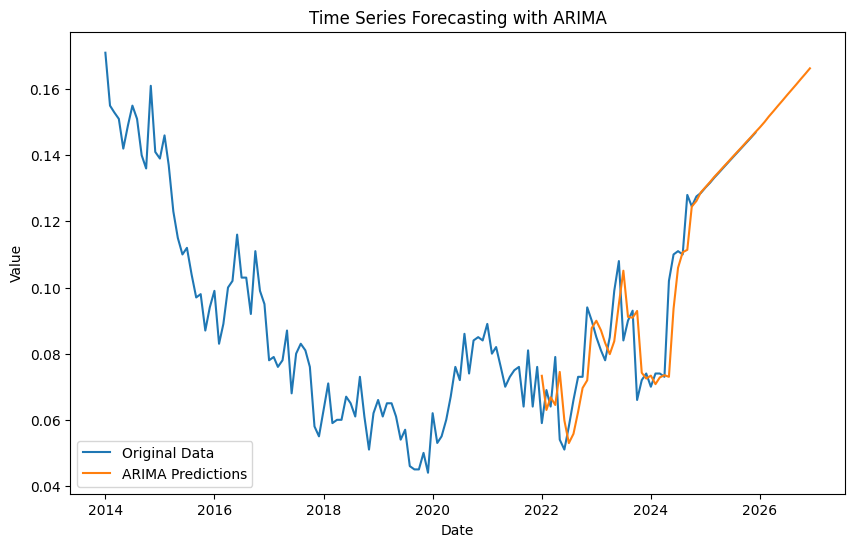

R^2 Score for ARIMA: 0.89
ARIMA - MSE: 0.00010077275166743992, RMSE: 0.010038563227247211, MAPE: 8.00%


In [338]:
model_arima(data_filtered,'Czechia', '15-24', 'Male')

## 15-24 Female

In [339]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Female')

In [340]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8966
Strong seasonality detected.


(0.8966365919835992, True)

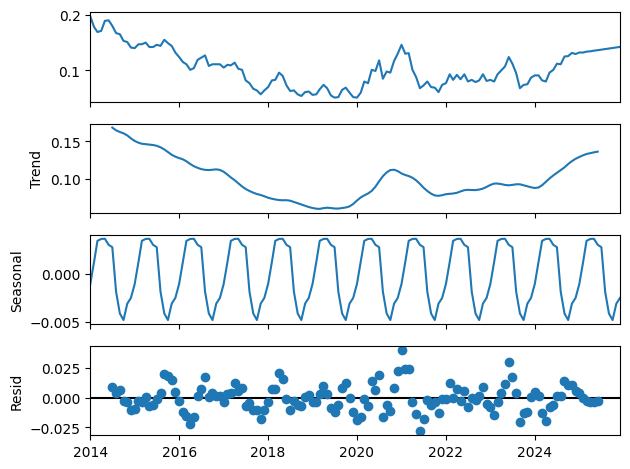

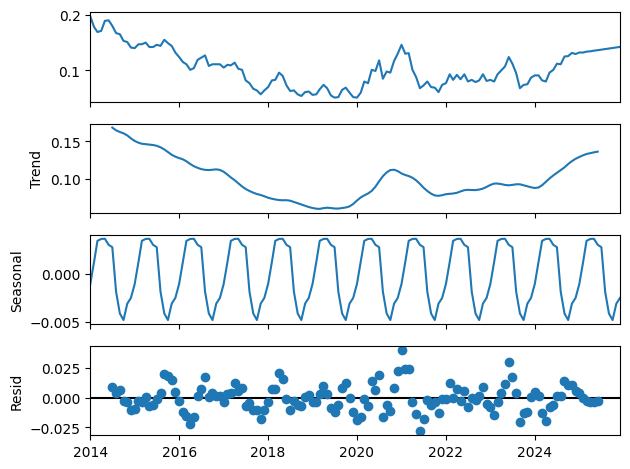

In [341]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-719.400, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-749.758, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-717.578, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-763.117, Time=0.67 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-784.679, Time=1.97 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-784.646, Time=0.85 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.94 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-793.510, Time=2.45 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-792.139, Time=1.06 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-773.389, Time=1.08 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


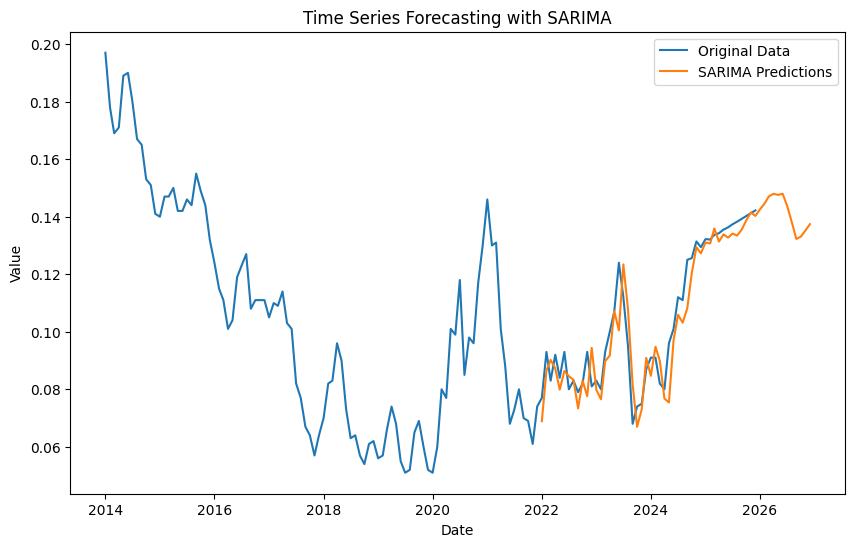

R^2 Score for SARIMA: 0.89
SARIMA - MSE: 6.222152877421578e-05, RMSE: 0.007888062422053706, MAPE: 6.13%


In [342]:
model_sarima(data_filtered,'Czechia', '15-24', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-876.506, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-809.310, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-871.380, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-811.295, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-867.532, Time=1.10 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-878.264, Time=0.58 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-902.898, Time=0.57 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-913.258, Time=0.80 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-907.483, Time=1.14 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-924.534, Time=2.09 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-919.845, Time=0.85 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=-926.086, Time=2.13 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=-927.043, Time=1.18 sec
 ARIMA(1,2,3)(0,0,0)

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


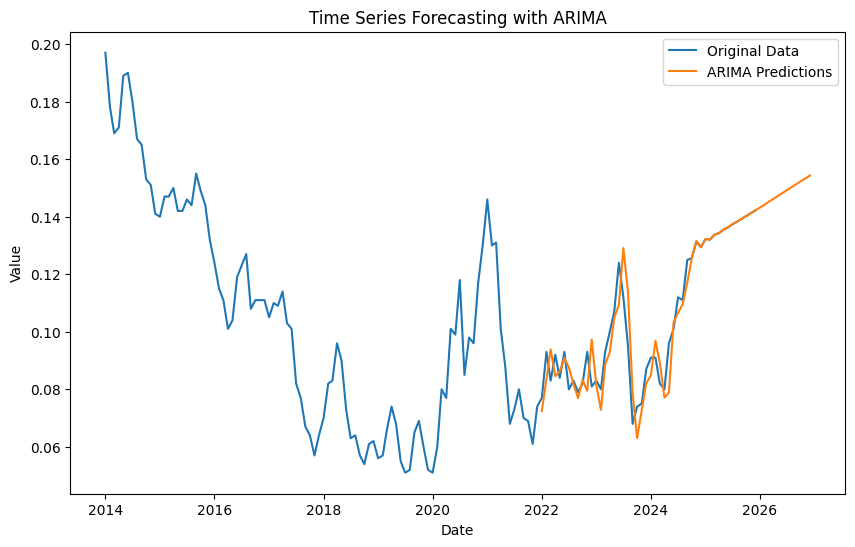

R^2 Score for ARIMA: 0.90
ARIMA - MSE: 5.380856106767973e-05, RMSE: 0.007335431893738755, MAPE: 5.44%


In [343]:
model_arima(data_filtered,'Czechia', '15-24', 'Female')

## 15-24 Total

In [344]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Total')

In [345]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9527
Strong seasonality detected.


(0.9526629949909342, True)

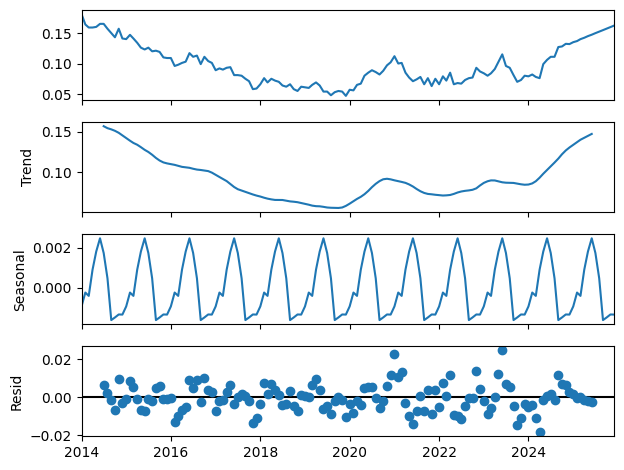

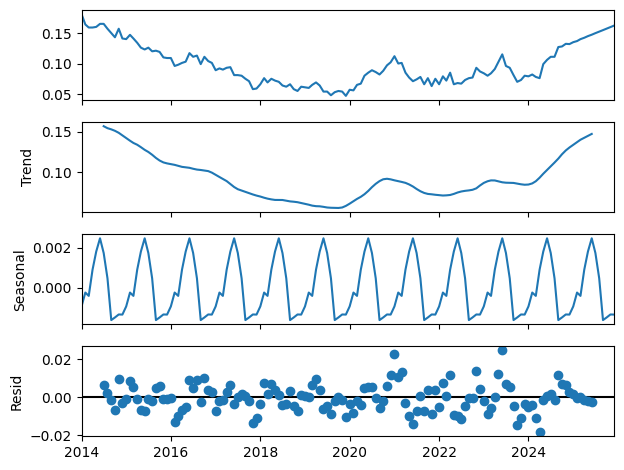

In [346]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=5.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-791.208, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-831.161, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-792.363, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-843.892, Time=0.33 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-856.689, Time=2.81 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-860.370, Time=1.30 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-861.640, Time=1.18 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-860.730, Time=1.88 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-862.527, Time=0.64 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=-796.046, Time=0.43 sec
 ARIMA(2,1,0)(1,1,1)[12]             : 

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


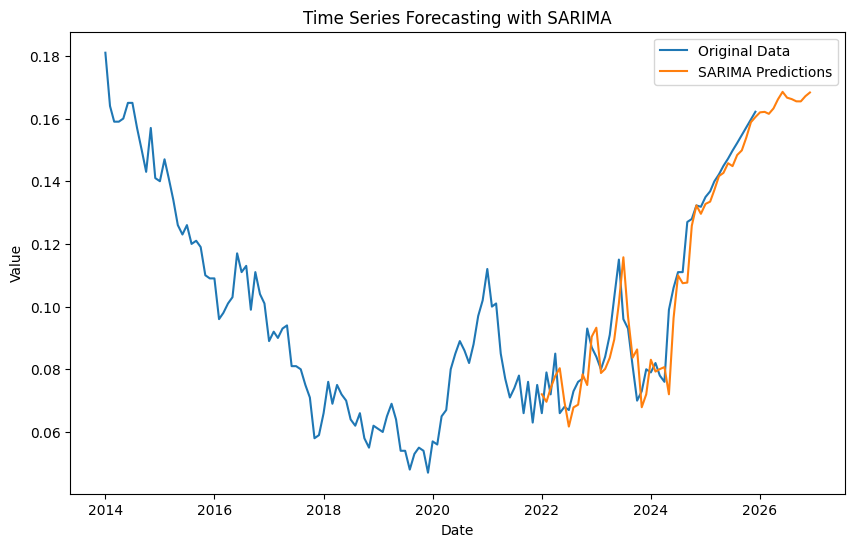

R^2 Score for SARIMA: 0.92
SARIMA - MSE: 7.316093074038702e-05, RMSE: 0.008553416319833088, MAPE: 6.73%


In [347]:
model_sarima(data_filtered,'Czechia', '15-24', 'Total')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-971.075, Time=0.97 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-865.195, Time=0.01 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-940.683, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-867.174, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-977.814, Time=0.73 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-942.259, Time=0.20 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-964.227, Time=0.81 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-975.773, Time=0.16 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-975.473, Time=0.22 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-950.754, Time=0.50 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-965.130, Time=1.17 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-977.527, Time=0.17 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 5.150 seconds
                               SARIMAX Results                        

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-pa

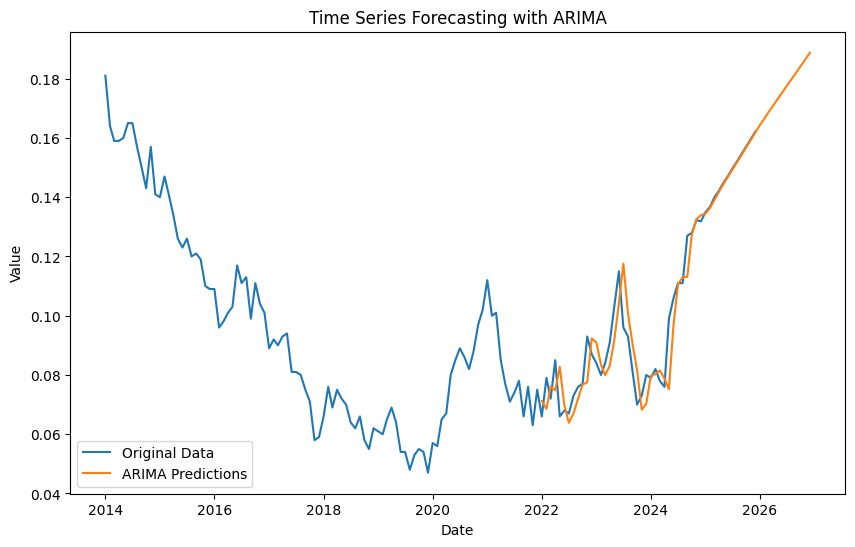

R^2 Score for ARIMA: 0.93
ARIMA - MSE: 6.232730442370322e-05, RMSE: 0.007894764367839183, MAPE: 6.13%


In [348]:
model_arima(data_filtered,'Czechia', '15-24', 'Total')

## 25+ Male

In [349]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Male')

In [350]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9833
Strong seasonality detected.


(0.9833233854428302, True)

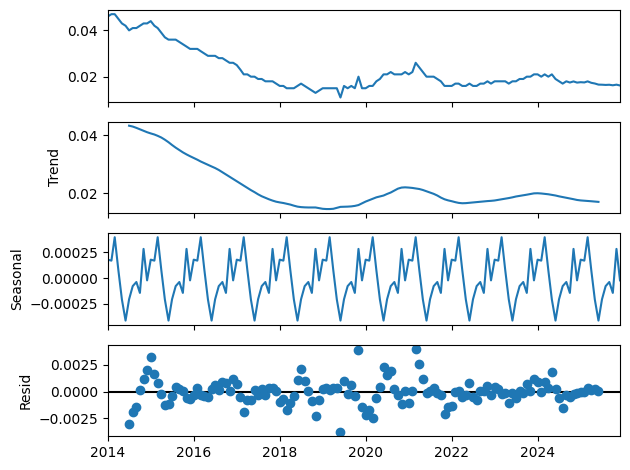

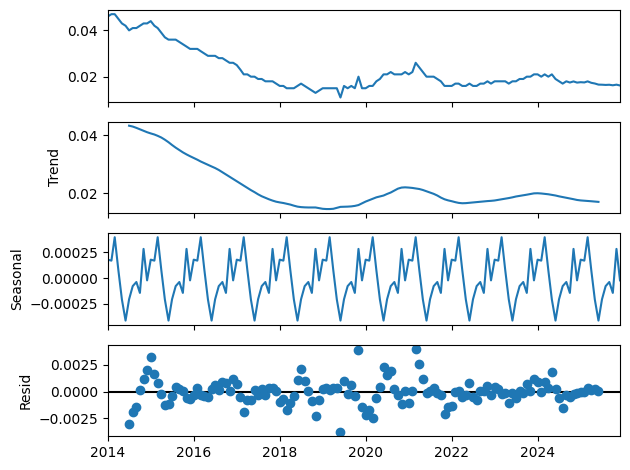

In [351]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1337.589, Time=0.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1263.839, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1315.781, Time=0.45 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1334.782, Time=0.89 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1270.886, Time=0.11 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1328.140, Time=0.94 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1321.695, Time=1.67 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1317.785, Time=0.96 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1318.675, Time=2.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1336.296, Time=0.51 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1242.705, Time=1.32 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1327.329, Time=1.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1335.249, Time=0.35 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1336.210, Time=1.09 sec
 ARIM

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


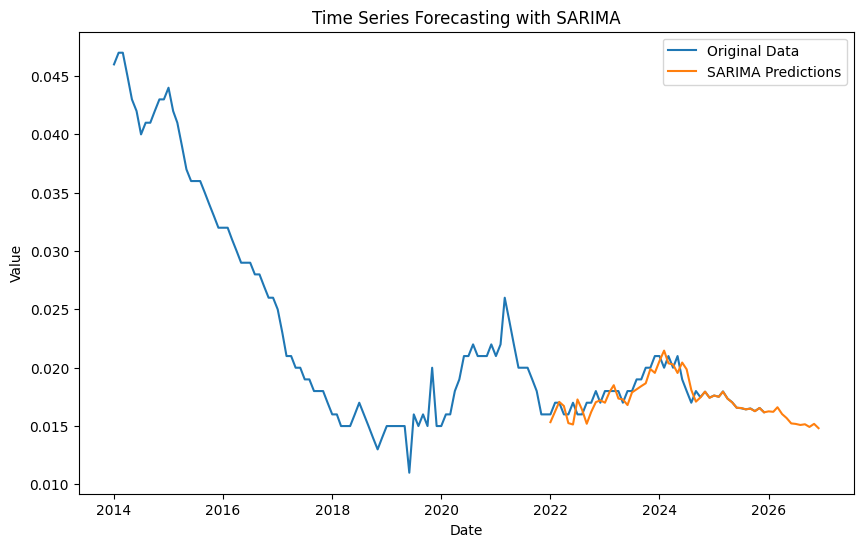

R^2 Score for SARIMA: 0.67
SARIMA - MSE: 6.829198197093134e-07, RMSE: 0.000826389629478319, MAPE: 3.23%


In [352]:
model_sarima(data_filtered,'Czechia', '25+', 'Male')

## 25+ Female

In [353]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Female')

In [354]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9633
Strong seasonality detected.


(0.9632986140778154, True)

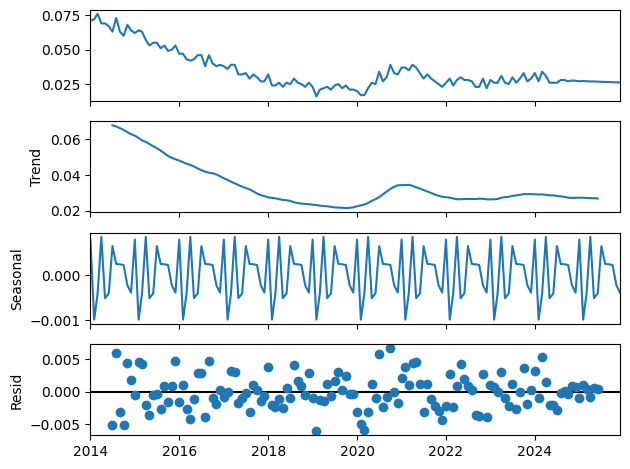

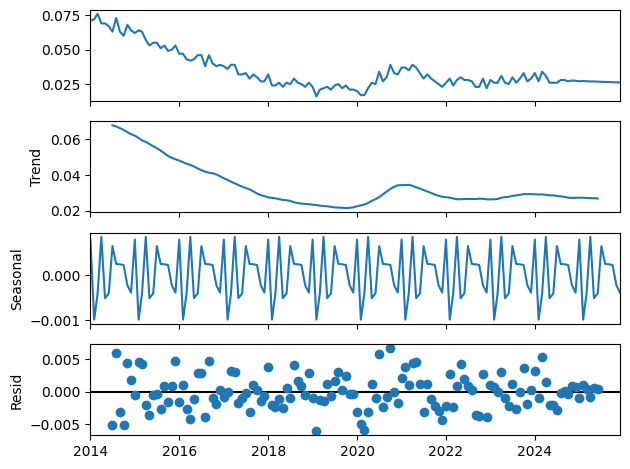

In [355]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1079.656, Time=2.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1021.296, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1053.796, Time=0.42 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1081.546, Time=1.01 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1048.169, Time=0.52 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1074.764, Time=2.48 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1083.343, Time=5.37 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=3.50 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1046.943, Time=2.98 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1075.120, Time=4.30 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1082.679, Time=7.31 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1070.073, Time=1.46 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-1042.195, Time=1.37 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-1078.029, Time=1.87 sec

Best model

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


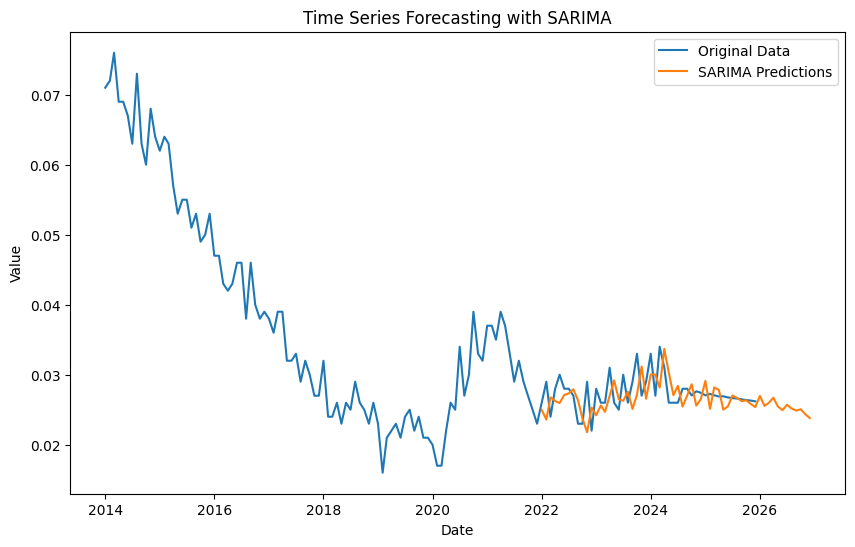

R^2 Score for SARIMA: -0.44
SARIMA - MSE: 8.019338493511304e-06, RMSE: 0.002831843656261995, MAPE: 8.19%


In [356]:
model_sarima(data_filtered,'Czechia', '25+', 'Female')

Performing stepwise search to minimize aic


C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning: m (12) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1191.554, Time=0.57 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1032.775, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1089.400, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1034.775, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1200.361, Time=0.23 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1181.438, Time=0.73 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1203.767, Time=0.19 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1191.861, Time=0.34 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1209.723, Time=0.52 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1214.634, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1212.623, Time=0.62 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1200.965, Time=0.70 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-1212.043, Time=2.10 sec
 ARIMA(

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


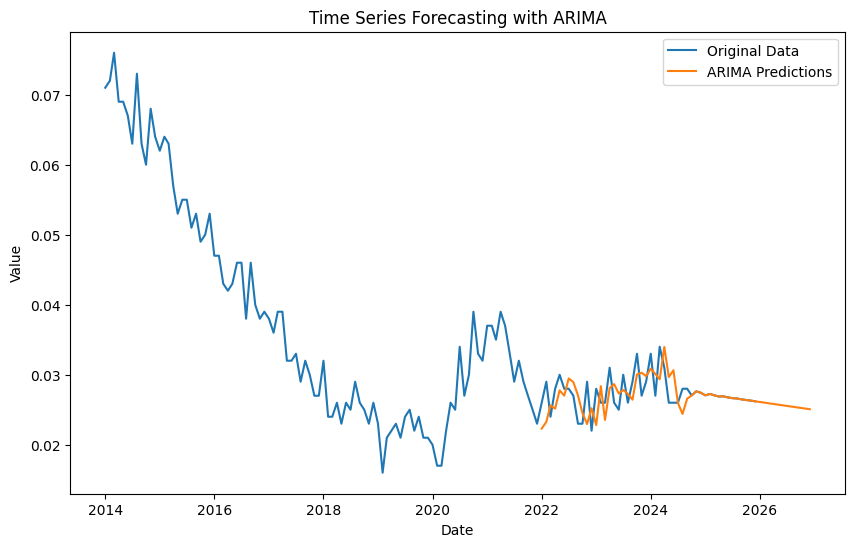

R^2 Score for ARIMA: -0.21
ARIMA - MSE: 6.704040285473595e-06, RMSE: 0.0025892161527137116, MAPE: 7.00%


In [357]:
model_arima(data_filtered,'Czechia', '25+', 'Female')

## 25+ Total

In [358]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Total')

In [359]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9807
Strong seasonality detected.


(0.9807141939580308, True)

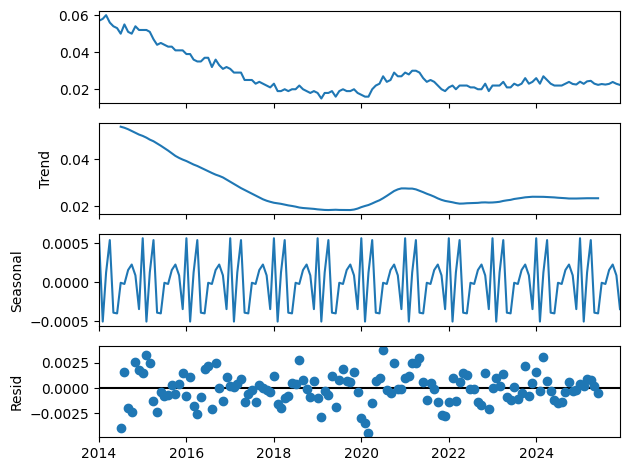

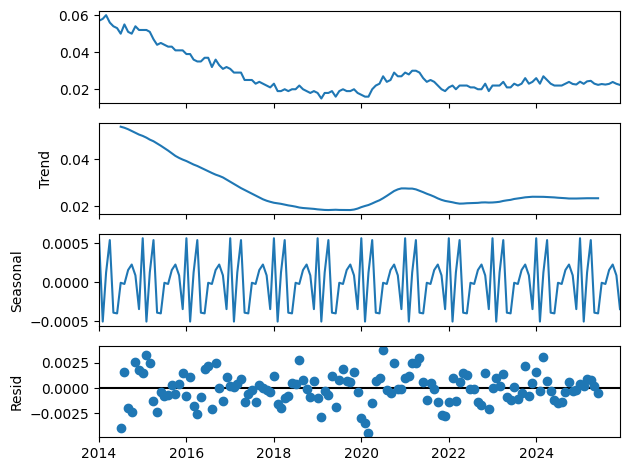

In [360]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1237.456, Time=1.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1194.314, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1221.012, Time=0.82 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1239.163, Time=0.55 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1205.024, Time=0.36 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1231.330, Time=0.94 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1221.923, Time=0.83 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1229.968, Time=2.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1228.416, Time=3.25 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1237.370, Time=4.22 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1238.388, Time=2.20 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1235.412, Time=3.01 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-1239.738, Time=2.91 sec
 ARIMA(0,1,

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


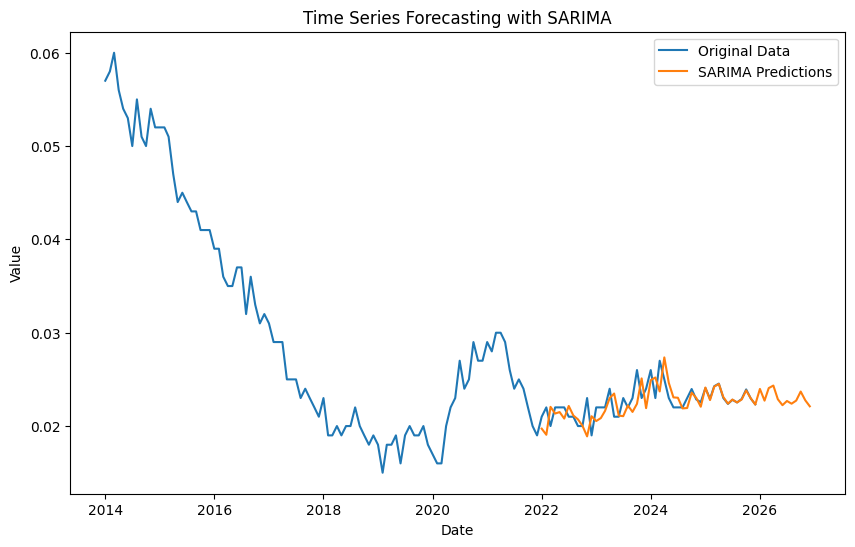

R^2 Score for SARIMA: 0.08
SARIMA - MSE: 2.229245981627553e-06, RMSE: 0.0014930659669376812, MAPE: 4.60%


In [361]:
model_sarima(data_filtered,'Czechia', '25+', 'Total')


# Canada

## 15-24 Male

In [362]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Male')

In [363]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7468
Strong seasonality detected.


(0.7467646324239714, True)

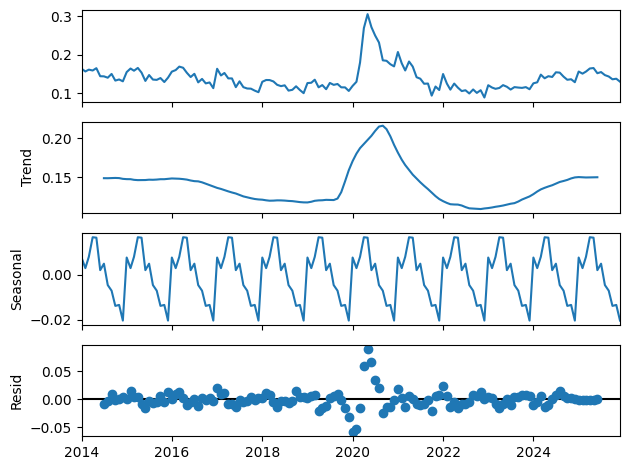

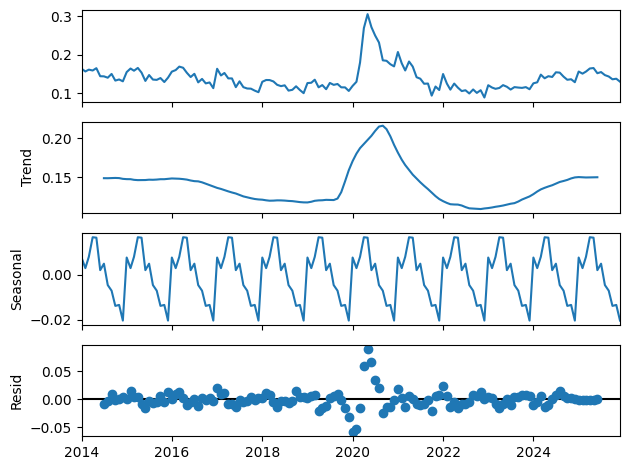

In [364]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-648.100, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-675.154, Time=0.86 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-649.485, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-683.864, Time=0.63 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.75 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-682.244, Time=0.68 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-682.098, Time=1.19 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-681.937, Time=1.47 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-683.395, Time=1.07 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-680.252, Time=1.25 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-681.877, Time=1.52 sec

Best model:  ARIMA(1,1,0)(2,1,0)[12]  

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


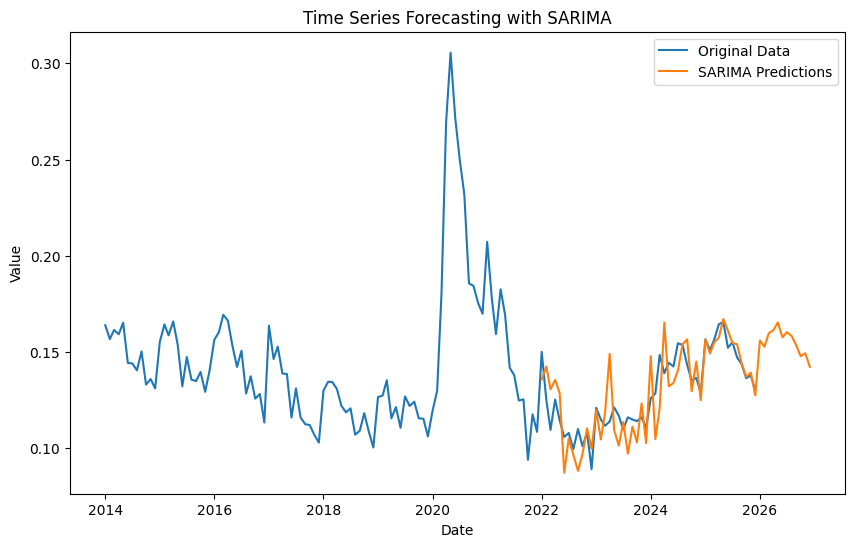

R^2 Score for SARIMA: 0.54
SARIMA - MSE: 0.00016704351937767395, RMSE: 0.01292453168891136, MAPE: 7.95%


In [365]:
model_sarima(data_filtered,'Canada', '15-24', 'Male')

## 15-24 Female

In [366]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Female')

In [367]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7007
Strong seasonality detected.


(0.700656155793713, True)

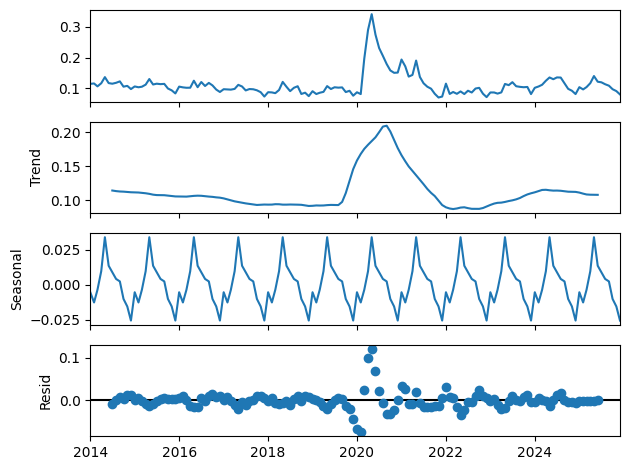

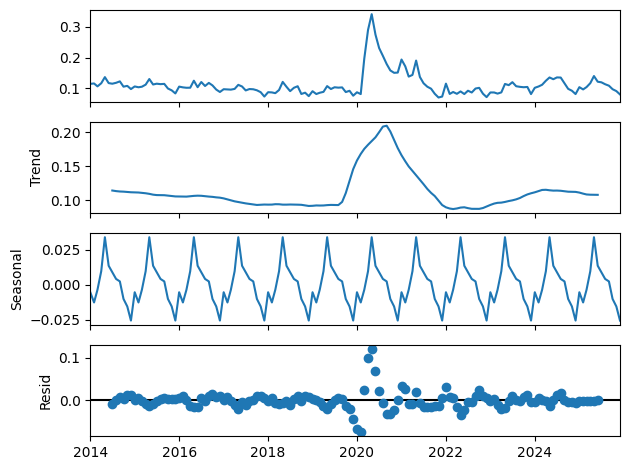

In [368]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-596.350, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-640.887, Time=0.74 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-613.833, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-650.162, Time=1.11 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=2.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-633.803, Time=0.85 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-657.391, Time=2.39 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-649.031, Time=0.60 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=3.35 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-657.573, Time=1.62 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=-648.6

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


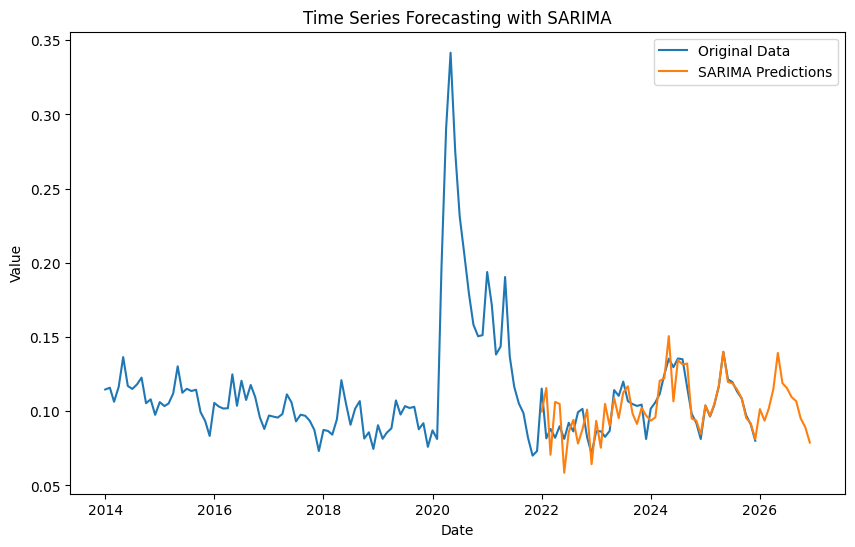

R^2 Score for SARIMA: 0.50
SARIMA - MSE: 0.0001458546131391373, RMSE: 0.012077028324018177, MAPE: 9.34%


In [369]:
model_sarima(data_filtered,'Canada', '15-24', 'Female')

## 15-24 Total

In [370]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Total')

In [371]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7273
Strong seasonality detected.


(0.7273489751521512, True)

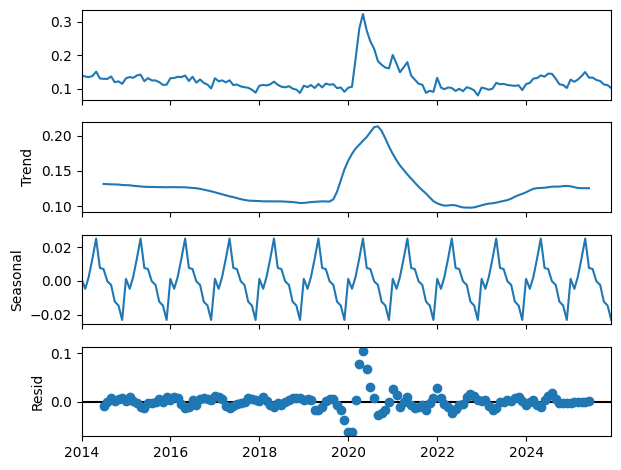

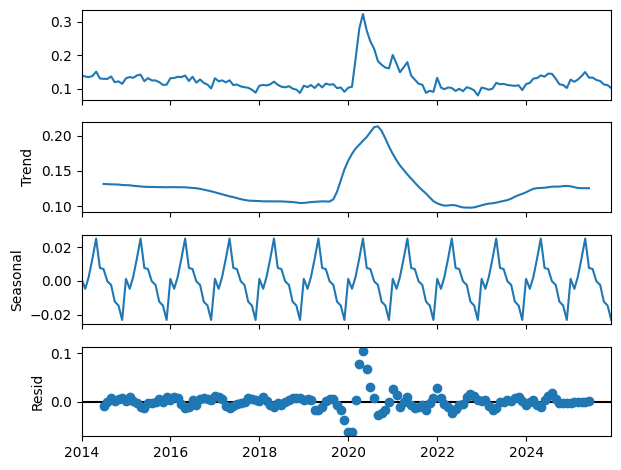

In [372]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-648.229, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-699.039, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-740.265, Time=0.85 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-677.753, Time=0.04 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-738.358, Time=1.40 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=2.60 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-704.189, Time=0.57 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=3.66 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-741.288, Time=2.94 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-682.045, Time=0.79 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=inf, Time=2.10 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-705.1

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


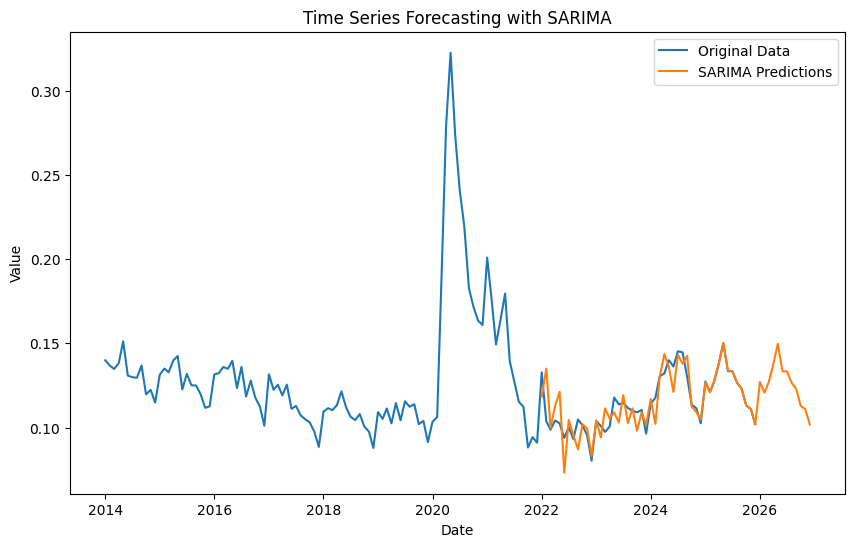

R^2 Score for SARIMA: 0.68
SARIMA - MSE: 8.230358384748147e-05, RMSE: 0.009072132265762083, MAPE: 5.36%


In [373]:
model_sarima(data_filtered,'Canada', '15-24', 'Total')

## 25+ Male

In [374]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Male')

In [375]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7755
Strong seasonality detected.


(0.7754987545134575, True)

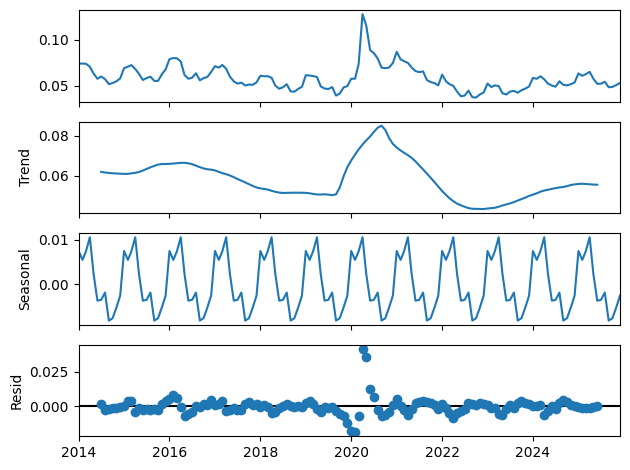

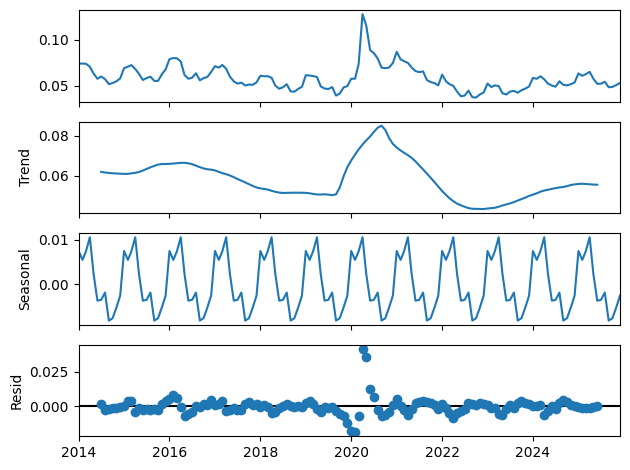

In [376]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-878.419, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-912.611, Time=1.33 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-946.563, Time=2.79 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-885.363, Time=0.41 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-934.163, Time=2.29 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=3.08 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-917.561, Time=2.18 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=5.33 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-937.205, Time=0.31 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-940.416, Time=0.45 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-941.849, Time=1.12 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]       

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


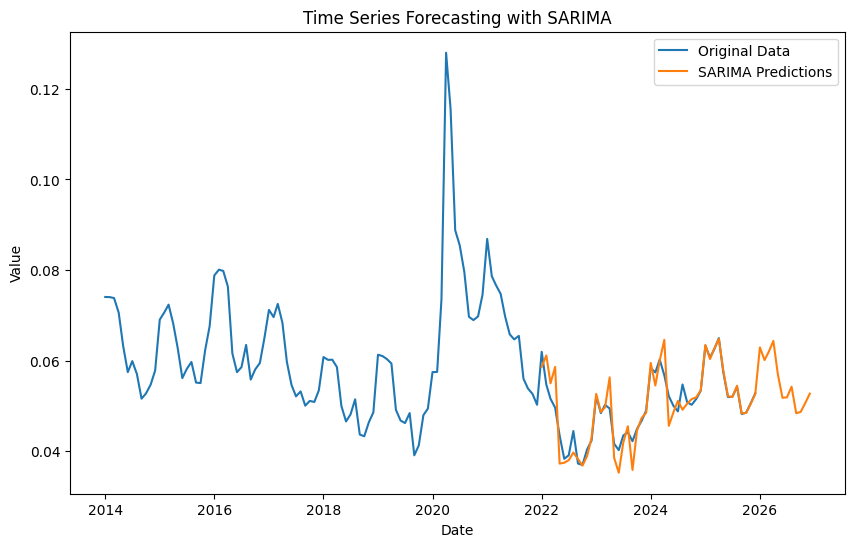

R^2 Score for SARIMA: 0.80
SARIMA - MSE: 1.0285843774498948e-05, RMSE: 0.003207155090496708, MAPE: 4.17%


In [377]:
model_sarima(data_filtered,'Canada', '25+', 'Male')

## 25+ Female

In [378]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Female')

In [379]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7778
Strong seasonality detected.


(0.7777767936667799, True)

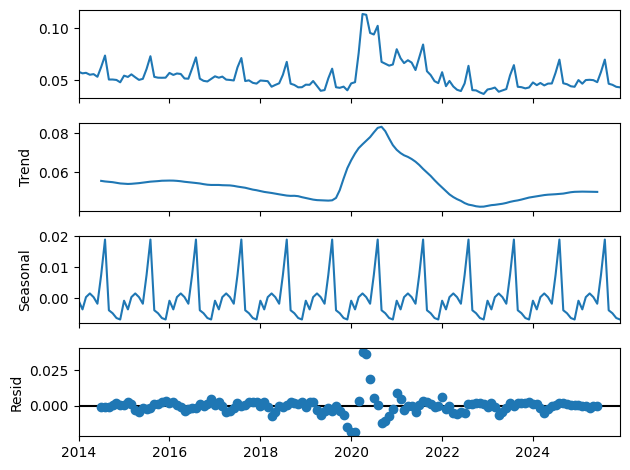

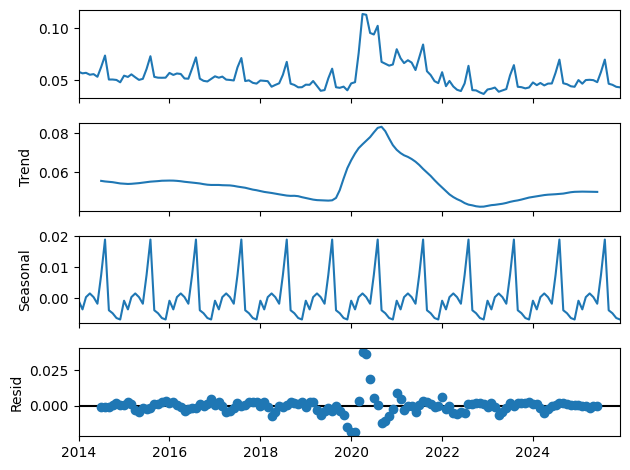

In [380]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-984.551, Time=1.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-912.099, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-951.052, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-987.518, Time=1.78 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-935.831, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-990.178, Time=3.17 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-958.714, Time=0.65 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-977.673, Time=2.61 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-965.153, Time=0.83 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-980.332, Time=1.60 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-955.650, Time=0.43 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-986.621, Time=2.18 sec
 ARIMA(0,1,2)(1,1,1)[12]     

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


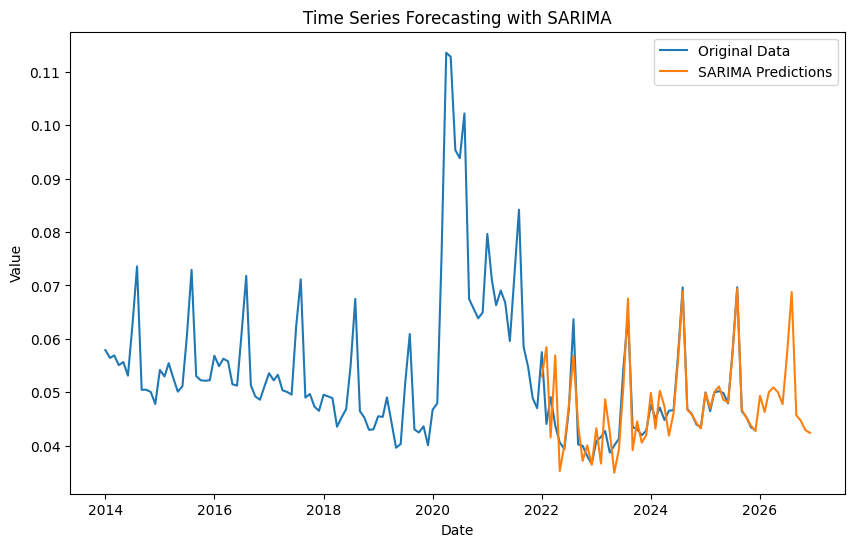

R^2 Score for SARIMA: 0.73
SARIMA - MSE: 1.599340266882147e-05, RMSE: 0.00399917524857582, MAPE: 5.64%


In [381]:
model_sarima(data_filtered,'Canada', '25+', 'Female')

## 25+ Total

In [382]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Total')

In [383]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7562
Strong seasonality detected.


(0.7562476650359696, True)

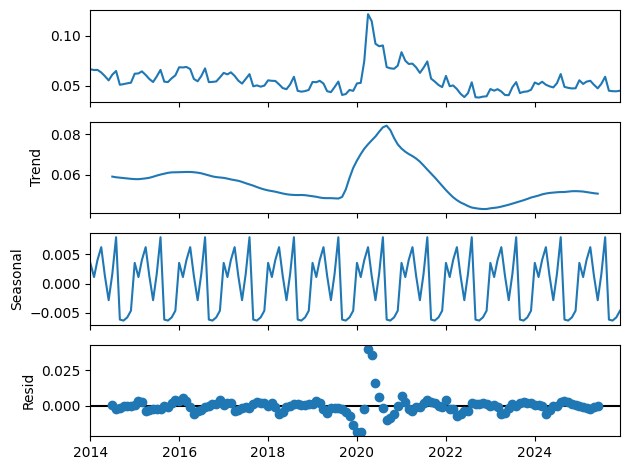

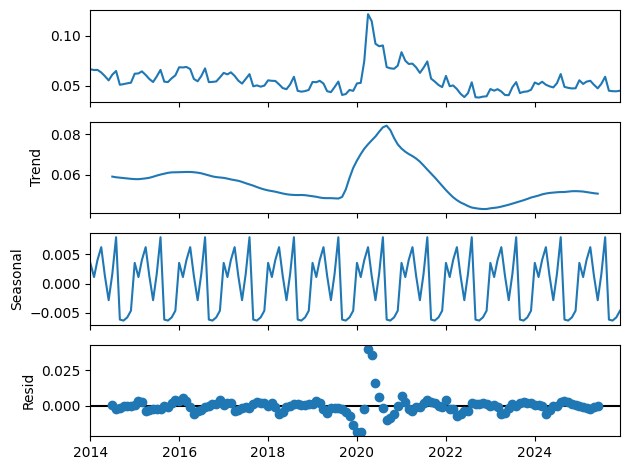

In [384]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-983.138, Time=1.53 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-907.270, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-945.811, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-984.800, Time=1.42 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-934.531, Time=0.27 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-982.091, Time=0.96 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-956.537, Time=0.37 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-988.115, Time=1.42 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-933.672, Time=0.41 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=inf, Time=3.17 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=2.58 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=-

C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\Admin\PycharmProjects\cursova\venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


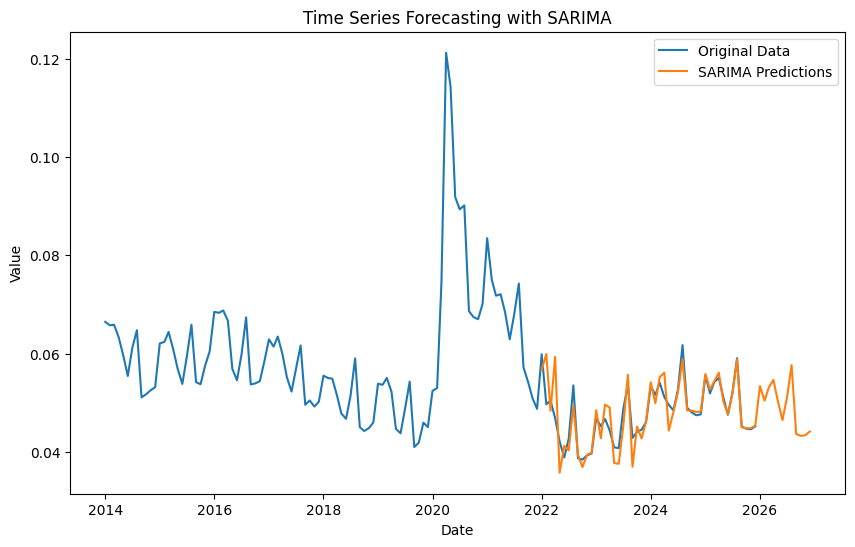

R^2 Score for SARIMA: 0.65
SARIMA - MSE: 1.1060484553422425e-05, RMSE: 0.0033257306796285273, MAPE: 4.52%


In [385]:
model_sarima(data_filtered,'Canada', '25+', 'Total')

## Final dataframe with results

In [407]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,R^2,MSE,RMSE,MAPE
0,SARIMA,France,15-24,Male,2022-01-01,0.174455,0.849258,0.000016,0.004039,0.015559
1,SARIMA,France,15-24,Male,2022-02-01,0.164221,0.849258,0.000016,0.004039,0.015559
2,SARIMA,France,15-24,Male,2022-03-01,0.174526,0.849258,0.000016,0.004039,0.015559
3,SARIMA,France,15-24,Male,2022-04-01,0.181244,0.849258,0.000016,0.004039,0.015559
4,SARIMA,France,15-24,Male,2022-05-01,0.178428,0.849258,0.000016,0.004039,0.015559
...,...,...,...,...,...,...,...,...,...,...
7375,ARIMA,Latvia,15-24,Male,2026-08-01,0.147480,0.959599,0.000063,0.007910,0.041949
7376,ARIMA,Latvia,15-24,Male,2026-09-01,0.147269,0.959599,0.000063,0.007910,0.041949
7377,ARIMA,Latvia,15-24,Male,2026-10-01,0.147043,0.959599,0.000063,0.007910,0.041949
7378,ARIMA,Latvia,15-24,Male,2026-11-01,0.146767,0.959599,0.000063,0.007910,0.041949


In [408]:
data = forecast_results_df.copy()
filtered_data = data[pd.to_datetime(data['Date']) >= pd.to_datetime("2026-01-01")]

In [388]:
filtered_data

,Model,Country,Age,Sex,Date,Forecast,R^2,MSE,RMSE,MAPE
48,SARIMA,France,15-24,Male,2026-01-01,0.160800,0.849258,0.000016,0.004039,0.015559
49,SARIMA,France,15-24,Male,2026-02-01,0.160684,0.849258,0.000016,0.004039,0.015559
50,SARIMA,France,15-24,Male,2026-03-01,0.159746,0.849258,0.000016,0.004039,0.015559
51,SARIMA,France,15-24,Male,2026-04-01,0.160432,0.849258,0.000016,0.004039,0.015559
52,SARIMA,France,15-24,Male,2026-05-01,0.158736,0.849258,0.000016,0.004039,0.015559
...,...,...,...,...,...,...,...,...,...,...
7255,SARIMA,Canada,25+,Total,2026-08-01,0.057657,0.650454,0.000011,0.003326,0.045168
7256,SARIMA,Canada,25+,Total,2026-09-01,0.043609,0.650454,0.000011,0.003326,0.045168
7257,SARIMA,Canada,25+,Total,2026-10-01,0.043244,0.650454,0.000011,0.003326,0.045168
7258,SARIMA,Canada,25+,Total,2026-11-01,0.043368,0.650454,0.000011,0.003326,0.045168


In [409]:
filtered_data.to_csv("result_sarima_arima2026.csv", index=False)